In [4]:
import sys
import pickle
from math import *
import gffutils
import importlib
import overlap_calc
importlib.reload(overlap_calc)
from overlap_calc import *
#import matplotlib; matplotlib.use("module://mplcairo.base")
from matplotlib import pyplot, figure
from IPython.display import display


In [5]:
import matplotlib
matplotlib.rcParams['pdf.fonttype'] = 42
matplotlib.rcParams['ps.fonttype'] = 42

In [6]:
def avg(l):
    num = len([x for x in l if x is not None])
    return sum((x for x in l if x is not None))/num if num > 0 else 0

def var(l):
    num = len([x for x in l if x is not None])
    mean = avg(l)
    return sum(((x-mean)*(x-mean) for x in l if x is not None))/num if num > 0 else 0

def f_or_n(f):
    try:
        return float(f)
    except ValueError:
        return 0.0



In [29]:
gene_overlap = pickle.load(open('ucsc_overlaps_300.pkl', 'rb'))
gene_overlap_elife = pickle.load(open('hs_elife_overlaps.pkl', 'rb'))

In [32]:
    import csv
    from homologs import paralogs
    ohnologs=set()
    with open('./hsapiens.Pairs.Strict.2R.txt') as file:
        for orow in csv.DictReader(file, delimiter='\t'):
            ohnologs.add(orow['Ohno1'])
            ohnologs.add(orow['Ohno2'])
    
    canons = canons_by_gene(gffutils.FeatureDB('homo.db'), r'/mnt/hddata/2/evgeny/TAU/Homo_sapiens.GRCh38.dna_sm.primary_assembly.fa')
    branch_points = paralogs(gffutils.FeatureDB('homo.db'), r'/mnt/hddata/2/evgeny/TAU/Homo_sapiens.GRCh38.dna_sm.primary_assembly.fa', '9606')
    cpg_less, cpg_full = [set(s) for s in split_overlaps(gene_overlap)]

........................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................

In [35]:
from seaborn import violinplot, despine, boxplot
from pandas import DataFrame
from matplotlib import pyplot

In [36]:
branch_order = ["Opisthokonta", "Bilateria", "Chordata", "Vertebrata", "Gnathostomata", "Euteleostomi", "Sarcopterygii", "Tetrapoda", "Amniota",
                "Mammalia", "Theria", "Eutheria", "Boreoeutheria", "Euarchontoglires", "Primates", "Haplorrhini", "Simiiformes", "Catarrhini",
                "Hominoidea", "Hominidae", "Homininae", "Homo sapiens"]
frame=DataFrame.from_records(sum([[(s, (g[0] in cpg_full) + (g[1] in cpg_full), g[2], g[3], g[6], g[4], g[5], g[0], g[1]) for g in p] for s,p in ((s, branch_points[s]) for s in branch_order)], []), columns=["Branch point", "CpG-ness", "dN", "dS", "Similarity", "Length", "Distance", "g1", "g2"])
import utils
from math import isnan
frame=utils.partition_bins(frame, frame.apply(lambda p: -p['dS'] if not isnan(p['dS']) and p['dS'] < 2.0 else -2.0, axis=1), 24, 'dSbin')

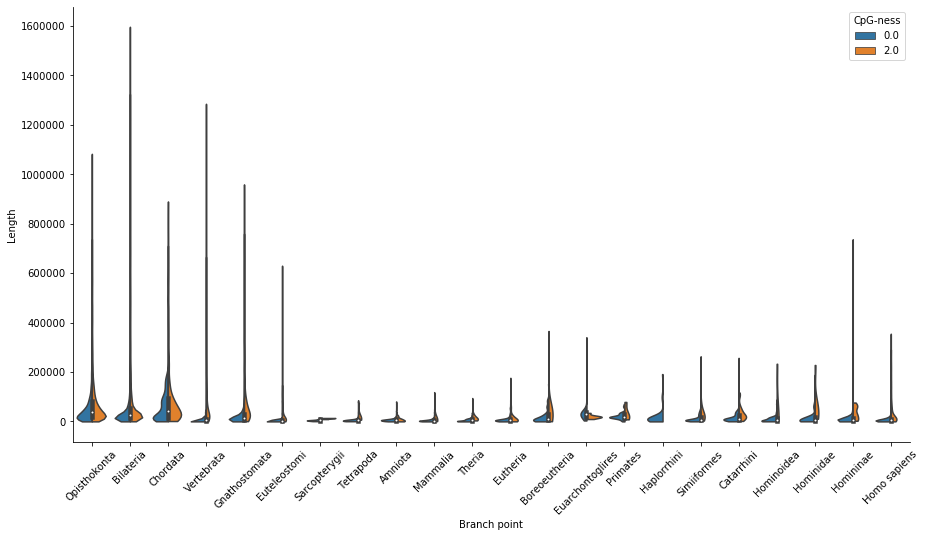

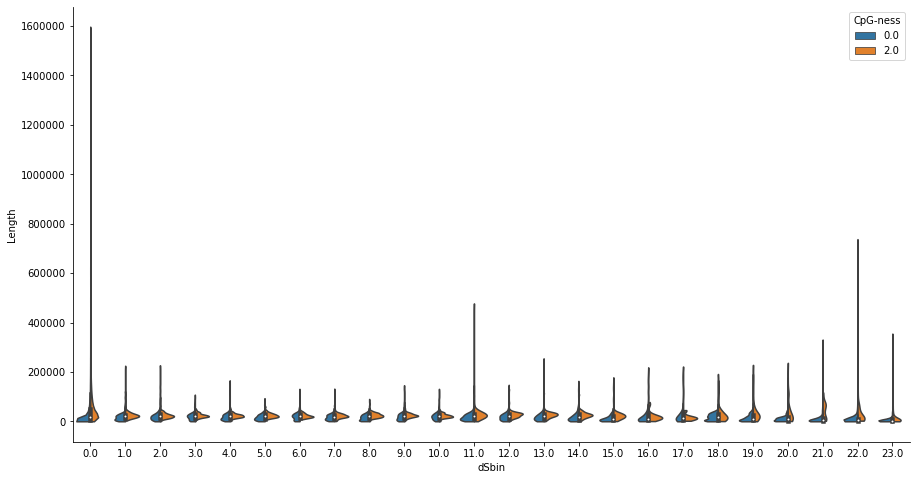

In [8]:
from matplotlib import pyplot
from seaborn import violinplot
fig, ax = pyplot.subplots(figsize=(15,8))
pyplot.xticks(rotation=45)
violinplot(ax=ax, x="Branch point", y="Length", hue="CpG-ness", cut=0, data=frame.where(frame["CpG-ness"] != 1), split=True)
despine()
fig, ax = pyplot.subplots(figsize=(15,8))
violinplot(ax=ax, x="dSbin", y="Length", hue="CpG-ness", cut=0, data=frame.where(frame["CpG-ness"] != 1), split=True)
despine()

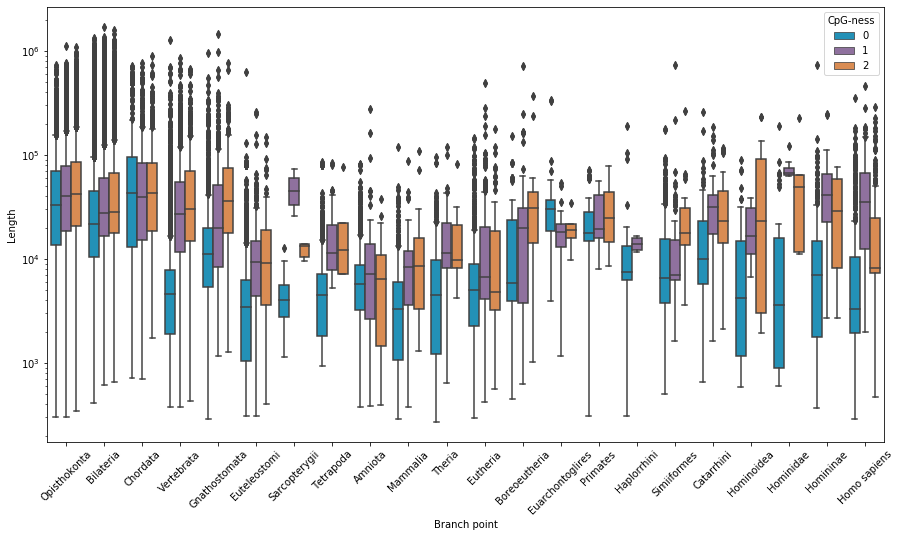

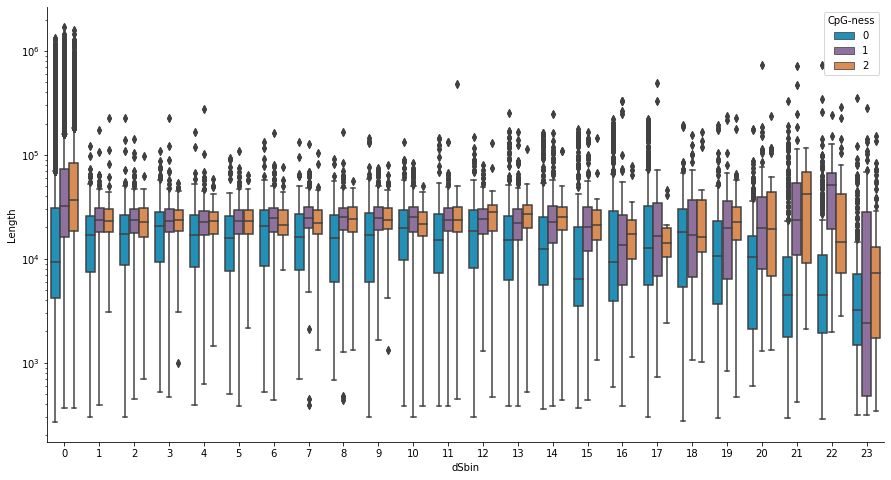

In [9]:
from matplotlib.pyplot import show
from seaborn import boxplot
fig, ax = pyplot.subplots(figsize=(15,8))
pyplot.xticks(rotation=45)
ax.set_yscale('log')
boxplot(ax=ax, x="Branch point", y="Length", hue="CpG-ness", data=frame, palette=['#0b9dcf','#926aa5', '#ef893d'])
fig, ax = pyplot.subplots(figsize=(15,8))
ax.set_yscale('log')
boxplot(ax=ax, x="dSbin", y="Length", hue="CpG-ness", data=frame, palette=['#0b9dcf','#926aa5', '#ef893d'])
despine()

/home/gencpg/.local/lib/python3.8/site-packages/seaborn/utils.py:505: FutureWarning: This function is deprecated and will be removed in a future version
  warnings.warn(msg, FutureWarning)
/home/gencpg/.local/lib/python3.8/site-packages/seaborn/utils.py:505: FutureWarning: This function is deprecated and will be removed in a future version
  warnings.warn(msg, FutureWarning)
/home/gencpg/.local/lib/python3.8/site-packages/seaborn/utils.py:505: FutureWarning: This function is deprecated and will be removed in a future version
  warnings.warn(msg, FutureWarning)
/home/gencpg/.local/lib/python3.8/site-packages/seaborn/utils.py:505: FutureWarning: This function is deprecated and will be removed in a future version
  warnings.warn(msg, FutureWarning)
/home/gencpg/.local/lib/python3.8/site-packages/seaborn/utils.py:505: FutureWarning: This function is deprecated and will be removed in a future version
  warnings.warn(msg, FutureWarning)
/home/gencpg/.local/lib/python3.8/site-packages/seaborn

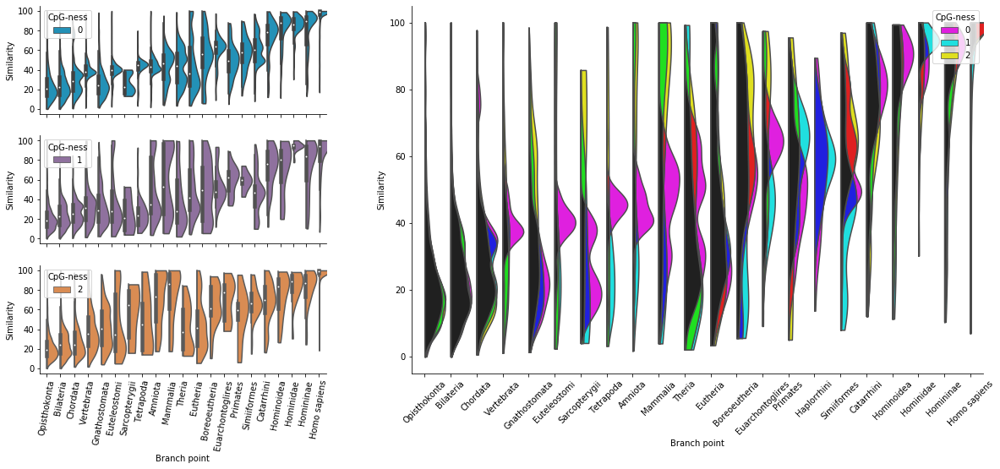

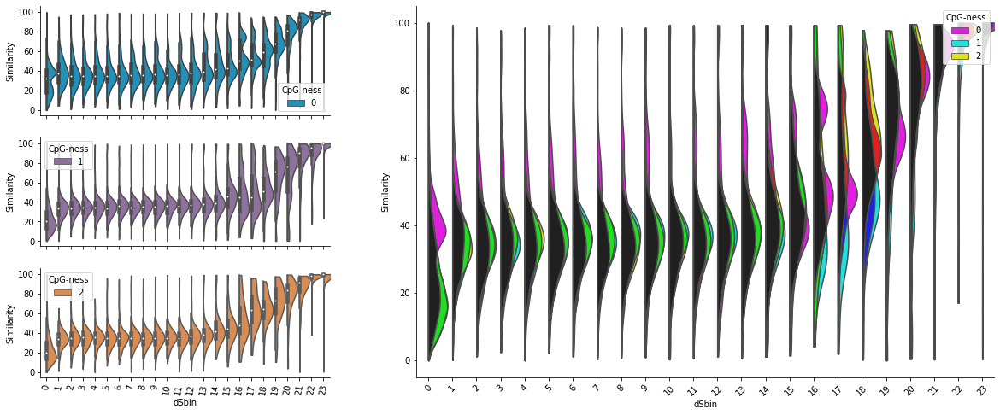

In [10]:
import importlib
import plots
importlib.reload(plots)
fig, ax = pyplot.subplots(figsize=(20,8), nrows=3, ncols=2, gridspec_kw={'width_ratios':[1,2]})
pyplot.xticks(rotation=45)
ax[0,0].tick_params('x', labelcolor='white')
ax[1,0].tick_params('x', labelcolor='white')
ax[2,0].tick_params('x', labelrotation=80)
plots.onesidedviolinplot(ax=ax[0,0], x="Branch point", y="Similarity", hue="CpG-ness", cut=0, data=frame[frame["CpG-ness"]==0], palette=['#0b9dcf'])
plots.onesidedviolinplot(ax=ax[1,0], x="Branch point", y="Similarity", hue="CpG-ness", cut=0, data=frame[frame["CpG-ness"]==1], palette=['#926aa5'])
plots.onesidedviolinplot(ax=ax[2,0], x="Branch point", y="Similarity", hue="CpG-ness", cut=0, data=frame[frame["CpG-ness"]==2], palette=['#ef893d'])
ax[0,0].set_xlabel('')
ax[1,0].set_xlabel('')
gs = ax[0, 1].get_gridspec()
for a in ax[:, -1]:
    a.remove()
axbig = fig.add_subplot(gs[:, -1])
axbig.tick_params('x', labelrotation=45)
plots.onesidedviolinplot(ax=axbig, x="Branch point", y="Similarity", hue="CpG-ness", cut=0, data=frame, inner=None, palette=['magenta','cyan', 'yellow'])
despine()
fig, ax = pyplot.subplots(figsize=(20,8), nrows=3, ncols=2, gridspec_kw={'width_ratios':[1,2]})
pyplot.xticks(rotation=45)
ax[0,0].tick_params('x', labelcolor='white')
ax[1,0].tick_params('x', labelcolor='white')
ax[2,0].tick_params('x', labelrotation=80)
plots.onesidedviolinplot(ax=ax[0,0], x="dSbin", y="Similarity", hue="CpG-ness", cut=0, data=frame[frame["CpG-ness"]==0], palette=['#0b9dcf'])
plots.onesidedviolinplot(ax=ax[1,0], x="dSbin", y="Similarity", hue="CpG-ness", cut=0, data=frame[frame["CpG-ness"]==1], palette=['#926aa5'])
plots.onesidedviolinplot(ax=ax[2,0], x="dSbin", y="Similarity", hue="CpG-ness", cut=0, data=frame[frame["CpG-ness"]==2], palette=['#ef893d'])
ax[0,0].set_xlabel('')
ax[1,0].set_xlabel('')
gs = ax[0, 1].get_gridspec()
for a in ax[:, -1]:
    a.remove()
axbig = fig.add_subplot(gs[:, -1])
axbig.tick_params('x', labelrotation=45)   
plots.onesidedviolinplot(ax=axbig, x="dSbin", y="Similarity", hue="CpG-ness", cut=0, data=frame, inner=None, palette=['magenta','cyan', 'yellow'])
despine()

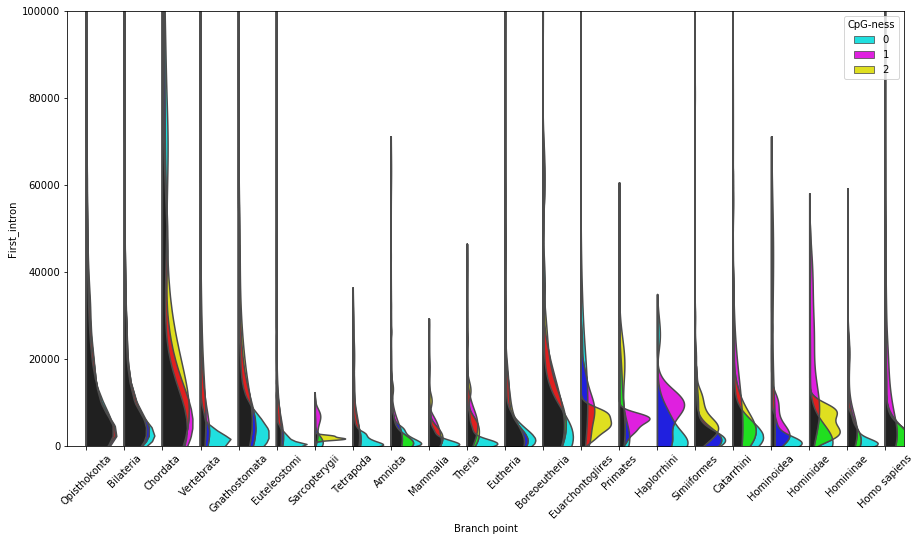

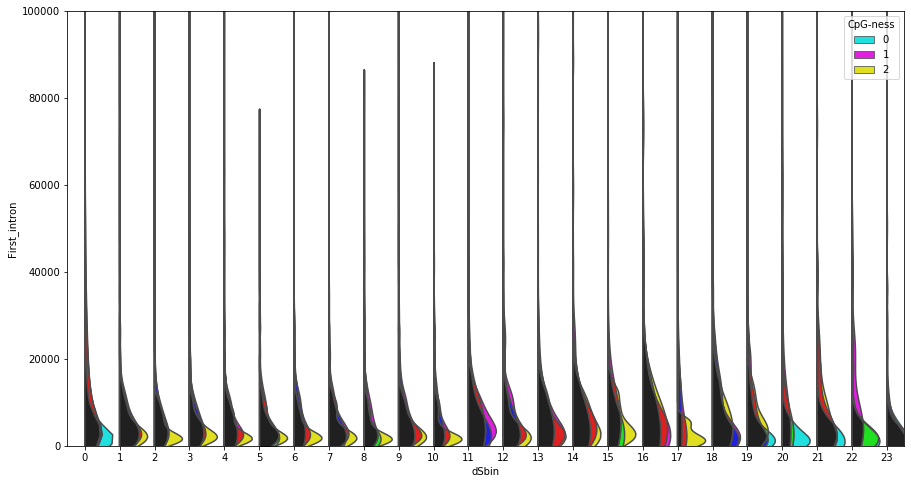

In [11]:
from seaborn import boxplot
from plots import onesidedviolinplot
fig, ax = pyplot.subplots(figsize=(15,8))
ax.set_ylim(0, 100000)
pyplot.xticks(rotation=45)
onesidedviolinplot(ax=ax, x="Branch point", y="First_intron", hue="CpG-ness", data=frame.assign(First_intron=lambda x: [(canons[p['g1']][2]+canons[p['g2']][2])/2 for p in x.iloc]), inner=None, palette=['cyan', 'magenta', 'yellow'])
fig, ax = pyplot.subplots(figsize=(15,8))
ax.set_ylim(0, 100000)
onesidedviolinplot(ax=ax, x="dSbin", y="First_intron", hue="CpG-ness", data=frame.assign(First_intron=lambda x: [(canons[p['g1']][2]+canons[p['g2']][2])/2 for p in x.iloc]), inner=None, palette=['cyan', 'magenta', 'yellow'])


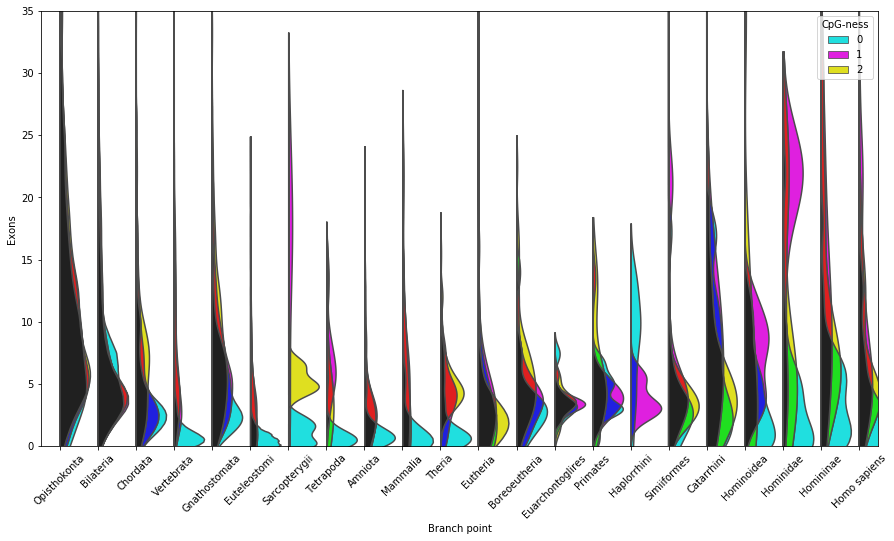

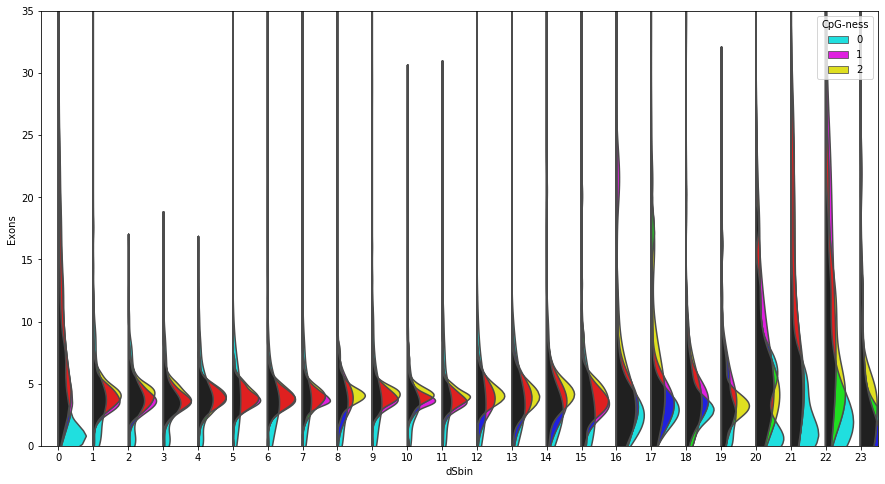

In [12]:
from seaborn import boxplot
from plots import onesidedviolinplot
fig, ax = pyplot.subplots(figsize=(15,8))
ax.set_ylim(0, 35)
pyplot.xticks(rotation=45)
onesidedviolinplot(ax=ax, x="Branch point", y="Exons", hue="CpG-ness", data=frame.assign(Exons=lambda x: [(canons[p['g1']][3]+canons[p['g2']][3])/2 for p in x.iloc]), inner=None, palette=['cyan', 'magenta', 'yellow'])
fig, ax = pyplot.subplots(figsize=(15,8))
ax.set_ylim(0, 35)
onesidedviolinplot(ax=ax, x="dSbin", y="Exons", hue="CpG-ness", data=frame.assign(Exons=lambda x: [(canons[p['g1']][3]+canons[p['g2']][3])/2 for p in x.iloc]), inner=None, palette=['cyan', 'magenta', 'yellow'])

Those outliers (spines) are really interfering with our understanding of what's going on.
We'd like to zoom in on the bulk of the data:

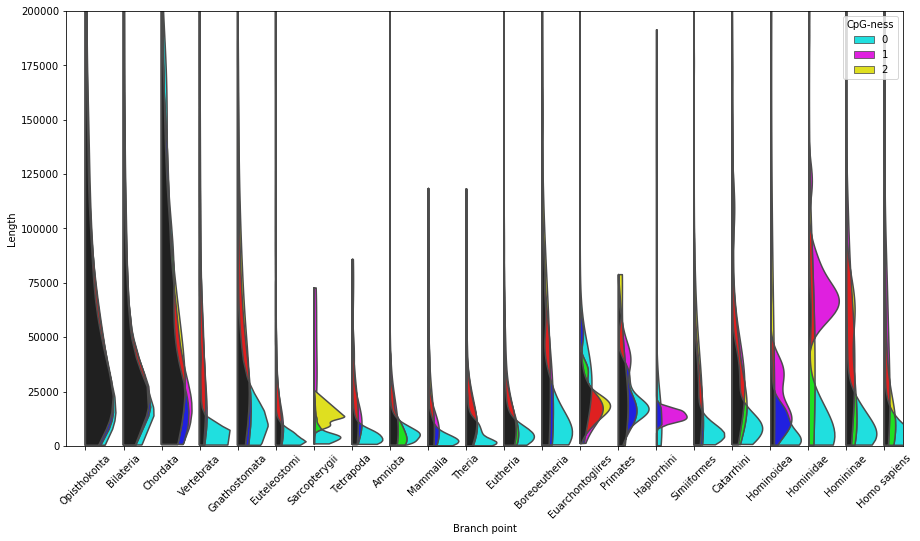

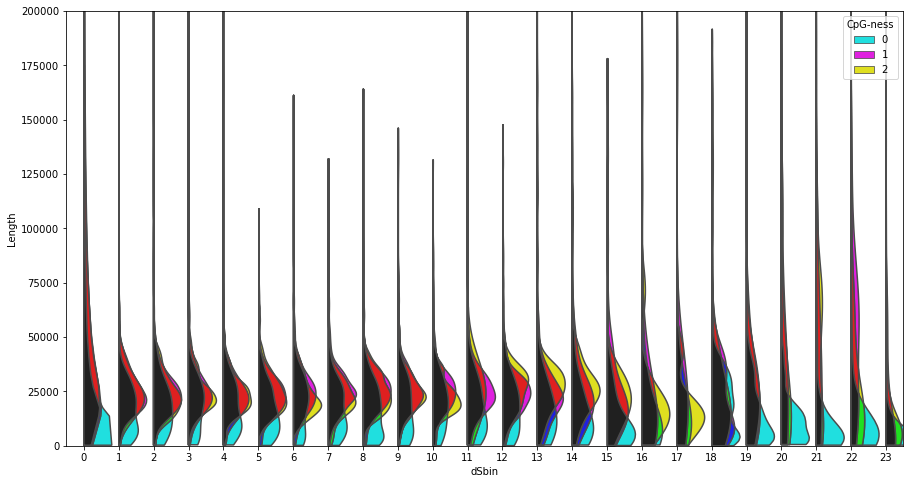

In [13]:
fig, ax = pyplot.subplots(figsize=(15,8))
pyplot.xticks(rotation=45)
ax.set_ylim(0, 200000)
onesidedviolinplot(ax=ax, x="Branch point", y="Length", hue="CpG-ness", cut=0, data=frame, inner=None, palette=['cyan', 'magenta', 'yellow'])
fig, ax = pyplot.subplots(figsize=(15,8))
ax.set_ylim(0, 200000)
onesidedviolinplot(ax=ax, x="dSbin", y="Length", hue="CpG-ness", cut=0, data=frame, inner=None, palette=['cyan', 'magenta', 'yellow'])


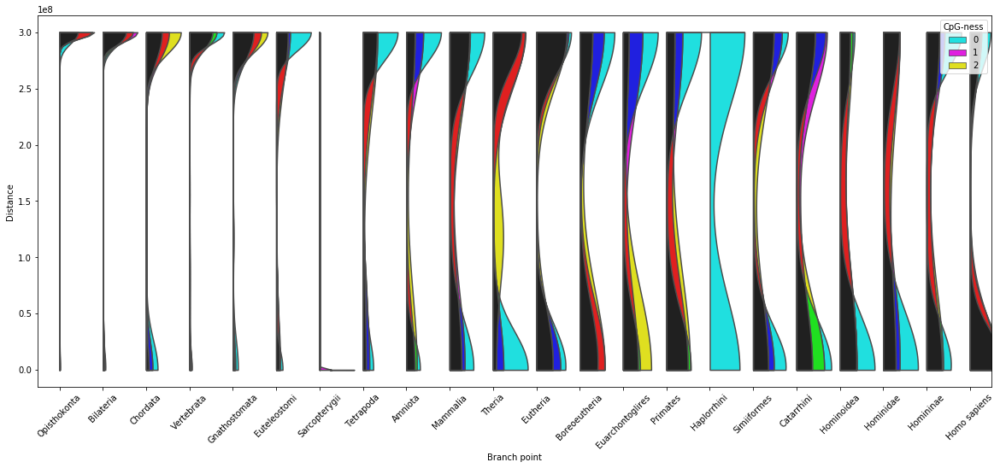

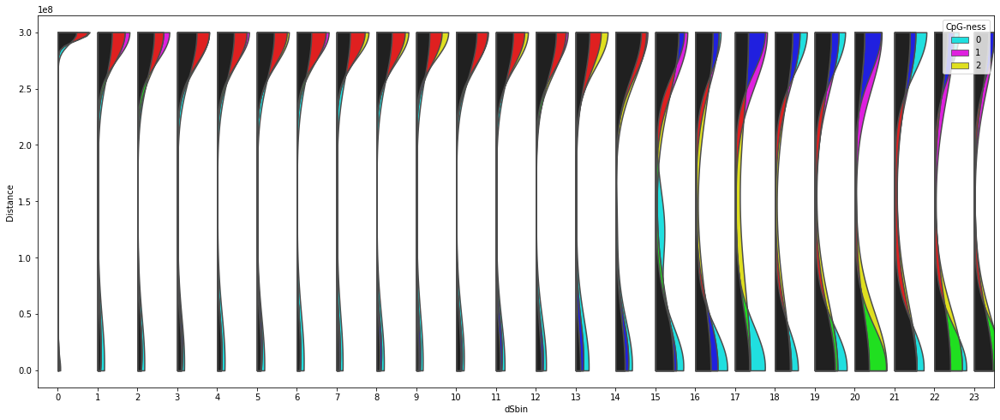

In [14]:
fig, ax = pyplot.subplots(figsize=(20, 8))
pyplot.xticks(rotation=45)
onesidedviolinplot(ax=ax, x="Branch point", y="Distance", hue="CpG-ness", cut=0, data=frame, inner=None, palette=['cyan', 'magenta', 'yellow'])
fig, ax = pyplot.subplots(figsize=(20, 8))
onesidedviolinplot(ax=ax, x="dSbin", y="Distance", hue="CpG-ness", cut=0, data=frame, inner=None, palette=['cyan', 'magenta', 'yellow'])


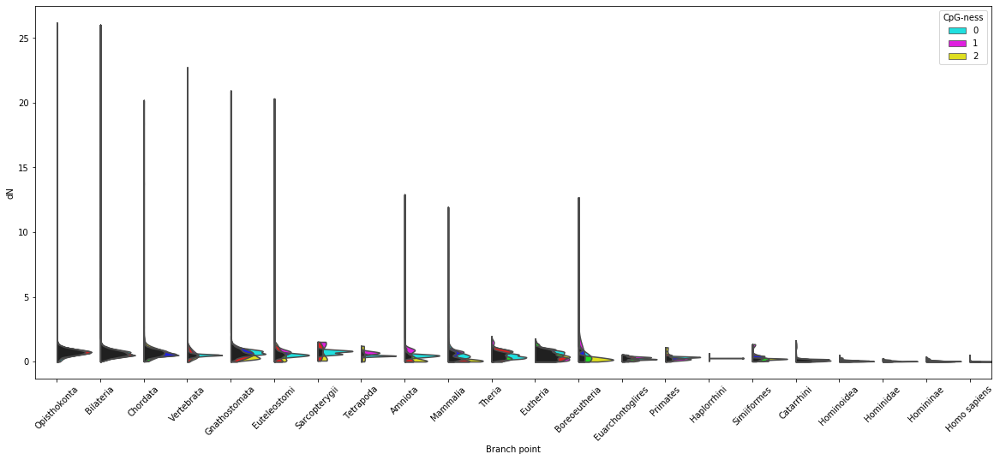

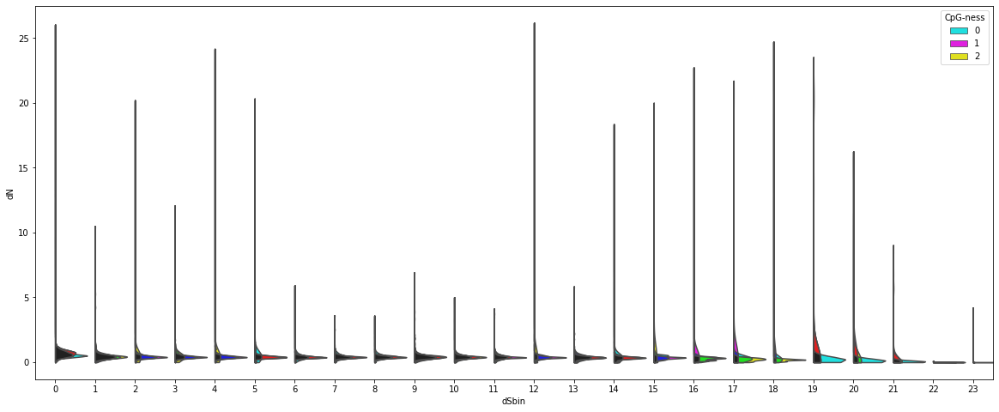

In [15]:
fig, ax = pyplot.subplots(figsize=(20, 8))
pyplot.xticks(rotation=45)
onesidedviolinplot(ax=ax, x="Branch point", y="dN", hue="CpG-ness", cut=0, data=frame, inner=None, palette=['cyan', 'magenta', 'yellow'])
fig, ax = pyplot.subplots(figsize=(20, 8))
onesidedviolinplot(ax=ax, x="dSbin", y="dN", hue="CpG-ness", cut=0, data=frame, inner=None, palette=['cyan', 'magenta', 'yellow'])


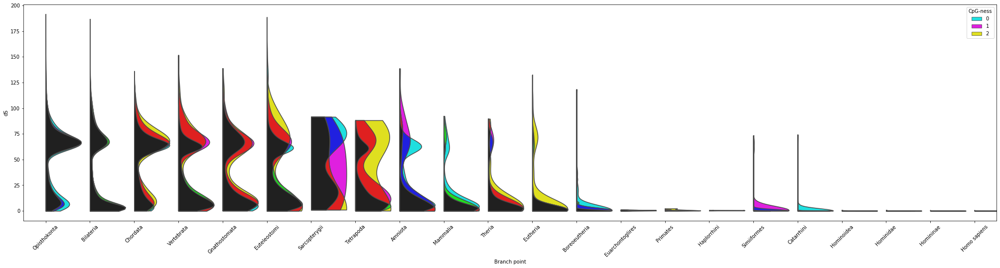

In [16]:
fig, ax = pyplot.subplots(figsize=(35, 8))
pyplot.xticks(rotation=45)
onesidedviolinplot(ax=ax, x="Branch point", y="dS", hue="CpG-ness", cut=0, data=frame, inner=None, scale="count", palette=['cyan', 'magenta', 'yellow'])

The median in this one appears to jump _way_ too much

Maybe filter out the strong non-silent mutatinos, which produce those spikes?

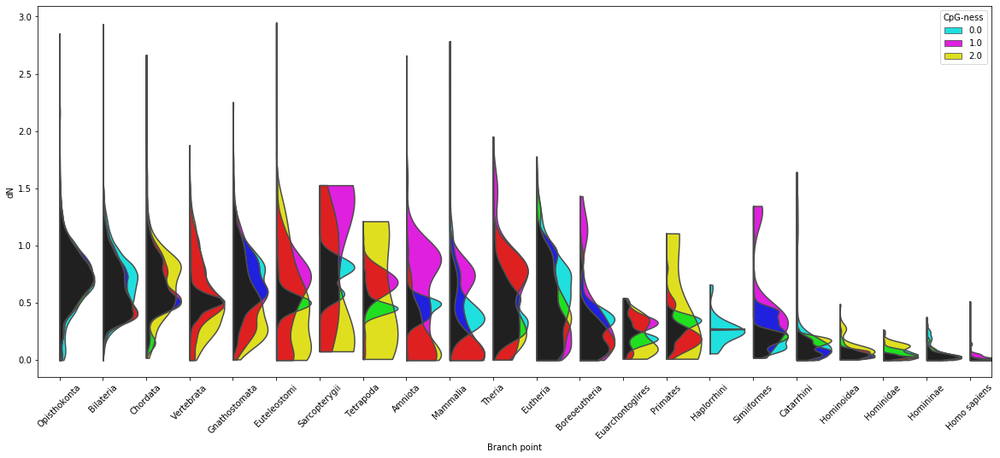

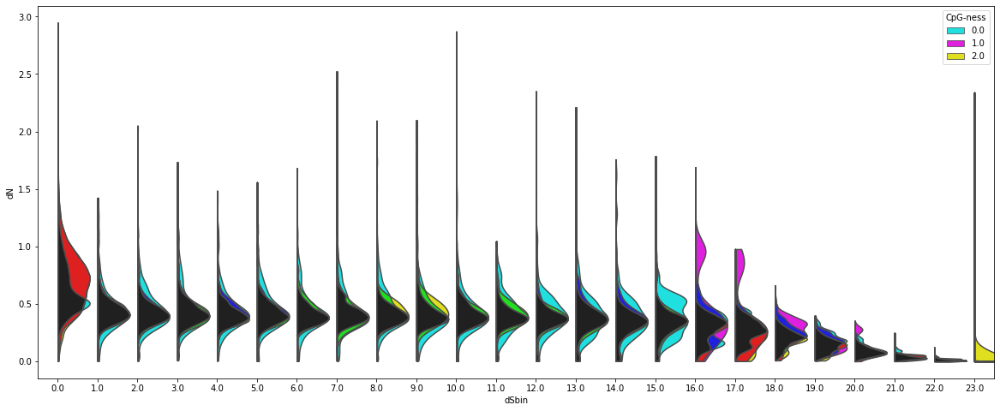

In [17]:
fig, ax = pyplot.subplots(figsize=(20, 8))
pyplot.xticks(rotation=45)
onesidedviolinplot(ax=ax, x="Branch point", y="dN", hue="CpG-ness", cut=0, data=frame.where((frame["dN"] < 3.0)), inner=None, scale="count", palette=['cyan', 'magenta', 'yellow'])
fig, ax = pyplot.subplots(figsize=(20, 8))
onesidedviolinplot(ax=ax, x="dSbin", y="dN", hue="CpG-ness", cut=0, data=frame.where((frame["dN"] < 3.0)), inner=None, scale="count", palette=['cyan', 'magenta', 'yellow'])


One more time with bars:

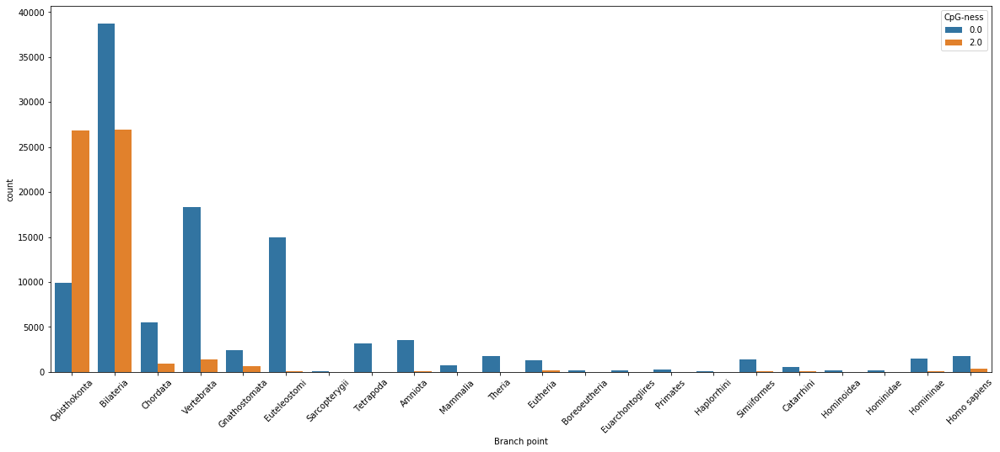

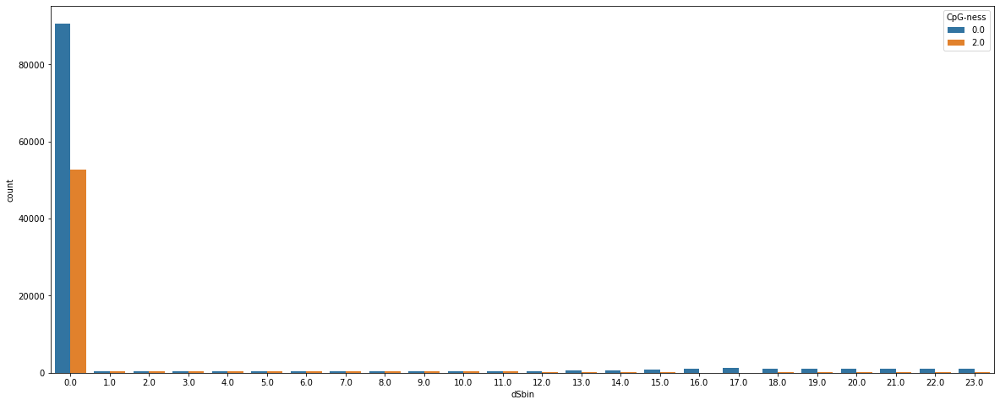

In [18]:
from seaborn import countplot
fig, ax = pyplot.subplots(figsize=(20, 8))
pyplot.xticks(rotation=45)
countplot(ax=ax, x="Branch point", hue="CpG-ness", data=frame.where((frame["CpG-ness"] != 1) & (frame["dN"] < 3.0)))
fig, ax = pyplot.subplots(figsize=(20, 8))
countplot(ax=ax, x="dSbin", hue="CpG-ness", data=frame.where((frame["CpG-ness"] != 1) & (frame["dN"] < 3.0)))

In [19]:
import pandas
euth_para=frame[(frame["Branch point"]=="Eutheria") & (frame["CpG-ness"] == 2)].filter(items=['g1', 'g2'])
set([x[5:] for x in list(euth_para['g1'])+list(euth_para['g2'])])

{'ENSG00000044090',
 'ENSG00000059769',
 'ENSG00000067048',
 'ENSG00000067167',
 'ENSG00000081377',
 'ENSG00000083844',
 'ENSG00000092345',
 'ENSG00000099974',
 'ENSG00000099977',
 'ENSG00000112659',
 'ENSG00000118689',
 'ENSG00000124208',
 'ENSG00000125148',
 'ENSG00000125821',
 'ENSG00000126214',
 'ENSG00000134590',
 'ENSG00000135314',
 'ENSG00000136273',
 'ENSG00000143811',
 'ENSG00000146063',
 'ENSG00000146963',
 'ENSG00000153896',
 'ENSG00000165879',
 'ENSG00000165943',
 'ENSG00000166707',
 'ENSG00000169715',
 'ENSG00000171772',
 'ENSG00000171928',
 'ENSG00000171970',
 'ENSG00000173875',
 'ENSG00000174460',
 'ENSG00000174599',
 'ENSG00000175106',
 'ENSG00000176396',
 'ENSG00000176401',
 'ENSG00000176903',
 'ENSG00000178988',
 'ENSG00000179010',
 'ENSG00000180626',
 'ENSG00000181274',
 'ENSG00000181896',
 'ENSG00000182013',
 'ENSG00000183718',
 'ENSG00000183837',
 'ENSG00000185130',
 'ENSG00000186453',
 'ENSG00000187193',
 'ENSG00000188868',
 'ENSG00000188996',
 'ENSG00000196466',


(g:profiler analysis)[https://biit.cs.ut.ee/gprofiler/gost?organism=hsapiens&query=ENSG00000023445%0A%20ENSG00000044090%0A%20ENSG00000059769%0A%20ENSG00000067048%0A%20ENSG00000083844%0A%20ENSG00000092345%0A%20ENSG00000099974%0A%20ENSG00000099977%0A%20ENSG00000104499%0A%20ENSG00000105202%0A%20ENSG00000105708%0A%20ENSG00000106723%0A%20ENSG00000110330%0A%20ENSG00000112659%0A%20ENSG00000124208%0A%20ENSG00000125148%0A%20ENSG00000125352%0A%20ENSG00000125821%0A%20ENSG00000133134%0A%20ENSG00000133169%0A%20ENSG00000134590%0A%20ENSG00000135314%0A%20ENSG00000135441%0A%20ENSG00000136273%0A%20ENSG00000136783%0A%20ENSG00000139797%0A%20ENSG00000143811%0A%20ENSG00000146063%0A%20ENSG00000146587%0A%20ENSG00000146963%0A%20ENSG00000147274%0A%20ENSG00000149328%0A%20ENSG00000152454%0A%20ENSG00000153896%0A%20ENSG00000158164%0A%20ENSG00000158427%0A%20ENSG00000158553%0A%20ENSG00000160886%0A%20ENSG00000164631%0A%20ENSG00000165028%0A%20ENSG00000165879%0A%20ENSG00000165943%0A%20ENSG00000166105%0A%20ENSG00000166582%0A%20ENSG00000166681%0A%20ENSG00000166707%0A%20ENSG00000166823%0A%20ENSG00000167397%0A%20ENSG00000167565%0A%20ENSG00000168148%0A%20ENSG00000169515%0A%20ENSG00000170967%0A%20ENSG00000171928%0A%20ENSG00000171970%0A%20ENSG00000173674%0A%20ENSG00000173875%0A%20ENSG00000174460%0A%20ENSG00000175106%0A%20ENSG00000176396%0A%20ENSG00000176401%0A%20ENSG00000176903%0A%20ENSG00000178947%0A%20ENSG00000180855%0A%20ENSG00000181274%0A%20ENSG00000182013%0A%20ENSG00000182952%0A%20ENSG00000183718%0A%20ENSG00000184785%0A%20ENSG00000184905%0A%20ENSG00000185130%0A%20ENSG00000186787%0A%20ENSG00000187191%0A%20ENSG00000187193%0A%20ENSG00000188095%0A%20ENSG00000188120%0A%20ENSG00000188573%0A%20ENSG00000188868%0A%20ENSG00000188996%0A%20ENSG00000196313%0A%20ENSG00000196466%0A%20ENSG00000196507%0A%20ENSG00000196757%0A%20ENSG00000196787%0A%20ENSG00000196826%0A%20ENSG00000196972%0A%20ENSG00000197019%0A%20ENSG00000197044%0A%20ENSG00000197153%0A%20ENSG00000197312%0A%20ENSG00000197409%0A%20ENSG00000197647%0A%20ENSG00000197857%0A%20ENSG00000197903%0A%20ENSG00000197933%0A%20ENSG00000198342%0A%20ENSG00000198417%0A%20ENSG00000198692%0A%20ENSG00000198830%0A%20ENSG00000203812%0A%20ENSG00000203814%0A%20ENSG00000203909%0A%20ENSG00000203950%0A%20ENSG00000204271%0A%20ENSG00000204524%0A%20ENSG00000204525%0A%20ENSG00000204592%0A%20ENSG00000204642%0A%20ENSG00000204851%0A%20ENSG00000205364%0A%20ENSG00000205916%0A%20ENSG00000205944%0A%20ENSG00000206503%0A%20ENSG00000212747%0A%20ENSG00000213516%0A%20ENSG00000213762%0A%20ENSG00000214897%0A%20ENSG00000215301%0A%20ENSG00000221900%0A%20ENSG00000223547%0A%20ENSG00000223591%0A%20ENSG00000224109%0A%20ENSG00000225110%0A%20ENSG00000233822%0A%20ENSG00000234289%0A%20ENSG00000234745%0A%20ENSG00000235961%0A%20ENSG00000240694%0A%20ENSG00000240849%0A%20ENSG00000241685%0A%20ENSG00000242852%0A%20ENSG00000244115%0A%20ENSG00000253953%0A%20ENSG00000255302%0A%20ENSG00000255439%0A%20ENSG00000255835%0A%20ENSG00000256537%0A%20ENSG00000258311%0A%20ENSG00000259024%0A%20ENSG00000268870%0A%20ENSG00000269226%0A%20ENSG00000269955%0A%20ENSG00000272196%0A%20ENSG00000272391%0A%20ENSG00000274290%0A%20ENSG00000274559%0A%20ENSG00000274750%0A%20ENSG00000275379%0A%20ENSG00000275713%0A%20ENSG00000275714%0A%20ENSG00000276547%0A%20ENSG00000276903%0A%20ENSG00000277224%0A%20ENSG00000277531%0A%20ENSG00000277775%0A%20ENSG00000278588%0A%20ENSG00000278677%0A%20ENSG00000278828%0A%20ENSG00000283093%0A%20ENSG00000284292%0A%20ENSG00000284776%0A%20ENSG00000285762%0A%20ENSG00000286098%0A%20ENSG00000286522%0A%20ENSG00000287080&ordered=false&all_results=false&no_iea=false&combined=false&measure_underrepresentation=false&domain_scope=annotated&significance_threshold_method=g_SCS&user_threshold=0.05&numeric_namespace=ENTREZGENE_ACC&sources=GO:MF,GO:CC,GO:BP,KEGG,TF,REAC,MIRNA,HPA,CORUM,HP,WP&background=]

Result: No particular functional group appears to be enriched

In [20]:
import gffutils
from overlap_calc import *
canons = canons_by_gene(gffutils.FeatureDB('homo.db'), r'/mnt/hddata/2/evgeny/TAU/Homo_sapiens.GRCh38.dna_sm.primary_assembly.fa')

In [21]:
from pandas import read_csv
genexpr = read_csv('/home/evgeny/tau/gen_cpg/GTEx_Analysis_gene_median_tpm.txt', delimiter='\t', index_col='Name')
genexpr = genexpr.drop([i for i in genexpr.index if i.count('_') > 0])
genexpr.index = [g.split('.')[0] for g in genexpr.index]

In [22]:
genexpr['cpgness'] = [gene_overlap['gene:'+g] if 'gene:'+g in gene_overlap else None for g in genexpr.index]
genexpr['cpgfull'] = [g>=0.5 for g in genexpr['cpgness']]
genexpr = genexpr.dropna()

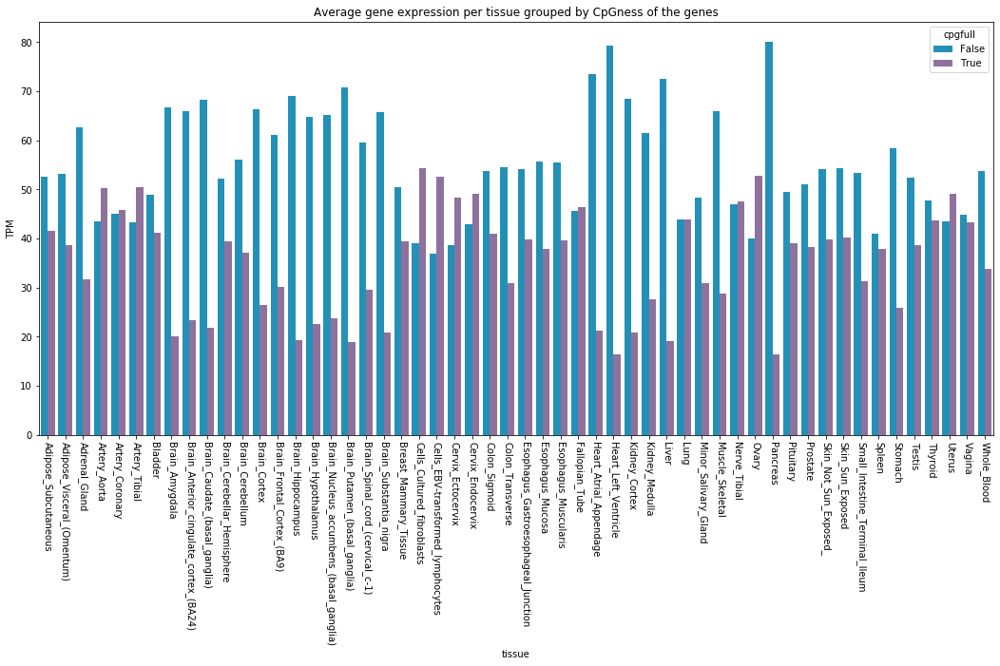

In [23]:
from seaborn import barplot
from matplotlib import pyplot 
fig, ax = pyplot.subplots(figsize=(18,8))
pyplot.xticks(rotation=-90)
#gen_exp
avgexpr=genexpr.melt(id_vars=['cpgfull'], value_vars=set(genexpr.columns).difference(['cpgness', 'cpgfull'])).groupby(['variable', 'cpgfull'], as_index=False).mean()
barplot(ax=ax, hue='cpgfull',x='variable', y='value', data=avgexpr, palette=['#0b9dcf','#926aa5', '#ef893d'])
pyplot.ylabel('TPM')
pyplot.xlabel('tissue')
pyplot.title('Average gene expression per tissue grouped by CpGness of the genes')
pyplot.show()

The distribution of the cpg-less gene expression and cpg-full gene expression is quite different in most tissues

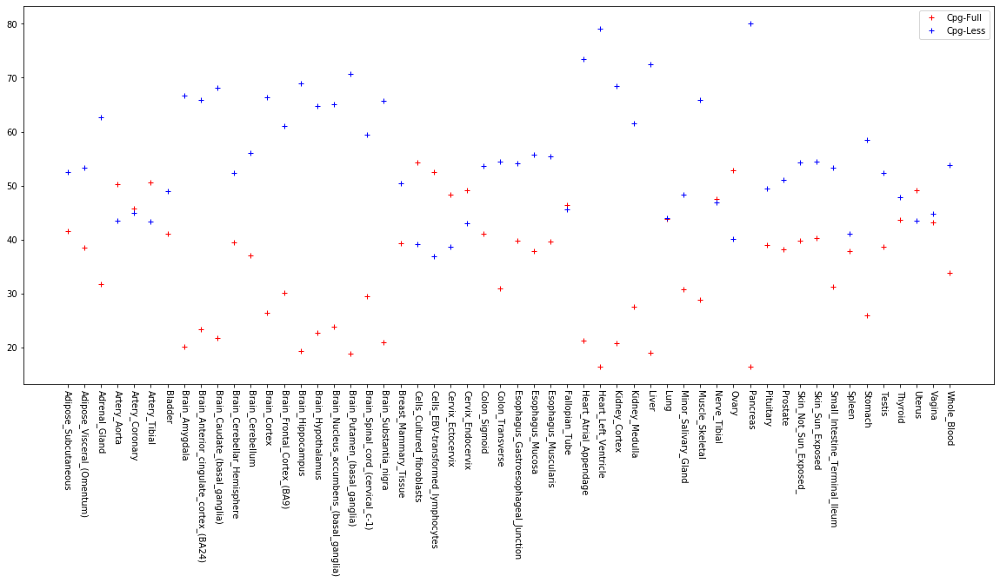

In [24]:
from matplotlib import pyplot 
fig, ax = pyplot.subplots(figsize=(20,8))
pyplot.xticks(rotation=-90)
gtex_less, gtex_full=genexpr[genexpr['cpgness'] < 0.5], genexpr[genexpr['cpgness'] >= 0.5]
del gtex_less['cpgness']; del gtex_less['cpgfull']; del gtex_full['cpgness']; del gtex_full['cpgfull']
pyplot.plot(gtex_full.mean(), 'r+', label='Cpg-Full')
pyplot.plot(gtex_less.mean(), 'b+', label='Cpg-Less')
pyplot.legend()
pyplot.show()

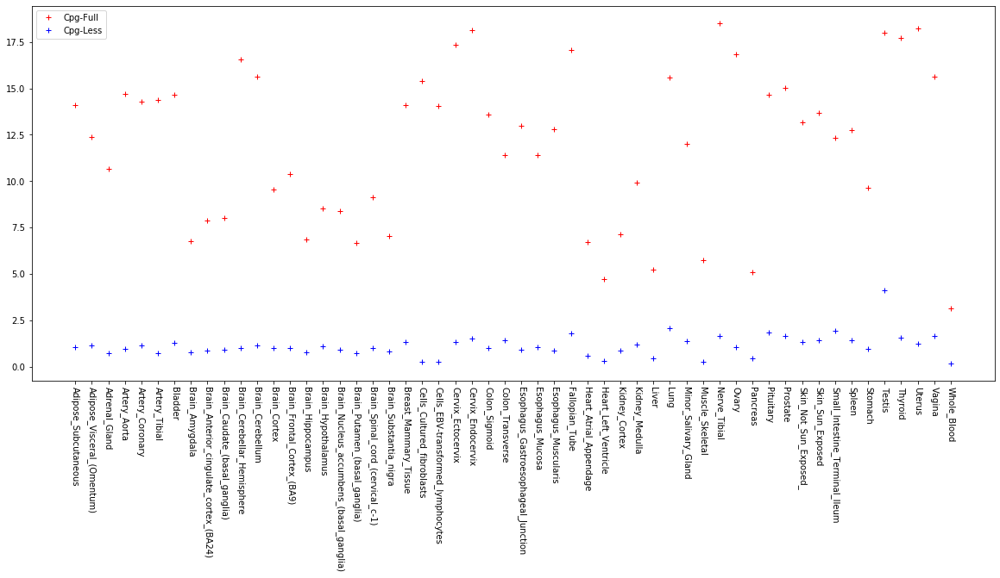

In [25]:
from matplotlib import pyplot 
fig, ax = pyplot.subplots(figsize=(20,8))
pyplot.xticks(rotation=-90)
gtex_less, gtex_full=genexpr[genexpr['cpgness'] < 0.5], genexpr[genexpr['cpgness'] >= 0.5]
del gtex_less['cpgness']; del gtex_less['cpgfull']; del gtex_full['cpgness']; del gtex_full['cpgfull']
pyplot.plot(gtex_full.median(), 'r+', label='Cpg-Full')
pyplot.plot(gtex_less.median(), 'b+', label='Cpg-Less')
pyplot.legend()
pyplot.show()

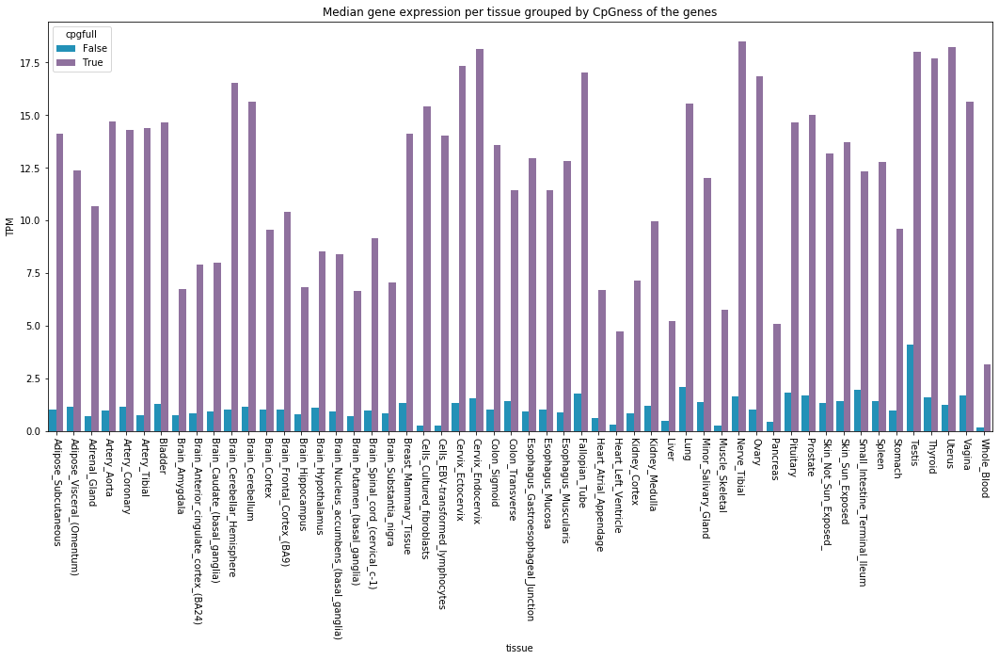

In [26]:
from seaborn import barplot
from matplotlib import pyplot 
fig, ax = pyplot.subplots(figsize=(18,8))
pyplot.xticks(rotation=-90)
#gen_exp
avgexpr=genexpr.melt(id_vars=['cpgfull'], value_vars=set(genexpr.columns).difference(['cpgness', 'cpgfull'])).groupby(['variable', 'cpgfull'], as_index=False).median()
barplot(ax=ax, hue='cpgfull',x='variable', y='value', data=avgexpr, palette=['#0b9dcf','#926aa5', '#ef893d'])
pyplot.ylabel('TPM')
pyplot.xlabel('tissue')
pyplot.title('Median gene expression per tissue grouped by CpGness of the genes')
pyplot.show()

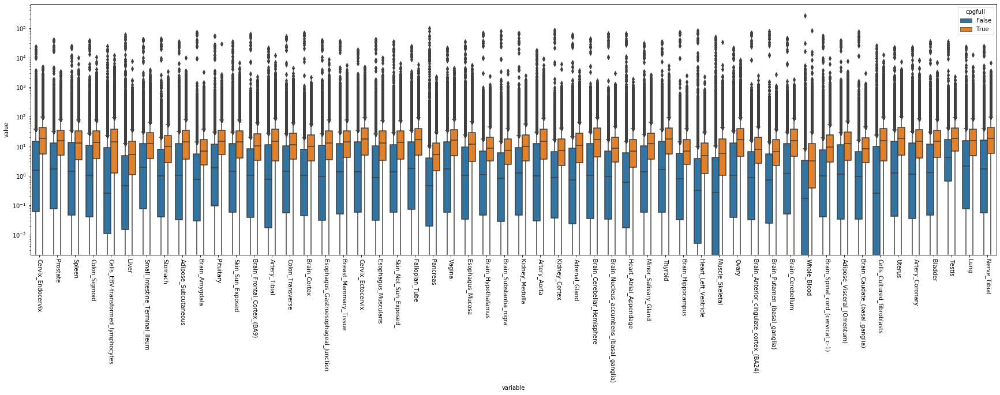

In [27]:
from seaborn import boxplot
from matplotlib import pyplot 
fig, ax = pyplot.subplots(figsize=(30,8))
ax.set_yscale('log')
pyplot.xticks(rotation=-90)
boxplot(ax=ax,data=genexpr.melt(id_vars=['cpgfull'], value_vars=set(genexpr.columns).difference(['cpgness', 'cpgfull'])), x='variable', hue='cpgfull', y='value')

In [28]:
tissues=list(set(genexpr.columns).difference(['cpgness', 'cpgfull', 'Cells_EBV-transformed_lymphocytes', 'Cells_Cultured_fibroblasts']))

In [29]:
len(tissues)

52

It appears CpG full genes tend to be more evenly expressed accross tissues, while GpG-less genes are highly expressed in a subset of tissues

In [30]:
import pandas
#Group transcripts of the same gene
gtl = gtex_less.groupby(gtex_less.index).sum().T
#Normalize the columns
gtl = gtl / gtl.sum()
#Drop genes which don't get expressed at all
gtl = gtl.T.dropna().T
l=pandas.concat([gtl[col].sort_values().reset_index(drop=True) for col in gtl], axis=1)
l
#pyplot.yscale('log')
#pyplot.plot(l)
#pyplot.show()

,ENSG00000000003,ENSG00000000005,ENSG00000000457,ENSG00000000460,ENSG00000000971,ENSG00000001036,ENSG00000001084,ENSG00000001460,ENSG00000001461,ENSG00000001561,...,ENSG00000283703,ENSG00000283740,ENSG00000283755,ENSG00000283758,ENSG00000283787,ENSG00000283886,ENSG00000283992,ENSG00000284373,ENSG00000284484,ENSG00000284526
0,0.000079,0.000000,0.004987,0.003418,0.000053,0.002704,0.003575,0.001641,0.001762,0.002088,...,0.000000,0.0,0.000000,0.000000,0.000192,0.000431,0.000045,0.000000,0.000000,0.000785
1,0.000083,0.000000,0.005266,0.003700,0.000144,0.005308,0.006044,0.002313,0.001929,0.002684,...,0.000000,0.0,0.000000,0.000000,0.000209,0.002603,0.000055,0.000000,0.000000,0.001040
2,0.002064,0.000000,0.005391,0.004245,0.000861,0.005408,0.006666,0.002387,0.002501,0.004055,...,0.000000,0.0,0.000000,0.000000,0.000211,0.003128,0.000070,0.000000,0.000000,0.001357
3,0.002149,0.000000,0.005728,0.004358,0.000905,0.006292,0.006942,0.004231,0.003168,0.004703,...,0.000000,0.0,0.000000,0.000000,0.000247,0.005385,0.000082,0.000000,0.000000,0.001479
4,0.002290,0.000000,0.005997,0.004708,0.001261,0.006419,0.007996,0.004549,0.004529,0.005240,...,0.000000,0.0,0.000000,0.000000,0.000289,0.005737,0.000136,0.000000,0.004333,0.001637
5,0.002800,0.000000,0.006208,0.005128,0.001363,0.006451,0.008758,0.005545,0.004680,0.005412,...,0.000000,0.0,0.000000,0.000000,0.000299,0.006738,0.000176,0.000000,0.004638,0.001708
6,0.004595,0.000310,0.006352,0.005194,0.001450,0.006570,0.010138,0.005754,0.004695,0.005522,...,0.000000,0.0,0.000000,0.000000,0.000328,0.006871,0.000213,0.000000,0.004638,0.001755
7,0.004711,0.000428,0.006372,0.005204,0.001506,0.006596,0.011084,0.006219,0.005796,0.005796,...,0.000000,0.0,0.000000,0.000000,0.000342,0.006896,0.000215,0.000000,0.005793,0.001875
8,0.004979,0.000463,0.007122,0.005325,0.001507,0.006746,0.011350,0.006709,0.006102,0.005951,...,0.000000,0.0,0.000000,0.000000,0.000352,0.007481,0.000222,0.000000,0.007773,0.001966
9,0.005089,0.000574,0.007275,0.005345,0.001532,0.006813,0.012282,0.008949,0.006166,0.007437,...,0.000000,0.0,0.000000,0.000000,0.000401,0.007664,0.000267,0.000000,0.007820,0.002003


In [31]:
import pandas
#Group transcripts of the same gene
gtf = gtex_full.groupby(gtex_full.index).sum().T
#Normalize the columns
gtf = gtf / gtf.sum()
#Drop genes which don't get expressed at all
gtf = gtf.T.dropna().T
f=pandas.concat([gtf[col].sort_values().reset_index(drop=True) for col in gtf], axis=1)
f

,ENSG00000000419,ENSG00000000938,ENSG00000001167,ENSG00000001497,ENSG00000001617,ENSG00000001629,ENSG00000001630,ENSG00000001631,ENSG00000002016,ENSG00000002330,...,ENSG00000282881,ENSG00000282936,ENSG00000283071,ENSG00000283199,ENSG00000283267,ENSG00000283378,ENSG00000284024,ENSG00000284188,ENSG00000284308,ENSG00000284395
0,0.004986,0.000059,0.005344,0.003169,0.000142,0.002536,0.001920,0.001959,0.002986,0.005734,...,0.000000,0.001966,0.000000,0.001068,0.000000,0.000000,0.005168,0.000000,0.000913,0.000000
1,0.006854,0.001398,0.007658,0.004351,0.000148,0.004827,0.003191,0.006665,0.005947,0.006088,...,0.000000,0.002106,0.000000,0.001177,0.000000,0.000000,0.005170,0.000000,0.000985,0.000000
2,0.007091,0.001436,0.007713,0.005056,0.001405,0.004916,0.004242,0.006771,0.006621,0.006685,...,0.000000,0.003399,0.000000,0.001194,0.002013,0.000000,0.005253,0.000000,0.002325,0.000000
3,0.007601,0.001649,0.008311,0.005891,0.001438,0.006548,0.004365,0.007254,0.007520,0.008501,...,0.000000,0.004150,0.000000,0.001207,0.002145,0.000000,0.005452,0.000000,0.002545,0.000000
4,0.008042,0.002200,0.008331,0.005980,0.001640,0.007877,0.005619,0.007439,0.007939,0.010469,...,0.000000,0.004247,0.000000,0.001246,0.003703,0.000000,0.005561,0.000000,0.003694,0.000000
5,0.008462,0.002411,0.009186,0.006187,0.001866,0.007980,0.005763,0.007873,0.008018,0.010844,...,0.000000,0.004873,0.000000,0.001322,0.003976,0.000000,0.006099,0.000000,0.004197,0.002883
6,0.008790,0.002435,0.009233,0.006674,0.002233,0.008990,0.007358,0.008189,0.008141,0.011074,...,0.000000,0.007100,0.000000,0.001475,0.004476,0.000000,0.006650,0.000000,0.004703,0.003038
7,0.008956,0.002444,0.009798,0.009567,0.002433,0.009991,0.007743,0.008882,0.008439,0.012593,...,0.000000,0.007423,0.000000,0.001552,0.004856,0.000000,0.006932,0.000000,0.005023,0.003884
8,0.009768,0.002461,0.010174,0.010372,0.002462,0.011473,0.008032,0.009490,0.008643,0.014120,...,0.000000,0.007785,0.000000,0.001681,0.005278,0.000000,0.006981,0.000000,0.006921,0.004542
9,0.010503,0.002505,0.010313,0.010979,0.002498,0.013305,0.008120,0.009608,0.009338,0.014272,...,0.000000,0.007872,0.000000,0.001702,0.005384,0.000000,0.007393,0.000000,0.007202,0.005034


In [102]:
import sklearn.cluster
km=sklearn.cluster.KMeans(n_clusters=7)
labels=km.fit(l.T.values).labels_
la=l.T.assign(labels=labels)
la

ModuleNotFoundError: No module named 'sklearn'

In [ ]:
la.query('labels==4')

In [ ]:
import sklearn.cluster
km=sklearn.cluster.KMeans(n_clusters=7)
labels=km.fit(f.T.values).labels_
fa=f.T.assign(labels=labels)
fa

In [ ]:
fa.query('labels==2')

Examining variability of expression in both subsets

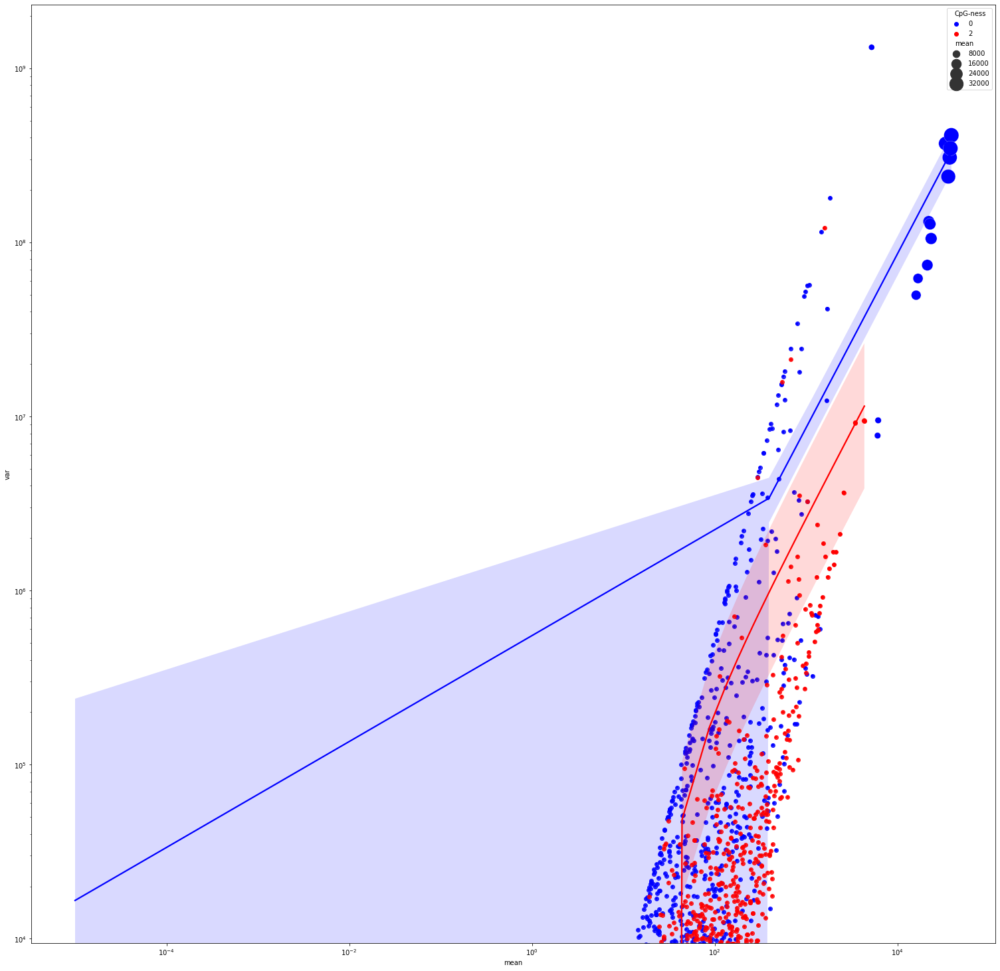

In [103]:
fig, ax = pyplot.subplots(figsize=(26,26))
from seaborn import scatterplot, regplot
from pandas import concat, Series
plot=scatterplot(ax=ax, data=concat([
  concat([Series(gtex_less.T.mean()+0.00001, name='mean'), Series(gtex_less.T.var()+0.00001, name='var'), Series([0]*len(gtex_less.index), gtex_less.index, name='CpG-ness')], axis=1),
  concat([Series(gtex_full.T.mean()+0.00001, name='mean'), Series(gtex_full.T.var()+0.00001, name='var'), Series([2]*len(gtex_full.index), gtex_full.index, name='CpG-ness')], axis=1)
]), x='mean', y='var', hue='CpG-ness', palette=['blue', 'red'], size='mean', sizes=(10,500))
regplot(ax=ax,data=concat([Series(gtex_less.T.mean()+0.00001, name='mean'), Series(gtex_less.T.var()+0.00001, name='var')], axis=1), y='var', x='mean',color="blue", label='CpG-less')
regplot(ax=ax,data=concat([Series(gtex_full.T.mean()+0.00001, name='mean'), Series(gtex_full.T.var()+0.00001, name='var')], axis=1), y='var', x='mean',color="red", label='CpG-full')
plot.set(xscale='log', yscale='log')
#ax.set_yscale('log')

#pyplot.plot(gtex_less.T.mean(), gtex_less.T.var(), 'g.')
#pyplot.plot(gtex_full.T.mean(), gtex_full.T.var(), 'r.')
pyplot.show()
#from seaborn import heatmap
#heatmap(ax=ax, data=concat([
#  concat([Series(gtex_less.T.mean()+0.00001, name='mean'), Series(gtex_less.T.var()+0.00001, name='var'), Series([0]*len(gtex_less.index), gtex_less.index, name='CpG-ness')], axis=1),
#  concat([Series(gtex_full.T.mean()+0.00001, name='mean'), Series(gtex_full.T.var()+0.00001, name='var'), Series([2]*len(gtex_full.index), gtex_full.index, name='CpG-ness')], axis=1)
#]))#, x='mean', y='var', hue='CpG-ness')
#pyplot.show()

/usr/lib/python3/dist-packages/matplotlib/cbook/__init__.py:1402: FutureWarning: Support for multi-dimensional indexing (e.g. `obj[:, None]`) is deprecated and will be removed in a future version.  Convert to a numpy array before indexing instead.
  ndim = x[:, None].ndim
/usr/lib/python3/dist-packages/matplotlib/axes/_base.py:276: FutureWarning: Support for multi-dimensional indexing (e.g. `obj[:, None]`) is deprecated and will be removed in a future version.  Convert to a numpy array before indexing instead.
  x = x[:, np.newaxis]
/usr/lib/python3/dist-packages/matplotlib/axes/_base.py:278: FutureWarning: Support for multi-dimensional indexing (e.g. `obj[:, None]`) is deprecated and will be removed in a future version.  Convert to a numpy array before indexing instead.
  y = y[:, np.newaxis]
/usr/lib/python3/dist-packages/matplotlib/cbook/__init__.py:1402: FutureWarning: Support for multi-dimensional indexing (e.g. `obj[:, None]`) is deprecated and will be removed in a future version

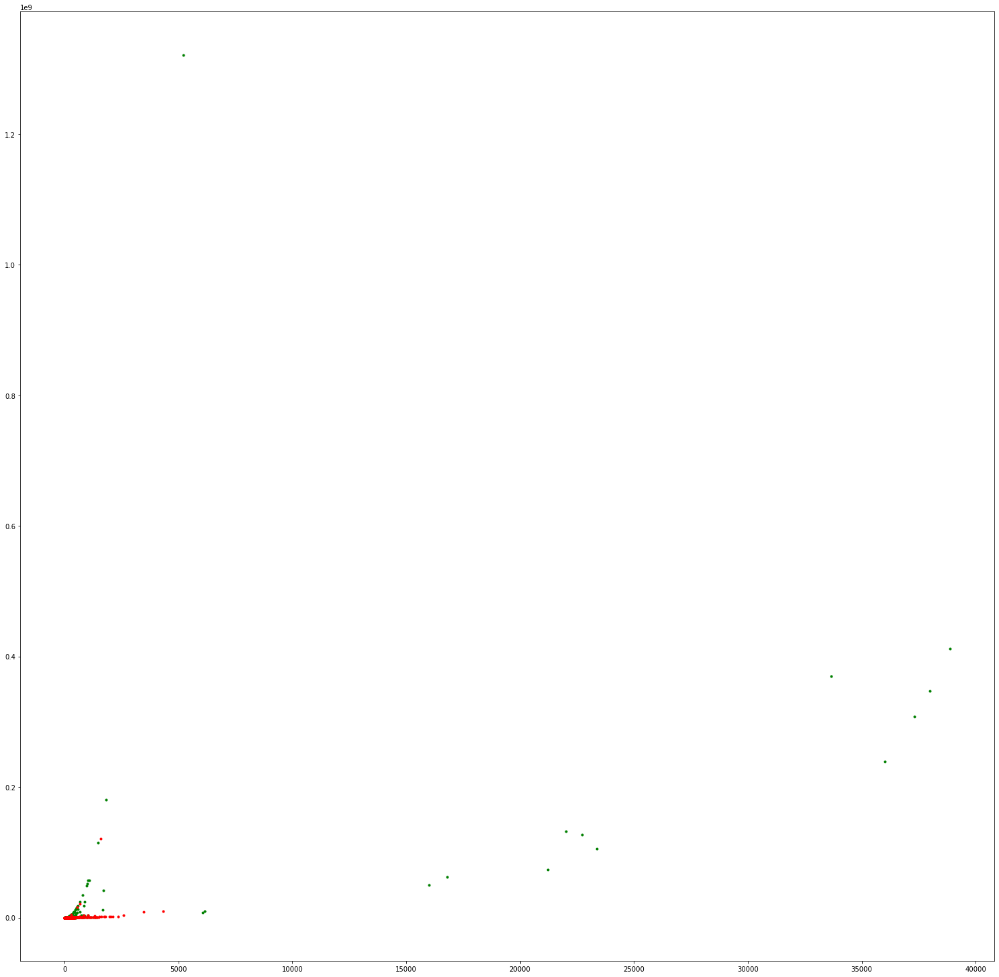

In [104]:
fig, ax = pyplot.subplots(figsize=(26,26))
#pyplot.xscale('log')
#pyplot.yscale('log')
pyplot.plot(gtex_less.groupby(gtex_less.index).sum().T.mean(), gtex_less.groupby(gtex_less.index).sum().T.var(), 'g.')
pyplot.plot(gtex_full.groupby(gtex_full.index).sum().T.mean(), gtex_full.groupby(gtex_full.index).sum().T.var(), 'r.')
pyplot.show()

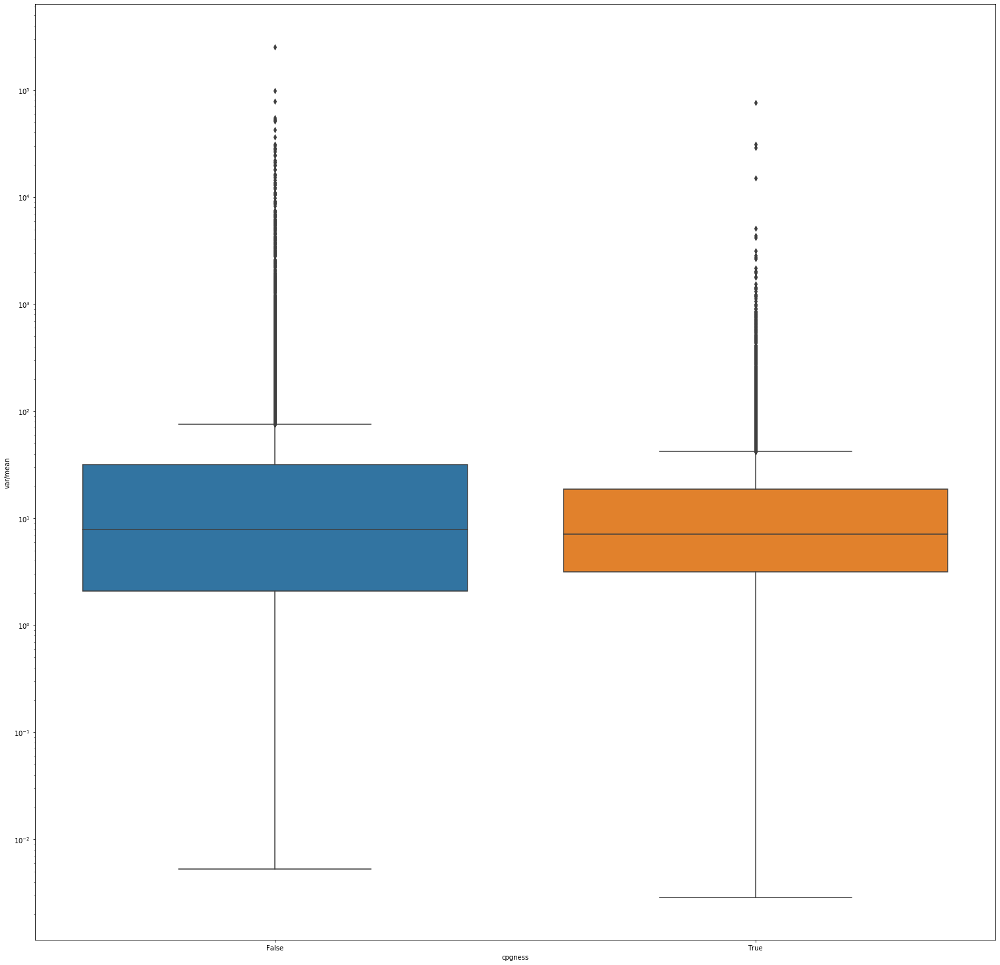

In [105]:
import pandas
from seaborn import boxplot
fig, ax = pyplot.subplots(figsize=(26,26))
pyplot.yscale('log')
arr=pandas.concat([
(gtex_less.groupby(gtex_less.index).sum().T.var()/gtex_less.groupby(gtex_less.index).sum().T.mean()).to_frame('var/mean').assign(cpgness=False),
(gtex_full.groupby(gtex_full.index).sum().T.var()/gtex_full.groupby(gtex_full.index).sum().T.mean()).to_frame('var/mean').assign(cpgness=True)])
boxplot(data=arr, y='var/mean', x='cpgness')

In [106]:
from seaborn import boxplot
from pandas import DataFrame
import ipywidgets as widgets
from ipywidgets import interact, interact_manual
#fig, ax = pyplot.subplots(figsize=(26,18))

@interact
def average_expression(min_expr=(0.0001, 0.1, 0.0001)):
    arr=pandas.concat(
    [DataFrame((gtex_less.groupby(gtex_less.index).sum().T > min_expr).sum().to_frame('expr')).assign(cpgness=False),
    DataFrame((gtex_full.groupby(gtex_full.index).sum().T > min_expr).sum().to_frame('expr')).assign(cpgness=True)]
    )
    boxplot(data=arr, y='expr', x='cpgness')


ModuleNotFoundError: No module named 'ipywidgets'

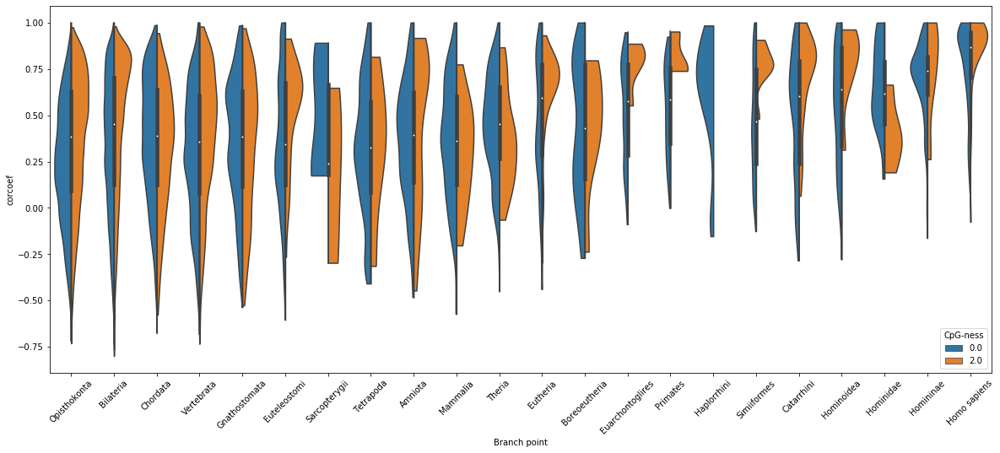

In [107]:
import scipy.stats
from seaborn import violinplot
frexpr = frame.assign(expr_corr=[scipy.stats.spearmanr(genexpr.loc[g1[5:]][tissues], genexpr.loc[g2[5:]][tissues]) if g1[5:] in genexpr.index and g2[5:] in genexpr.index and len(genexpr.loc[g1[5:]][tissues])>2 and len(genexpr.loc[g2[5:]][tissues])>2 and max(genexpr.loc[g1[5:]][tissues]) > 0.5 and max(genexpr.loc[g2[5:]][tissues]) > 0.5 else None for g1,g2 in zip(frame.g1, frame.g2)])
fig, ax = pyplot.subplots(figsize=(20, 8))
pyplot.xticks(rotation=45)
violinplot(ax=ax, x="Branch point", y="corcoef", hue="CpG-ness", cut=0, data=frexpr.assign(corcoef=[x[0] if x != None else None for x in frexpr['expr_corr']]).where(frame["CpG-ness"] != 1), split=True)

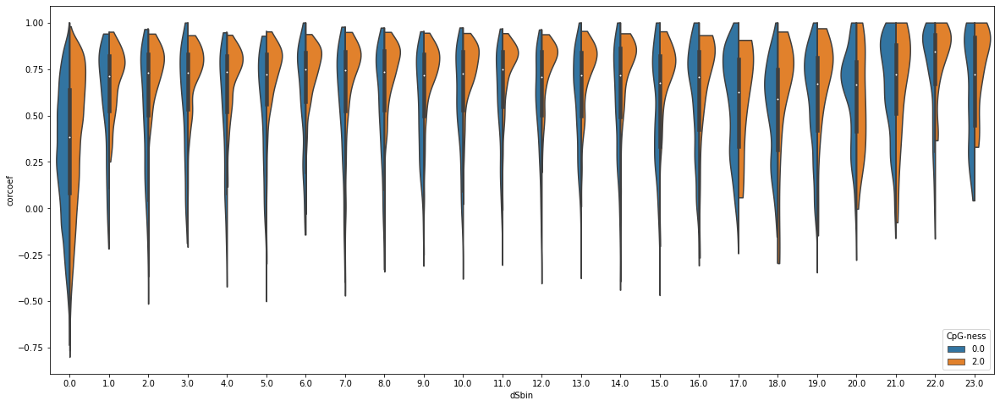

In [108]:
fig, ax = pyplot.subplots(figsize=(20, 8))
violinplot(ax=ax, x="dSbin", y="corcoef", hue="CpG-ness", cut=0, data=frexpr.assign(corcoef=[x[0] if x != None else None for x in frexpr['expr_corr']]).where(frame["CpG-ness"] != 1), split=True)

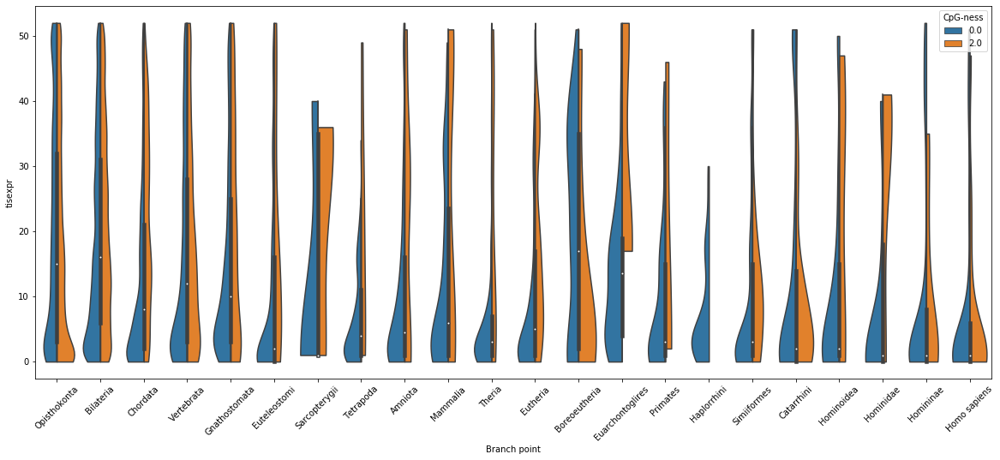

In [109]:
import scipy.stats
from seaborn import violinplot

tisexpr = frame.assign(tisexpr=[sum((genexpr.loc[g1[5:]][tissues]<5) ^ (genexpr.loc[g2[5:]][tissues]<5)) if g1[5:] in genexpr.index and g2[5:] in genexpr.index and len(genexpr.loc[g1[5:]][tissues])>2 and len(genexpr.loc[g2[5:]][tissues])>2  and max(genexpr.loc[g1[5:]][tissues]) > 0.5 and max(genexpr.loc[g2[5:]][tissues]) > 0.5 else None for g1,g2 in frame[['g1', 'g2']].iloc])
fig, ax = pyplot.subplots(figsize=(20, 8))
pyplot.xticks(rotation=45)
violinplot(ax=ax, x="Branch point", y="tisexpr", hue="CpG-ness", cut=0, data=tisexpr.where(frame["CpG-ness"] != 1), split=True)
pyplot.show()

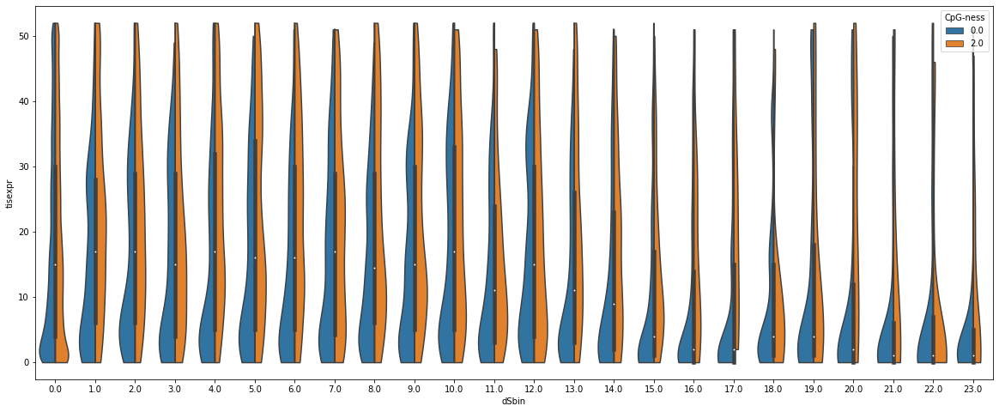

In [110]:
fig, ax = pyplot.subplots(figsize=(20, 8))
violinplot(ax=ax, x="dSbin", y="tisexpr", hue="CpG-ness", cut=0, data=tisexpr.where(frame["CpG-ness"] != 1), split=True)

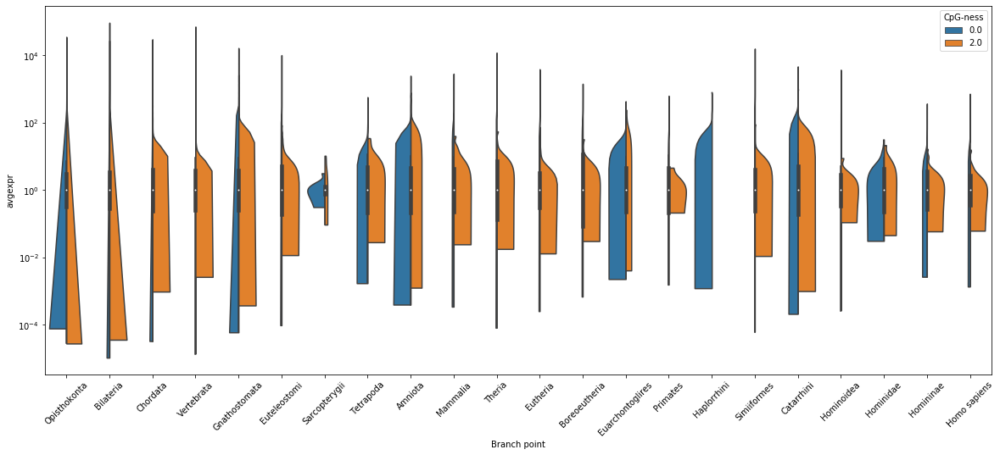

In [111]:
from seaborn import violinplot
import numpy as np

avgexpr = frame.assign(avgexpr=[genexpr.loc[g1[5:]][tissues].mean()/genexpr.loc[g2[5:]][tissues].mean() if g1[5:] in genexpr.index and g2[5:] in genexpr.index and len(genexpr.loc[g1[5:]][tissues])>2 and len(genexpr.loc[g2[5:]][tissues])>2  and max(genexpr.loc[g1[5:]][tissues]) > 0.5 and max(genexpr.loc[g2[5:]][tissues]) > 0.5 else None for g1,g2 in frame[['g1', 'g2']].iloc])
avgexpr = avgexpr.replace([np.inf], np.power(10.,10)).replace([-np.inf],np.power(10.,-10)).dropna()
fig, ax = pyplot.subplots(figsize=(20, 8))
pyplot.xticks(rotation=45)
pyplot.yscale('log')
violinplot(ax=ax, x="Branch point", y="avgexpr", hue="CpG-ness", cut=0, data=avgexpr.where(frame["CpG-ness"] != 1), split=True)
pyplot.show()

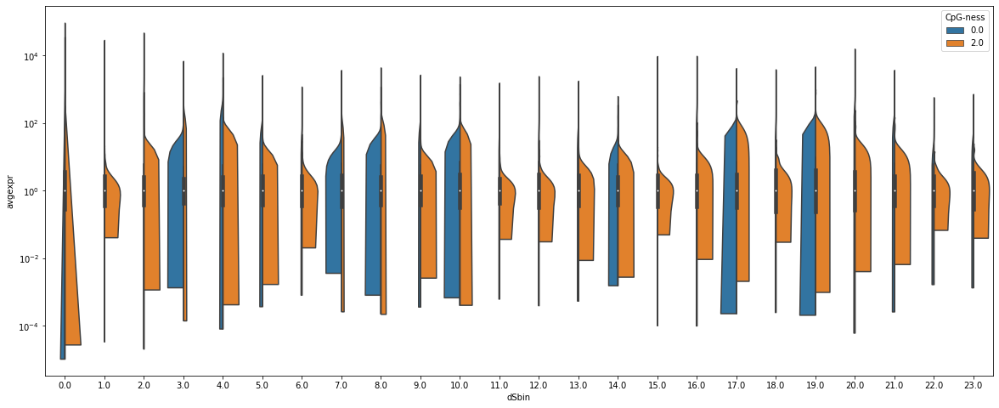

In [112]:
fig, ax = pyplot.subplots(figsize=(20, 8))
pyplot.yscale('log')
violinplot(ax=ax, x="dSbin", y="avgexpr", hue="CpG-ness", cut=0, data=avgexpr.where(frame["CpG-ness"] != 1), split=True)
pyplot.show()

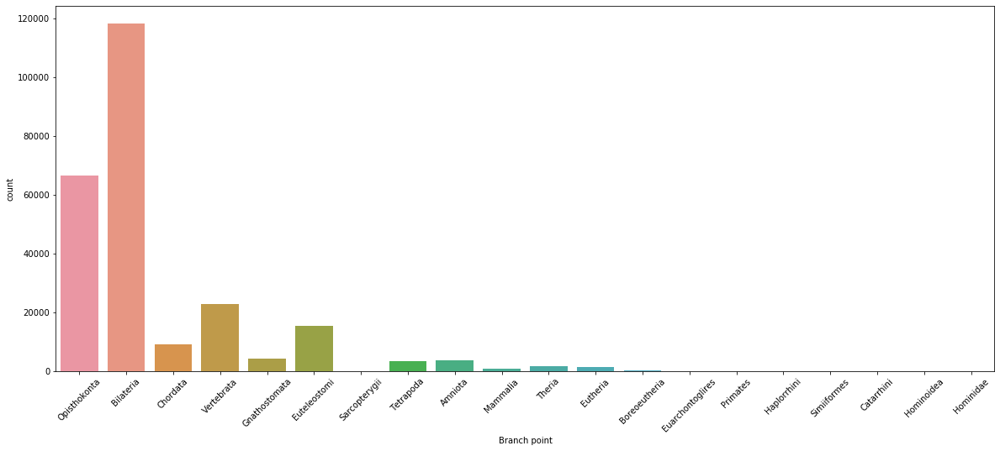

In [113]:
from seaborn import countplot
fig, ax = pyplot.subplots(figsize=(20, 8))
pyplot.xticks(rotation=45)
countplot(ax=ax,data=frame[frame['dS'] > 0.7], x='Branch point')

In [32]:
import shelve
#gtex=shelve.open('/data/db/import/gtex_dict.db', 'r')
gtex=shelve.open('/data/db/import/gtex_dict.db', 'r')

In [33]:
from csv import DictReader
import itertools
import numpy as np
from pandas import read_csv, DataFrame
celldict = read_csv('/data/db/import/GTEx_Analysis_v8_Annotations_SampleAttributesDS.txt', sep='\t')
counts_sub = {}
stdev_sub = {}
means_sub = {}
sampids = set(list(itertools.islice(open('/data/db/import/GTEx_Analysis_2017-06-05_v8_RNASeQCv1.1.9_gene_tpm.gct','r'), 2, 3))[0].strip().split('\t')[2:])
for subt in set(celldict['SMTSD']):
    cols = read_csv('/data/db/import/GTEx_Analysis_2017-06-05_v8_RNASeQCv1.1.9_gene_tpm.gct', sep='\t', skiprows=2, usecols=['Name']+list(sampids.intersection(celldict[celldict['SMTSD']==subt]['SAMPID']))).set_index('Name')
    #cells = celldict['cell']
    #cols = cnts[celldict[celldict['SMTSD'] == subt]['SAMPID']]
    #Filter out with the same cutoff value for gene count and read count as the original Tabula Muris study
    counts_s = cols.columns.size
    mean_s = cols.T.sum()/counts_s
    var_s = np.power(mean_s.add(-cols.T), 2).sum()
    counts_sub[subt] = counts_s
    means_sub[subt] = mean_s
    stdev_sub[subt] = np.power(var_s, 0.5)

In [ ]:
from ipywidgets import interact
from seaborn import histplot
#subtis = 'Trachea-mesenchymal cell'
@interact
def show_subtis_cv(subtis=means_sub.keys()):
    from pandas import DataFrame
    subtis_dt=DataFrame({'Mean': means_sub[subtis], 'StDev': stdev_sub[subtis]}).assign(cpgness=lambda x: [gene_overlap['gene:'+g.split('.')[0]]>0.5 if 'gene:'+g.split('.')[0] in gene_overlap else None for g in x.index]).dropna()
    fig, ax = pyplot.subplots(figsize=(20,8), nrows=2, ncols=2, gridspec_kw={'width_ratios':[1,2]})
    ax[0,0].set_xscale('log')
    ax[0,0].set_yscale('log')
    ax[0,0].set_xlim([1e-3, 1e4])
    ax[0,0].set_ylim([1e-1, 1e5])
    histplot(ax=ax[0,0], data=subtis_dt[subtis_dt['cpgness']==False].assign(Mean=lambda x: x['Mean']+0.0001, StDev=lambda x: x['StDev']+0.0001), x='Mean', y='StDev', color='#9f009f', bins=(40,30))
    ax[1,0].set_xscale('log')
    ax[1,0].set_yscale('log')
    ax[1,0].set_xlim([1e-3, 1e4])
    ax[1,0].set_ylim([1e-1, 1e5])
    histplot(ax=ax[1,0], data=subtis_dt[subtis_dt['cpgness']==True].assign(Mean=lambda x: x['Mean']+0.0001, StDev=lambda x: x['StDev']+0.0001), x='Mean', y='StDev', color='#e1812c', bins=(40,30)) #, hue='cpgness')
    gs = ax[0, 1].get_gridspec()
    for a in ax[:, -1]:
        a.remove()
    axbig = fig.add_subplot(gs[:, -1])
    axbig.set_xscale('log')
    axbig.set_yscale('log')
    axbig.set_xlim([1e-3, 1e4])
    axbig.set_ylim([1e-1, 1e5])
    histplot(ax=axbig, data=subtis_dt.assign(Mean=lambda x: x['Mean']+0.0001, StDev=lambda x: x['StDev']+0.0001), x='Mean', y='StDev', hue='cpgness', palette=['#9f009f', '#e1812c']) #, hue='cpgness')


In [34]:
def exp_diff(x,y):
    RANGE=20
    if x<y:
        return -exp_diff(y,x)
    if x<1:
        return 0
    elif x>2 and y>x/exp(RANGE):
        return min(RANGE, log(x/y))
    elif x>2 and y<=x/exp(RANGE):
        return RANGE
    elif y>x/exp(RANGE):
        return log(x/y)*(x-1)
    else:
        return RANGE*(x-1)
    


In [35]:
from csv import DictReader, reader
from pandas import Series
import itertools
from scipy.stats import ttest_rel
import numpy as np
from math import nan
gtex_samples={}
for row in DictReader(open('/data/db/import/GTEx_Analysis_v8_Annotations_SampleAttributesDS.txt','r'), delimiter='\t'):
    gtex_samples[row['SAMPID']] = row['SMTSD']
#for row in reader(open('/data/db/import/gtex_tiss_class.csv', 'r')):
#    gtex_samples[row[0]] = row[1]
gtex_samples = {g:v for (g,v) in gtex_samples.items() if v!=''}
tissues = set(gtex_samples.values())-set(['Cells - Leukemia cell line (CML)', 'Cells - EBV-transformed lymphocytes', 'Cells - Cultured fibroblasts'])
sampids = list(itertools.islice(open('/data/db/import/GTEx_Analysis_2017-06-05_v8_RNASeQCv1.1.9_gene_tpm.gct','r'), 2, 3))[0].strip().split('\t')[2:]
tismap = Series([gtex_samples[s]  if s in gtex_samples else '' for s in sampids])
tisidxs = {}
for tissue in tissues-set(''):
    tisidxs[tissue] = tismap==tissue

import multiprocessing
import pandas as pd
def parallelize_dataframe(df, func):
    num_cores = multiprocessing.cpu_count()-1  #leave one free to not freeze machine
    num_partitions = num_cores #number of partitions to split dataframe
    df_split = np.array_split(df, num_partitions)
    pool = multiprocessing.Pool(num_cores)
    parts = list(pool.map(func, df_split))
    df, dmean, dpval = pd.concat([x[0] for x in parts]), pd.concat([x[1] for x in parts]), pd.concat([x[2] for x in parts])
    pool.close()
    pool.join()
    return df, dmean, dpval

def para_diff(frame):
    paraDiff = []
    paraMean = []
    paraPval = []
    for paralog in frame.iloc:
        if paralog.g1[5:] not in gtex or paralog.g2[5:] not in gtex:
            continue
        ex1 = np.array(gtex[paralog.g1[5:]])
        ex2 = np.array(gtex[paralog.g2[5:]])
        tisDiff = []
        tisMean = []
        tisPval = []
        for k, tissue in sorted(tisidxs.items()):
            tstat, pval = ttest_rel(np.log(ex1[tissue]+0.0000001)/np.log(2), np.log(ex2[tissue]+0.0000001)/np.log(2))
            #tisDiff.append((1 if tstat > 0 else -1) if pval < 0.002  else 0)
            tisMean.append(exp_diff(np.median(ex1[tissue]),np.median(ex2[tissue])))
            tisPval.append(pval if tstat > 0 else -pval)
            tisDiff.append((1 if tstat > 0 else -1) if pval < 0.002 and (np.median(ex1[tissue])>2.0*np.median(ex2[tissue]) or np.median(ex2[tissue])>2.0*np.median(ex1[tissue]))  else 0)
            #tisDiff.append((1 if tstat > 0 else -1) if (np.median(ex1)>2.0*np.median(ex2) or np.median(ex2)>2.0*np.median(ex1))  else 0)
            #tisDiff.append(pval if (np.median(ex1)>2.0*np.median(ex2) or np.median(ex2)>2.0*np.median(ex1))  else nan)
        paraDiff.append(tisDiff)
        paraMean.append(tisMean)
        paraPval.append(tisPval)
    return DataFrame(paraDiff), DataFrame(paraMean), DataFrame(paraPval)

paraDiff, paraMean, paraPval = parallelize_dataframe(frame, para_diff)
paraDiff

,0,1,2,3,4,5,6,7,8,9,...,42,43,44,45,46,47,48,49,50,51
0,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,1
1,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,-1
2,-1,-1,-1,0,-1,0,-1,0,0,0,...,-1,-1,-1,0,-1,0,-1,0,-1,0
3,1,1,1,0,1,0,1,0,0,0,...,1,1,1,0,1,0,1,0,1,0
4,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,1
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
35677,1,1,1,1,1,1,1,1,1,1,...,1,1,1,1,0,1,1,1,1,0
35678,1,1,1,1,1,1,1,1,1,1,...,1,1,1,1,1,1,1,1,1,1
35679,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,...,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1
35680,1,1,1,1,1,1,1,1,1,1,...,1,1,1,1,1,1,1,1,1,1


In [36]:
#paraDiff.median()
paraDiffT = paraDiff.T
paraDiffT.index = [x for x in sorted(tissues)]
paraDiff = paraDiffT.T
paraMeanT = paraMean.T
paraMeanT.index = [x for x in sorted(tissues)]
paraMean = paraMeanT.T
paraPvalT = paraPval.T
paraPvalT.index = [x for x in sorted(tissues)]
paraPval = paraPvalT.T
paraPval.index=[p.name for p in frame.iloc if p.g1[5:] in gtex and p.g2[5:] in gtex]
paraMean.index=[p.name for p in frame.iloc if p.g1[5:] in gtex and p.g2[5:] in gtex]
paraPval=paraPval.join(frame[['g1', 'g2']], how='inner')
paraMean=paraMean.join(frame[['g1', 'g2']], how='inner')
#paraDiff.median()
#tisidxs = {}
#for tissue in tissues:
#    tisidxs[tissue] = tismap==tissue
#sorted([(k, sum(t)) for (k, t) in tisidxs.items()])

In [37]:
#paraPval=paraPval.join(frame[['g1', 'g2']], how='inner')
#paraMean=paraMean.join(frame[['g1', 'g2']], how='inner')

In [38]:
AED_tiss_part = 1/2
paraDiffCpy=paraDiff
paraDiffCpy.index=[p.name for p in frame.iloc if p.g1[5:] in gtex and p.g2[5:] in gtex]
paraDiffCpy = pd.concat([frame, paraDiffCpy], axis=1)
paraDiffCpy
#paraDiffCpy = paraDiffCpy.assign(AED=paraDiffCpy[range(0,len(tissues))].sum(axis=1)>=(len(tissues)*AED_tiss_part)*(paraDiffCpy[range(0,len(tissues))].min(axis=1)>=0))


,Branch point,CpG-ness,dN,dS,Similarity,Length,Distance,g1,g2,dSbin,...,Skin - Not Sun Exposed (Suprapubic),Skin - Sun Exposed (Lower leg),Small Intestine - Terminal Ileum,Spleen,Stomach,Testis,Thyroid,Uterus,Vagina,Whole Blood
0,Opisthokonta,2,0.8393,68.0835,20.46080,50322.5,300000000,gene:ENSG00000169679,gene:ENSG00000156970,0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0
1,Opisthokonta,2,0.8393,68.0835,21.14290,50322.5,300000000,gene:ENSG00000156970,gene:ENSG00000169679,0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,-1.0
2,Opisthokonta,2,0.1967,12.9895,63.85630,173307.5,300000000,gene:ENSG00000083642,gene:ENSG00000121892,0,...,-1.0,-1.0,-1.0,0.0,-1.0,0.0,-1.0,0.0,-1.0,0.0
3,Opisthokonta,2,0.1967,12.9895,69.10990,173307.5,300000000,gene:ENSG00000121892,gene:ENSG00000083642,0,...,1.0,1.0,1.0,0.0,1.0,0.0,1.0,0.0,1.0,0.0
4,Opisthokonta,2,0.3326,5.2390,52.39230,111112.5,300000000,gene:ENSG00000120616,gene:ENSG00000135999,0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
266651,Homo sapiens,0,0.0027,0.0096,95.89580,62311.5,300000000,gene:ENSG00000185164,gene:ENSG00000103512,22,...,-1.0,-1.0,-1.0,-1.0,-1.0,-1.0,-1.0,-1.0,-1.0,-1.0
266652,Homo sapiens,1,NaN,NaN,100.00000,82945.0,16776,gene:ENSG00000279765,gene:ENSG00000173575,0,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
266653,Homo sapiens,1,NaN,NaN,6.94748,82945.0,16776,gene:ENSG00000173575,gene:ENSG00000279765,0,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
266654,Homo sapiens,2,0.0046,0.0089,99.37060,142838.5,75,gene:ENSG00000131503,gene:ENSG00000254996,22,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


In [39]:
from scipy.stats import pearsonr, spearmanr, pointbiserialr, chisquare
#from itertools import chain
paraDiffCpy=paraDiff
paraDiffCpy.index=[p.name for p in frame.iloc if p.g1[5:] in gtex and p.g2[5:] in gtex]
paraDiffCpy = pd.concat([frame, paraDiffCpy], axis=1).dropna()
#tisRng = set(range(0,len(tissues)))-set([(t==(tismap=='Cells - Leukemia cell line (CML)')).all() for t in tisidxs])
tisRng = tisidxs.keys()-set(['Kidney', 'Vagina', 'Whole Blood'])

paraDiffCpy = paraDiffCpy.assign(NF=(paraDiffCpy[tisRng].min(axis=1)==-1)&(paraDiffCpy[tisRng].max(axis=1)==1))
#AED_tiss = 54//3
#paraDiffCpy = paraDiffCpy.assign(AED=(paraDiffCpy[tisRng].sum(axis=1)>=AED_tiss)&(paraDiffCpy[tisRng].min(axis=1)>=0))

for AED_tiss in range(1, len(tisRng)):
    paraDiffCpy = paraDiffCpy.assign(AED=(paraDiffCpy[tisRng].sum(axis=1)>=AED_tiss)&(paraDiffCpy[tisRng].min(axis=1)>=0))
    print('%d %f %f %s' % (AED_tiss, paraDiffCpy[paraDiffCpy['dS']<0.7]['AED'].sum()/(paraDiffCpy['dS']<0.7).sum(), paraDiffCpy['AED'].sum()/len(paraDiffCpy), pointbiserialr(paraDiffCpy['AED'], paraDiffCpy['CpG-ness']==2)))
    

/tmp/ipykernel_63819/3045302887.py:9: FutureWarning: Passing a set as an indexer is deprecated and will raise in a future version. Use a list instead.
  paraDiffCpy = paraDiffCpy.assign(NF=(paraDiffCpy[tisRng].min(axis=1)==-1)&(paraDiffCpy[tisRng].max(axis=1)==1))
/tmp/ipykernel_63819/3045302887.py:9: FutureWarning: Passing a set as an indexer is deprecated and will raise in a future version. Use a list instead.
  paraDiffCpy = paraDiffCpy.assign(NF=(paraDiffCpy[tisRng].min(axis=1)==-1)&(paraDiffCpy[tisRng].max(axis=1)==1))
/tmp/ipykernel_63819/3045302887.py:14: FutureWarning: Passing a set as an indexer is deprecated and will raise in a future version. Use a list instead.
  paraDiffCpy = paraDiffCpy.assign(AED=(paraDiffCpy[tisRng].sum(axis=1)>=AED_tiss)&(paraDiffCpy[tisRng].min(axis=1)>=0))
/tmp/ipykernel_63819/3045302887.py:14: FutureWarning: Passing a set as an indexer is deprecated and will raise in a future version. Use a list instead.
  paraDiffCpy = paraDiffCpy.assign(AED=(paraD

1 0.317151 0.264546 PointbiserialrResult(correlation=0.005666153078075653, pvalue=0.0047380623391529144)


/tmp/ipykernel_63819/3045302887.py:14: FutureWarning: Passing a set as an indexer is deprecated and will raise in a future version. Use a list instead.
  paraDiffCpy = paraDiffCpy.assign(AED=(paraDiffCpy[tisRng].sum(axis=1)>=AED_tiss)&(paraDiffCpy[tisRng].min(axis=1)>=0))
/tmp/ipykernel_63819/3045302887.py:14: FutureWarning: Passing a set as an indexer is deprecated and will raise in a future version. Use a list instead.
  paraDiffCpy = paraDiffCpy.assign(AED=(paraDiffCpy[tisRng].sum(axis=1)>=AED_tiss)&(paraDiffCpy[tisRng].min(axis=1)>=0))


2 0.254823 0.238976 PointbiserialrResult(correlation=0.03201865790636489, pvalue=2.2828961433202497e-57)


/tmp/ipykernel_63819/3045302887.py:14: FutureWarning: Passing a set as an indexer is deprecated and will raise in a future version. Use a list instead.
  paraDiffCpy = paraDiffCpy.assign(AED=(paraDiffCpy[tisRng].sum(axis=1)>=AED_tiss)&(paraDiffCpy[tisRng].min(axis=1)>=0))
/tmp/ipykernel_63819/3045302887.py:14: FutureWarning: Passing a set as an indexer is deprecated and will raise in a future version. Use a list instead.
  paraDiffCpy = paraDiffCpy.assign(AED=(paraDiffCpy[tisRng].sum(axis=1)>=AED_tiss)&(paraDiffCpy[tisRng].min(axis=1)>=0))
/tmp/ipykernel_63819/3045302887.py:14: FutureWarning: Passing a set as an indexer is deprecated and will raise in a future version. Use a list instead.
  paraDiffCpy = paraDiffCpy.assign(AED=(paraDiffCpy[tisRng].sum(axis=1)>=AED_tiss)&(paraDiffCpy[tisRng].min(axis=1)>=0))


3 0.241891 0.229751 PointbiserialrResult(correlation=0.0397642691464053, pvalue=1.6939006743599063e-87)


/tmp/ipykernel_63819/3045302887.py:14: FutureWarning: Passing a set as an indexer is deprecated and will raise in a future version. Use a list instead.
  paraDiffCpy = paraDiffCpy.assign(AED=(paraDiffCpy[tisRng].sum(axis=1)>=AED_tiss)&(paraDiffCpy[tisRng].min(axis=1)>=0))
/tmp/ipykernel_63819/3045302887.py:14: FutureWarning: Passing a set as an indexer is deprecated and will raise in a future version. Use a list instead.
  paraDiffCpy = paraDiffCpy.assign(AED=(paraDiffCpy[tisRng].sum(axis=1)>=AED_tiss)&(paraDiffCpy[tisRng].min(axis=1)>=0))
/tmp/ipykernel_63819/3045302887.py:14: FutureWarning: Passing a set as an indexer is deprecated and will raise in a future version. Use a list instead.
  paraDiffCpy = paraDiffCpy.assign(AED=(paraDiffCpy[tisRng].sum(axis=1)>=AED_tiss)&(paraDiffCpy[tisRng].min(axis=1)>=0))


4 0.234577 0.225336 PointbiserialrResult(correlation=0.04182603184977881, pvalue=1.3069376303926424e-96)
5 0.229807 0.222385 PointbiserialrResult(correlation=0.04251285427837712, pvalue=9.516616225899244e-100)


/tmp/ipykernel_63819/3045302887.py:14: FutureWarning: Passing a set as an indexer is deprecated and will raise in a future version. Use a list instead.
  paraDiffCpy = paraDiffCpy.assign(AED=(paraDiffCpy[tisRng].sum(axis=1)>=AED_tiss)&(paraDiffCpy[tisRng].min(axis=1)>=0))
/tmp/ipykernel_63819/3045302887.py:14: FutureWarning: Passing a set as an indexer is deprecated and will raise in a future version. Use a list instead.
  paraDiffCpy = paraDiffCpy.assign(AED=(paraDiffCpy[tisRng].sum(axis=1)>=AED_tiss)&(paraDiffCpy[tisRng].min(axis=1)>=0))


6 0.224719 0.219202 PointbiserialrResult(correlation=0.043577894101390346, pvalue=1.0275854792294952e-104)


/tmp/ipykernel_63819/3045302887.py:14: FutureWarning: Passing a set as an indexer is deprecated and will raise in a future version. Use a list instead.
  paraDiffCpy = paraDiffCpy.assign(AED=(paraDiffCpy[tisRng].sum(axis=1)>=AED_tiss)&(paraDiffCpy[tisRng].min(axis=1)>=0))
/tmp/ipykernel_63819/3045302887.py:14: FutureWarning: Passing a set as an indexer is deprecated and will raise in a future version. Use a list instead.
  paraDiffCpy = paraDiffCpy.assign(AED=(paraDiffCpy[tisRng].sum(axis=1)>=AED_tiss)&(paraDiffCpy[tisRng].min(axis=1)>=0))


7 0.221539 0.216743 PointbiserialrResult(correlation=0.04388493993008443, pvalue=3.6069745491200805e-106)


/tmp/ipykernel_63819/3045302887.py:14: FutureWarning: Passing a set as an indexer is deprecated and will raise in a future version. Use a list instead.
  paraDiffCpy = paraDiffCpy.assign(AED=(paraDiffCpy[tisRng].sum(axis=1)>=AED_tiss)&(paraDiffCpy[tisRng].min(axis=1)>=0))
/tmp/ipykernel_63819/3045302887.py:14: FutureWarning: Passing a set as an indexer is deprecated and will raise in a future version. Use a list instead.
  paraDiffCpy = paraDiffCpy.assign(AED=(paraDiffCpy[tisRng].sum(axis=1)>=AED_tiss)&(paraDiffCpy[tisRng].min(axis=1)>=0))
/tmp/ipykernel_63819/3045302887.py:14: FutureWarning: Passing a set as an indexer is deprecated and will raise in a future version. Use a list instead.
  paraDiffCpy = paraDiffCpy.assign(AED=(paraDiffCpy[tisRng].sum(axis=1)>=AED_tiss)&(paraDiffCpy[tisRng].min(axis=1)>=0))


8 0.219207 0.215113 PointbiserialrResult(correlation=0.04320591905584116, pvalue=5.760078699346518e-103)
9 0.216663 0.212778 PointbiserialrResult(correlation=0.04404754936526849, pvalue=6.062075392069114e-107)


/tmp/ipykernel_63819/3045302887.py:14: FutureWarning: Passing a set as an indexer is deprecated and will raise in a future version. Use a list instead.
  paraDiffCpy = paraDiffCpy.assign(AED=(paraDiffCpy[tisRng].sum(axis=1)>=AED_tiss)&(paraDiffCpy[tisRng].min(axis=1)>=0))
/tmp/ipykernel_63819/3045302887.py:14: FutureWarning: Passing a set as an indexer is deprecated and will raise in a future version. Use a list instead.
  paraDiffCpy = paraDiffCpy.assign(AED=(paraDiffCpy[tisRng].sum(axis=1)>=AED_tiss)&(paraDiffCpy[tisRng].min(axis=1)>=0))
/tmp/ipykernel_63819/3045302887.py:14: FutureWarning: Passing a set as an indexer is deprecated and will raise in a future version. Use a list instead.
  paraDiffCpy = paraDiffCpy.assign(AED=(paraDiffCpy[tisRng].sum(axis=1)>=AED_tiss)&(paraDiffCpy[tisRng].min(axis=1)>=0))


10 0.214649 0.210705 PointbiserialrResult(correlation=0.044105993164884116, pvalue=3.188226768126832e-107)


/tmp/ipykernel_63819/3045302887.py:14: FutureWarning: Passing a set as an indexer is deprecated and will raise in a future version. Use a list instead.
  paraDiffCpy = paraDiffCpy.assign(AED=(paraDiffCpy[tisRng].sum(axis=1)>=AED_tiss)&(paraDiffCpy[tisRng].min(axis=1)>=0))
/tmp/ipykernel_63819/3045302887.py:14: FutureWarning: Passing a set as an indexer is deprecated and will raise in a future version. Use a list instead.
  paraDiffCpy = paraDiffCpy.assign(AED=(paraDiffCpy[tisRng].sum(axis=1)>=AED_tiss)&(paraDiffCpy[tisRng].min(axis=1)>=0))


11 0.210939 0.208882 PointbiserialrResult(correlation=0.04364921314191443, pvalue=4.729811486480284e-105)


/tmp/ipykernel_63819/3045302887.py:14: FutureWarning: Passing a set as an indexer is deprecated and will raise in a future version. Use a list instead.
  paraDiffCpy = paraDiffCpy.assign(AED=(paraDiffCpy[tisRng].sum(axis=1)>=AED_tiss)&(paraDiffCpy[tisRng].min(axis=1)>=0))
/tmp/ipykernel_63819/3045302887.py:14: FutureWarning: Passing a set as an indexer is deprecated and will raise in a future version. Use a list instead.
  paraDiffCpy = paraDiffCpy.assign(AED=(paraDiffCpy[tisRng].sum(axis=1)>=AED_tiss)&(paraDiffCpy[tisRng].min(axis=1)>=0))


12 0.207759 0.207534 PointbiserialrResult(correlation=0.04297044949950948, pvalue=7.237671575036318e-102)


/tmp/ipykernel_63819/3045302887.py:14: FutureWarning: Passing a set as an indexer is deprecated and will raise in a future version. Use a list instead.
  paraDiffCpy = paraDiffCpy.assign(AED=(paraDiffCpy[tisRng].sum(axis=1)>=AED_tiss)&(paraDiffCpy[tisRng].min(axis=1)>=0))
/tmp/ipykernel_63819/3045302887.py:14: FutureWarning: Passing a set as an indexer is deprecated and will raise in a future version. Use a list instead.
  paraDiffCpy = paraDiffCpy.assign(AED=(paraDiffCpy[tisRng].sum(axis=1)>=AED_tiss)&(paraDiffCpy[tisRng].min(axis=1)>=0))
/tmp/ipykernel_63819/3045302887.py:14: FutureWarning: Passing a set as an indexer is deprecated and will raise in a future version. Use a list instead.
  paraDiffCpy = paraDiffCpy.assign(AED=(paraDiffCpy[tisRng].sum(axis=1)>=AED_tiss)&(paraDiffCpy[tisRng].min(axis=1)>=0))


13 0.204155 0.205880 PointbiserialrResult(correlation=0.04281715446816839, pvalue=3.732096923446912e-101)


/tmp/ipykernel_63819/3045302887.py:14: FutureWarning: Passing a set as an indexer is deprecated and will raise in a future version. Use a list instead.
  paraDiffCpy = paraDiffCpy.assign(AED=(paraDiffCpy[tisRng].sum(axis=1)>=AED_tiss)&(paraDiffCpy[tisRng].min(axis=1)>=0))
/tmp/ipykernel_63819/3045302887.py:14: FutureWarning: Passing a set as an indexer is deprecated and will raise in a future version. Use a list instead.
  paraDiffCpy = paraDiffCpy.assign(AED=(paraDiffCpy[tisRng].sum(axis=1)>=AED_tiss)&(paraDiffCpy[tisRng].min(axis=1)>=0))
/tmp/ipykernel_63819/3045302887.py:14: FutureWarning: Passing a set as an indexer is deprecated and will raise in a future version. Use a list instead.
  paraDiffCpy = paraDiffCpy.assign(AED=(paraDiffCpy[tisRng].sum(axis=1)>=AED_tiss)&(paraDiffCpy[tisRng].min(axis=1)>=0))


14 0.202035 0.204221 PointbiserialrResult(correlation=0.04221673747600744, pvalue=2.1755239679586154e-98)
15 0.199385 0.201907 PointbiserialrResult(correlation=0.04209427062086361, pvalue=7.886296960601667e-98)


/tmp/ipykernel_63819/3045302887.py:14: FutureWarning: Passing a set as an indexer is deprecated and will raise in a future version. Use a list instead.
  paraDiffCpy = paraDiffCpy.assign(AED=(paraDiffCpy[tisRng].sum(axis=1)>=AED_tiss)&(paraDiffCpy[tisRng].min(axis=1)>=0))
/tmp/ipykernel_63819/3045302887.py:14: FutureWarning: Passing a set as an indexer is deprecated and will raise in a future version. Use a list instead.
  paraDiffCpy = paraDiffCpy.assign(AED=(paraDiffCpy[tisRng].sum(axis=1)>=AED_tiss)&(paraDiffCpy[tisRng].min(axis=1)>=0))


16 0.196205 0.200462 PointbiserialrResult(correlation=0.04147292893985782, pvalue=5.1232657117497736e-95)


/tmp/ipykernel_63819/3045302887.py:14: FutureWarning: Passing a set as an indexer is deprecated and will raise in a future version. Use a list instead.
  paraDiffCpy = paraDiffCpy.assign(AED=(paraDiffCpy[tisRng].sum(axis=1)>=AED_tiss)&(paraDiffCpy[tisRng].min(axis=1)>=0))
/tmp/ipykernel_63819/3045302887.py:14: FutureWarning: Passing a set as an indexer is deprecated and will raise in a future version. Use a list instead.
  paraDiffCpy = paraDiffCpy.assign(AED=(paraDiffCpy[tisRng].sum(axis=1)>=AED_tiss)&(paraDiffCpy[tisRng].min(axis=1)>=0))


17 0.190905 0.198727 PointbiserialrResult(correlation=0.04114426938015074, pvalue=1.5150283495627367e-93)


/tmp/ipykernel_63819/3045302887.py:14: FutureWarning: Passing a set as an indexer is deprecated and will raise in a future version. Use a list instead.
  paraDiffCpy = paraDiffCpy.assign(AED=(paraDiffCpy[tisRng].sum(axis=1)>=AED_tiss)&(paraDiffCpy[tisRng].min(axis=1)>=0))
/tmp/ipykernel_63819/3045302887.py:14: FutureWarning: Passing a set as an indexer is deprecated and will raise in a future version. Use a list instead.
  paraDiffCpy = paraDiffCpy.assign(AED=(paraDiffCpy[tisRng].sum(axis=1)>=AED_tiss)&(paraDiffCpy[tisRng].min(axis=1)>=0))
/tmp/ipykernel_63819/3045302887.py:14: FutureWarning: Passing a set as an indexer is deprecated and will raise in a future version. Use a list instead.
  paraDiffCpy = paraDiffCpy.assign(AED=(paraDiffCpy[tisRng].sum(axis=1)>=AED_tiss)&(paraDiffCpy[tisRng].min(axis=1)>=0))
/tmp/ipykernel_63819/3045302887.py:14: FutureWarning: Passing a set as an indexer is deprecated and will raise in a future version. Use a list instead.
  paraDiffCpy = paraDiffCpy.a

18 0.187301 0.196904 PointbiserialrResult(correlation=0.04070046118120616, pvalue=1.4063103128242195e-91)
19 0.185605 0.195596 PointbiserialrResult(correlation=0.03924483138741095, pvalue=2.8326981494943723e-85)


/tmp/ipykernel_63819/3045302887.py:14: FutureWarning: Passing a set as an indexer is deprecated and will raise in a future version. Use a list instead.
  paraDiffCpy = paraDiffCpy.assign(AED=(paraDiffCpy[tisRng].sum(axis=1)>=AED_tiss)&(paraDiffCpy[tisRng].min(axis=1)>=0))
/tmp/ipykernel_63819/3045302887.py:14: FutureWarning: Passing a set as an indexer is deprecated and will raise in a future version. Use a list instead.
  paraDiffCpy = paraDiffCpy.assign(AED=(paraDiffCpy[tisRng].sum(axis=1)>=AED_tiss)&(paraDiffCpy[tisRng].min(axis=1)>=0))


20 0.183909 0.194199 PointbiserialrResult(correlation=0.03839621285988164, pvalue=1.0512843336112137e-81)


/tmp/ipykernel_63819/3045302887.py:14: FutureWarning: Passing a set as an indexer is deprecated and will raise in a future version. Use a list instead.
  paraDiffCpy = paraDiffCpy.assign(AED=(paraDiffCpy[tisRng].sum(axis=1)>=AED_tiss)&(paraDiffCpy[tisRng].min(axis=1)>=0))
/tmp/ipykernel_63819/3045302887.py:14: FutureWarning: Passing a set as an indexer is deprecated and will raise in a future version. Use a list instead.
  paraDiffCpy = paraDiffCpy.assign(AED=(paraDiffCpy[tisRng].sum(axis=1)>=AED_tiss)&(paraDiffCpy[tisRng].min(axis=1)>=0))


21 0.183061 0.192758 PointbiserialrResult(correlation=0.03819259078982757, pvalue=7.355788781697635e-81)


/tmp/ipykernel_63819/3045302887.py:14: FutureWarning: Passing a set as an indexer is deprecated and will raise in a future version. Use a list instead.
  paraDiffCpy = paraDiffCpy.assign(AED=(paraDiffCpy[tisRng].sum(axis=1)>=AED_tiss)&(paraDiffCpy[tisRng].min(axis=1)>=0))
/tmp/ipykernel_63819/3045302887.py:14: FutureWarning: Passing a set as an indexer is deprecated and will raise in a future version. Use a list instead.
  paraDiffCpy = paraDiffCpy.assign(AED=(paraDiffCpy[tisRng].sum(axis=1)>=AED_tiss)&(paraDiffCpy[tisRng].min(axis=1)>=0))


22 0.179033 0.191120 PointbiserialrResult(correlation=0.03788406631339136, pvalue=1.3749320144236754e-79)


/tmp/ipykernel_63819/3045302887.py:14: FutureWarning: Passing a set as an indexer is deprecated and will raise in a future version. Use a list instead.
  paraDiffCpy = paraDiffCpy.assign(AED=(paraDiffCpy[tisRng].sum(axis=1)>=AED_tiss)&(paraDiffCpy[tisRng].min(axis=1)>=0))
/tmp/ipykernel_63819/3045302887.py:14: FutureWarning: Passing a set as an indexer is deprecated and will raise in a future version. Use a list instead.
  paraDiffCpy = paraDiffCpy.assign(AED=(paraDiffCpy[tisRng].sum(axis=1)>=AED_tiss)&(paraDiffCpy[tisRng].min(axis=1)>=0))


23 0.177549 0.189522 PointbiserialrResult(correlation=0.03678015450256737, pvalue=4.018414714077543e-75)
24 0.176065 0.187848 PointbiserialrResult(correlation=0.0359047344939726, pvalue=1.1269186532496647e-71)


/tmp/ipykernel_63819/3045302887.py:14: FutureWarning: Passing a set as an indexer is deprecated and will raise in a future version. Use a list instead.
  paraDiffCpy = paraDiffCpy.assign(AED=(paraDiffCpy[tisRng].sum(axis=1)>=AED_tiss)&(paraDiffCpy[tisRng].min(axis=1)>=0))
/tmp/ipykernel_63819/3045302887.py:14: FutureWarning: Passing a set as an indexer is deprecated and will raise in a future version. Use a list instead.
  paraDiffCpy = paraDiffCpy.assign(AED=(paraDiffCpy[tisRng].sum(axis=1)>=AED_tiss)&(paraDiffCpy[tisRng].min(axis=1)>=0))
/tmp/ipykernel_63819/3045302887.py:14: FutureWarning: Passing a set as an indexer is deprecated and will raise in a future version. Use a list instead.
  paraDiffCpy = paraDiffCpy.assign(AED=(paraDiffCpy[tisRng].sum(axis=1)>=AED_tiss)&(paraDiffCpy[tisRng].min(axis=1)>=0))
/tmp/ipykernel_63819/3045302887.py:14: FutureWarning: Passing a set as an indexer is deprecated and will raise in a future version. Use a list instead.
  paraDiffCpy = paraDiffCpy.a

25 0.174475 0.186198 PointbiserialrResult(correlation=0.03548288786174949, pvalue=4.8281794900263584e-70)
26 0.172885 0.184769 PointbiserialrResult(correlation=0.034585485574341136, pvalue=1.2343136890246557e-66)


/tmp/ipykernel_63819/3045302887.py:14: FutureWarning: Passing a set as an indexer is deprecated and will raise in a future version. Use a list instead.
  paraDiffCpy = paraDiffCpy.assign(AED=(paraDiffCpy[tisRng].sum(axis=1)>=AED_tiss)&(paraDiffCpy[tisRng].min(axis=1)>=0))
/tmp/ipykernel_63819/3045302887.py:14: FutureWarning: Passing a set as an indexer is deprecated and will raise in a future version. Use a list instead.
  paraDiffCpy = paraDiffCpy.assign(AED=(paraDiffCpy[tisRng].sum(axis=1)>=AED_tiss)&(paraDiffCpy[tisRng].min(axis=1)>=0))


27 0.171083 0.183360 PointbiserialrResult(correlation=0.03345516676819546, pvalue=1.8189380338581487e-62)


/tmp/ipykernel_63819/3045302887.py:14: FutureWarning: Passing a set as an indexer is deprecated and will raise in a future version. Use a list instead.
  paraDiffCpy = paraDiffCpy.assign(AED=(paraDiffCpy[tisRng].sum(axis=1)>=AED_tiss)&(paraDiffCpy[tisRng].min(axis=1)>=0))
/tmp/ipykernel_63819/3045302887.py:14: FutureWarning: Passing a set as an indexer is deprecated and will raise in a future version. Use a list instead.
  paraDiffCpy = paraDiffCpy.assign(AED=(paraDiffCpy[tisRng].sum(axis=1)>=AED_tiss)&(paraDiffCpy[tisRng].min(axis=1)>=0))
/tmp/ipykernel_63819/3045302887.py:14: FutureWarning: Passing a set as an indexer is deprecated and will raise in a future version. Use a list instead.
  paraDiffCpy = paraDiffCpy.assign(AED=(paraDiffCpy[tisRng].sum(axis=1)>=AED_tiss)&(paraDiffCpy[tisRng].min(axis=1)>=0))


28 0.169387 0.181863 PointbiserialrResult(correlation=0.03215023557011634, pvalue=7.956642035547492e-58)
29 0.168115 0.180366 PointbiserialrResult(correlation=0.03108773179509991, pvalue=3.498196093584975e-54)


/tmp/ipykernel_63819/3045302887.py:14: FutureWarning: Passing a set as an indexer is deprecated and will raise in a future version. Use a list instead.
  paraDiffCpy = paraDiffCpy.assign(AED=(paraDiffCpy[tisRng].sum(axis=1)>=AED_tiss)&(paraDiffCpy[tisRng].min(axis=1)>=0))
/tmp/ipykernel_63819/3045302887.py:14: FutureWarning: Passing a set as an indexer is deprecated and will raise in a future version. Use a list instead.
  paraDiffCpy = paraDiffCpy.assign(AED=(paraDiffCpy[tisRng].sum(axis=1)>=AED_tiss)&(paraDiffCpy[tisRng].min(axis=1)>=0))
/tmp/ipykernel_63819/3045302887.py:14: FutureWarning: Passing a set as an indexer is deprecated and will raise in a future version. Use a list instead.
  paraDiffCpy = paraDiffCpy.assign(AED=(paraDiffCpy[tisRng].sum(axis=1)>=AED_tiss)&(paraDiffCpy[tisRng].min(axis=1)>=0))


30 0.165783 0.178857 PointbiserialrResult(correlation=0.030087143591225076, pvalue=7.301617642077804e-51)


/tmp/ipykernel_63819/3045302887.py:14: FutureWarning: Passing a set as an indexer is deprecated and will raise in a future version. Use a list instead.
  paraDiffCpy = paraDiffCpy.assign(AED=(paraDiffCpy[tisRng].sum(axis=1)>=AED_tiss)&(paraDiffCpy[tisRng].min(axis=1)>=0))
/tmp/ipykernel_63819/3045302887.py:14: FutureWarning: Passing a set as an indexer is deprecated and will raise in a future version. Use a list instead.
  paraDiffCpy = paraDiffCpy.assign(AED=(paraDiffCpy[tisRng].sum(axis=1)>=AED_tiss)&(paraDiffCpy[tisRng].min(axis=1)>=0))


31 0.163875 0.177150 PointbiserialrResult(correlation=0.029071037105243218, pvalue=1.3307644396863237e-47)


/tmp/ipykernel_63819/3045302887.py:14: FutureWarning: Passing a set as an indexer is deprecated and will raise in a future version. Use a list instead.
  paraDiffCpy = paraDiffCpy.assign(AED=(paraDiffCpy[tisRng].sum(axis=1)>=AED_tiss)&(paraDiffCpy[tisRng].min(axis=1)>=0))
/tmp/ipykernel_63819/3045302887.py:14: FutureWarning: Passing a set as an indexer is deprecated and will raise in a future version. Use a list instead.
  paraDiffCpy = paraDiffCpy.assign(AED=(paraDiffCpy[tisRng].sum(axis=1)>=AED_tiss)&(paraDiffCpy[tisRng].min(axis=1)>=0))


32 0.162073 0.175351 PointbiserialrResult(correlation=0.028362814991749523, pvalue=2.1430516390137117e-45)


/tmp/ipykernel_63819/3045302887.py:14: FutureWarning: Passing a set as an indexer is deprecated and will raise in a future version. Use a list instead.
  paraDiffCpy = paraDiffCpy.assign(AED=(paraDiffCpy[tisRng].sum(axis=1)>=AED_tiss)&(paraDiffCpy[tisRng].min(axis=1)>=0))
/tmp/ipykernel_63819/3045302887.py:14: FutureWarning: Passing a set as an indexer is deprecated and will raise in a future version. Use a list instead.
  paraDiffCpy = paraDiffCpy.assign(AED=(paraDiffCpy[tisRng].sum(axis=1)>=AED_tiss)&(paraDiffCpy[tisRng].min(axis=1)>=0))
/tmp/ipykernel_63819/3045302887.py:14: FutureWarning: Passing a set as an indexer is deprecated and will raise in a future version. Use a list instead.
  paraDiffCpy = paraDiffCpy.assign(AED=(paraDiffCpy[tisRng].sum(axis=1)>=AED_tiss)&(paraDiffCpy[tisRng].min(axis=1)>=0))


33 0.159847 0.173596 PointbiserialrResult(correlation=0.027228580991118967, pvalue=5.662680613234504e-42)
34 0.158363 0.171628 PointbiserialrResult(correlation=0.02574268507873053, pvalue=1.0631239393737067e-37)


/tmp/ipykernel_63819/3045302887.py:14: FutureWarning: Passing a set as an indexer is deprecated and will raise in a future version. Use a list instead.
  paraDiffCpy = paraDiffCpy.assign(AED=(paraDiffCpy[tisRng].sum(axis=1)>=AED_tiss)&(paraDiffCpy[tisRng].min(axis=1)>=0))
/tmp/ipykernel_63819/3045302887.py:14: FutureWarning: Passing a set as an indexer is deprecated and will raise in a future version. Use a list instead.
  paraDiffCpy = paraDiffCpy.assign(AED=(paraDiffCpy[tisRng].sum(axis=1)>=AED_tiss)&(paraDiffCpy[tisRng].min(axis=1)>=0))
/tmp/ipykernel_63819/3045302887.py:14: FutureWarning: Passing a set as an indexer is deprecated and will raise in a future version. Use a list instead.
  paraDiffCpy = paraDiffCpy.assign(AED=(paraDiffCpy[tisRng].sum(axis=1)>=AED_tiss)&(paraDiffCpy[tisRng].min(axis=1)>=0))


35 0.156879 0.169455 PointbiserialrResult(correlation=0.023450706077388153, pvalue=1.4231384140989748e-31)


/tmp/ipykernel_63819/3045302887.py:14: FutureWarning: Passing a set as an indexer is deprecated and will raise in a future version. Use a list instead.
  paraDiffCpy = paraDiffCpy.assign(AED=(paraDiffCpy[tisRng].sum(axis=1)>=AED_tiss)&(paraDiffCpy[tisRng].min(axis=1)>=0))
/tmp/ipykernel_63819/3045302887.py:14: FutureWarning: Passing a set as an indexer is deprecated and will raise in a future version. Use a list instead.
  paraDiffCpy = paraDiffCpy.assign(AED=(paraDiffCpy[tisRng].sum(axis=1)>=AED_tiss)&(paraDiffCpy[tisRng].min(axis=1)>=0))


36 0.155183 0.167068 PointbiserialrResult(correlation=0.02112208672627349, pvalue=6.316780791705729e-26)


/tmp/ipykernel_63819/3045302887.py:14: FutureWarning: Passing a set as an indexer is deprecated and will raise in a future version. Use a list instead.
  paraDiffCpy = paraDiffCpy.assign(AED=(paraDiffCpy[tisRng].sum(axis=1)>=AED_tiss)&(paraDiffCpy[tisRng].min(axis=1)>=0))
/tmp/ipykernel_63819/3045302887.py:14: FutureWarning: Passing a set as an indexer is deprecated and will raise in a future version. Use a list instead.
  paraDiffCpy = paraDiffCpy.assign(AED=(paraDiffCpy[tisRng].sum(axis=1)>=AED_tiss)&(paraDiffCpy[tisRng].min(axis=1)>=0))


37 0.152851 0.164512 PointbiserialrResult(correlation=0.018608110047665827, pvalue=1.7590117483765495e-20)


/tmp/ipykernel_63819/3045302887.py:14: FutureWarning: Passing a set as an indexer is deprecated and will raise in a future version. Use a list instead.
  paraDiffCpy = paraDiffCpy.assign(AED=(paraDiffCpy[tisRng].sum(axis=1)>=AED_tiss)&(paraDiffCpy[tisRng].min(axis=1)>=0))
/tmp/ipykernel_63819/3045302887.py:14: FutureWarning: Passing a set as an indexer is deprecated and will raise in a future version. Use a list instead.
  paraDiffCpy = paraDiffCpy.assign(AED=(paraDiffCpy[tisRng].sum(axis=1)>=AED_tiss)&(paraDiffCpy[tisRng].min(axis=1)>=0))
/tmp/ipykernel_63819/3045302887.py:14: FutureWarning: Passing a set as an indexer is deprecated and will raise in a future version. Use a list instead.
  paraDiffCpy = paraDiffCpy.assign(AED=(paraDiffCpy[tisRng].sum(axis=1)>=AED_tiss)&(paraDiffCpy[tisRng].min(axis=1)>=0))
/tmp/ipykernel_63819/3045302887.py:14: FutureWarning: Passing a set as an indexer is deprecated and will raise in a future version. Use a list instead.
  paraDiffCpy = paraDiffCpy.a

38 0.150625 0.161646 PointbiserialrResult(correlation=0.016532497858970152, pvalue=1.7048492924997527e-16)
39 0.149141 0.158930 PointbiserialrResult(correlation=0.015044063157649468, pvalue=6.423094144911339e-14)
40 0.146491 0.156028 PointbiserialrResult(correlation=0.013527872198896278, pvalue=1.5483830979375414e-11)


/tmp/ipykernel_63819/3045302887.py:14: FutureWarning: Passing a set as an indexer is deprecated and will raise in a future version. Use a list instead.
  paraDiffCpy = paraDiffCpy.assign(AED=(paraDiffCpy[tisRng].sum(axis=1)>=AED_tiss)&(paraDiffCpy[tisRng].min(axis=1)>=0))
/tmp/ipykernel_63819/3045302887.py:14: FutureWarning: Passing a set as an indexer is deprecated and will raise in a future version. Use a list instead.
  paraDiffCpy = paraDiffCpy.assign(AED=(paraDiffCpy[tisRng].sum(axis=1)>=AED_tiss)&(paraDiffCpy[tisRng].min(axis=1)>=0))
/tmp/ipykernel_63819/3045302887.py:14: FutureWarning: Passing a set as an indexer is deprecated and will raise in a future version. Use a list instead.
  paraDiffCpy = paraDiffCpy.assign(AED=(paraDiffCpy[tisRng].sum(axis=1)>=AED_tiss)&(paraDiffCpy[tisRng].min(axis=1)>=0))
/tmp/ipykernel_63819/3045302887.py:14: FutureWarning: Passing a set as an indexer is deprecated and will raise in a future version. Use a list instead.
  paraDiffCpy = paraDiffCpy.a

41 0.143841 0.152824 PointbiserialrResult(correlation=0.011011637141673261, pvalue=4.043779918596201e-08)


/tmp/ipykernel_63819/3045302887.py:14: FutureWarning: Passing a set as an indexer is deprecated and will raise in a future version. Use a list instead.
  paraDiffCpy = paraDiffCpy.assign(AED=(paraDiffCpy[tisRng].sum(axis=1)>=AED_tiss)&(paraDiffCpy[tisRng].min(axis=1)>=0))
/tmp/ipykernel_63819/3045302887.py:14: FutureWarning: Passing a set as an indexer is deprecated and will raise in a future version. Use a list instead.
  paraDiffCpy = paraDiffCpy.assign(AED=(paraDiffCpy[tisRng].sum(axis=1)>=AED_tiss)&(paraDiffCpy[tisRng].min(axis=1)>=0))


42 0.140555 0.149318 PointbiserialrResult(correlation=0.008325851168416408, pvalue=3.3232772488756735e-05)


/tmp/ipykernel_63819/3045302887.py:14: FutureWarning: Passing a set as an indexer is deprecated and will raise in a future version. Use a list instead.
  paraDiffCpy = paraDiffCpy.assign(AED=(paraDiffCpy[tisRng].sum(axis=1)>=AED_tiss)&(paraDiffCpy[tisRng].min(axis=1)>=0))
/tmp/ipykernel_63819/3045302887.py:14: FutureWarning: Passing a set as an indexer is deprecated and will raise in a future version. Use a list instead.
  paraDiffCpy = paraDiffCpy.assign(AED=(paraDiffCpy[tisRng].sum(axis=1)>=AED_tiss)&(paraDiffCpy[tisRng].min(axis=1)>=0))
/tmp/ipykernel_63819/3045302887.py:14: FutureWarning: Passing a set as an indexer is deprecated and will raise in a future version. Use a list instead.
  paraDiffCpy = paraDiffCpy.assign(AED=(paraDiffCpy[tisRng].sum(axis=1)>=AED_tiss)&(paraDiffCpy[tisRng].min(axis=1)>=0))
/tmp/ipykernel_63819/3045302887.py:14: FutureWarning: Passing a set as an indexer is deprecated and will raise in a future version. Use a list instead.
  paraDiffCpy = paraDiffCpy.a

43 0.136103 0.144907 PointbiserialrResult(correlation=0.006477958829069947, pvalue=0.001242327626753785)
44 0.129107 0.139723 PointbiserialrResult(correlation=0.00499842302521584, pvalue=0.012721033065122612)


/tmp/ipykernel_63819/3045302887.py:14: FutureWarning: Passing a set as an indexer is deprecated and will raise in a future version. Use a list instead.
  paraDiffCpy = paraDiffCpy.assign(AED=(paraDiffCpy[tisRng].sum(axis=1)>=AED_tiss)&(paraDiffCpy[tisRng].min(axis=1)>=0))
/tmp/ipykernel_63819/3045302887.py:14: FutureWarning: Passing a set as an indexer is deprecated and will raise in a future version. Use a list instead.
  paraDiffCpy = paraDiffCpy.assign(AED=(paraDiffCpy[tisRng].sum(axis=1)>=AED_tiss)&(paraDiffCpy[tisRng].min(axis=1)>=0))
/tmp/ipykernel_63819/3045302887.py:14: FutureWarning: Passing a set as an indexer is deprecated and will raise in a future version. Use a list instead.
  paraDiffCpy = paraDiffCpy.assign(AED=(paraDiffCpy[tisRng].sum(axis=1)>=AED_tiss)&(paraDiffCpy[tisRng].min(axis=1)>=0))


45 0.121900 0.133617 PointbiserialrResult(correlation=0.003934560815069158, pvalue=0.04985642451531857)


/tmp/ipykernel_63819/3045302887.py:14: FutureWarning: Passing a set as an indexer is deprecated and will raise in a future version. Use a list instead.
  paraDiffCpy = paraDiffCpy.assign(AED=(paraDiffCpy[tisRng].sum(axis=1)>=AED_tiss)&(paraDiffCpy[tisRng].min(axis=1)>=0))
/tmp/ipykernel_63819/3045302887.py:14: FutureWarning: Passing a set as an indexer is deprecated and will raise in a future version. Use a list instead.
  paraDiffCpy = paraDiffCpy.assign(AED=(paraDiffCpy[tisRng].sum(axis=1)>=AED_tiss)&(paraDiffCpy[tisRng].min(axis=1)>=0))


46 0.112678 0.125797 PointbiserialrResult(correlation=0.002836274894806163, pvalue=0.1574361452268839)


/tmp/ipykernel_63819/3045302887.py:14: FutureWarning: Passing a set as an indexer is deprecated and will raise in a future version. Use a list instead.
  paraDiffCpy = paraDiffCpy.assign(AED=(paraDiffCpy[tisRng].sum(axis=1)>=AED_tiss)&(paraDiffCpy[tisRng].min(axis=1)>=0))
/tmp/ipykernel_63819/3045302887.py:14: FutureWarning: Passing a set as an indexer is deprecated and will raise in a future version. Use a list instead.
  paraDiffCpy = paraDiffCpy.assign(AED=(paraDiffCpy[tisRng].sum(axis=1)>=AED_tiss)&(paraDiffCpy[tisRng].min(axis=1)>=0))


47 0.098262 0.114141 PointbiserialrResult(correlation=0.0038549425075565923, pvalue=0.05466776084745544)


/tmp/ipykernel_63819/3045302887.py:14: FutureWarning: Passing a set as an indexer is deprecated and will raise in a future version. Use a list instead.
  paraDiffCpy = paraDiffCpy.assign(AED=(paraDiffCpy[tisRng].sum(axis=1)>=AED_tiss)&(paraDiffCpy[tisRng].min(axis=1)>=0))
/tmp/ipykernel_63819/3045302887.py:14: FutureWarning: Passing a set as an indexer is deprecated and will raise in a future version. Use a list instead.
  paraDiffCpy = paraDiffCpy.assign(AED=(paraDiffCpy[tisRng].sum(axis=1)>=AED_tiss)&(paraDiffCpy[tisRng].min(axis=1)>=0))
/tmp/ipykernel_63819/3045302887.py:14: FutureWarning: Passing a set as an indexer is deprecated and will raise in a future version. Use a list instead.
  paraDiffCpy = paraDiffCpy.assign(AED=(paraDiffCpy[tisRng].sum(axis=1)>=AED_tiss)&(paraDiffCpy[tisRng].min(axis=1)>=0))


48 0.081938 0.098738 PointbiserialrResult(correlation=0.005713208844802321, pvalue=0.004402555774888283)
49 0.061162 0.076348 PointbiserialrResult(correlation=0.0046234650555696515, pvalue=0.021189907416088928)


/tmp/ipykernel_476204/132806351.py:5: FutureWarning: Passing a set as an indexer is deprecated and will raise in a future version. Use a list instead.
  paraDiffCpy = paraDiffCpy.assign(AED=(paraDiffCpy[tisRng].sum(axis=1)>=AED_tiss)&(paraDiffCpy[tisRng].min(axis=1)>=0))
/tmp/ipykernel_476204/132806351.py:5: FutureWarning: Passing a set as an indexer is deprecated and will raise in a future version. Use a list instead.
  paraDiffCpy = paraDiffCpy.assign(AED=(paraDiffCpy[tisRng].sum(axis=1)>=AED_tiss)&(paraDiffCpy[tisRng].min(axis=1)>=0))
/tmp/ipykernel_476204/132806351.py:6: FutureWarning: Passing a set as an indexer is deprecated and will raise in a future version. Use a list instead.
  paraDiffCpy = paraDiffCpy.assign(NEO=(paraDiffCpy[tisRng].min(axis=1)==-1)&(paraDiffCpy[tisRng].max(axis=1)==1))
/tmp/ipykernel_476204/132806351.py:6: FutureWarning: Passing a set as an indexer is deprecated and will raise in a future version. Use a list instead.
  paraDiffCpy = paraDiffCpy.assign(NEO=

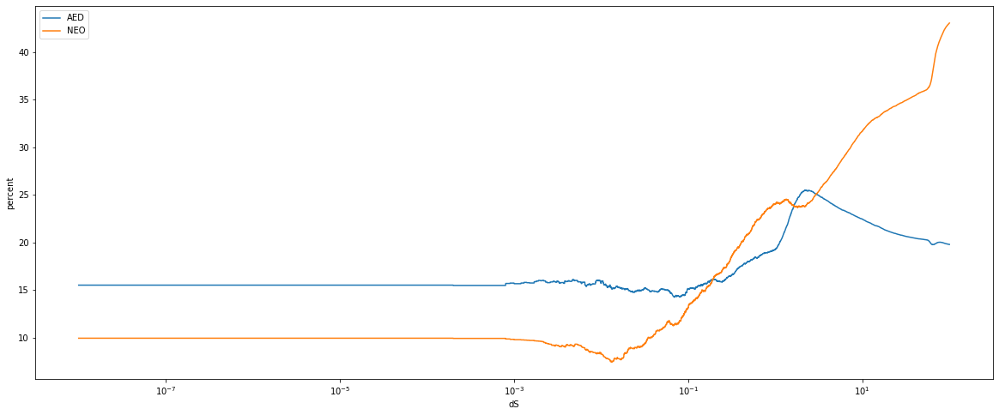

In [122]:
from matplotlib.pyplot import plot, figure
#paraDiffCpy = paraDiffCpy.assign(NF=(paraDiffCpy[tisRng].min(axis=1)==-1)&(paraDiffCpy[tisRng].max(axis=1)==1))
AED_tiss = 54//3
#paraDiffCpy = paraDiffCpy.assign(AED=(paraDiffCpy[tisRng].sum(axis=1)>=AED_tiss)&(paraDiffCpy[tisRng].min(axis=1)>=0))
paraDiffCpy = paraDiffCpy.assign(AED=(paraDiffCpy[tisRng].sum(axis=1)>=AED_tiss)&(paraDiffCpy[tisRng].min(axis=1)>=0))
paraDiffCpy = paraDiffCpy.assign(NEO=(paraDiffCpy[tisRng].min(axis=1)==-1)&(paraDiffCpy[tisRng].max(axis=1)==1))
X=np.logspace(-8, 2, 10000)
fig, ax = pyplot.subplots(figsize=(20, 8))
ax.set_xscale('log')
pyplot.xlabel('dS')
pyplot.ylabel('percent')
plot(X, [100*paraDiffCpy[paraDiffCpy['dS']<x]['AED'].sum()/(paraDiffCpy['dS']<x).sum() for x in X])
plot(X, [100*paraDiffCpy[paraDiffCpy['dS']<x]['NEO'].sum()/(paraDiffCpy['dS']<x).sum() for x in X])
ax.legend(['AED', 'NEO'])
#print('%f %f' % (paraDiffCpy[paraDiffCpy['dS']<0.7]['AED'].sum()/(paraDiffCpy['dS']<0.7).sum(), paraDiffCpy[paraDiffCpy['dS']<0.7]['NEO'].sum()/(paraDiffCpy['dS']<0.7).sum()))
    

In [123]:
from matplotlib.pyplot import plot, figure, show, title
from ipywidgets import interactive, IntSlider
X=np.logspace(-8, 2, 1000)
def para_class_by_ds(tis):
    global paraDiffCpy
    paraDiffCpy = paraDiffCpy.assign(AED=(paraDiffCpy[tisRng].sum(axis=1)>=tis)&(paraDiffCpy[tisRng].min(axis=1)>=0))
    for cpg in [0, 2]:
        fig, ax = pyplot.subplots(figsize=(20, 8))
        ax.set_xscale('log')
        pyplot.xlabel('dS')
        pyplot.ylabel('percent')
        plot(X, [100*paraDiffCpy[(paraDiffCpy['dS']>=x/2)&(paraDiffCpy['dS']<x)&(paraDiffCpy['CpG-ness']==cpg)]['AED'].sum()/((paraDiffCpy['dS']>=x/2)&(paraDiffCpy['dS']<x)&(paraDiffCpy['CpG-ness']==cpg)).sum() for x in X])
        plot(X, [100*paraDiffCpy[(paraDiffCpy['dS']>=x/2)&(paraDiffCpy['dS']<x)&(paraDiffCpy['CpG-ness']==cpg)]['NEO'].sum()/((paraDiffCpy['dS']>=x/2)&(paraDiffCpy['dS']<x)&(paraDiffCpy['CpG-ness']==cpg)).sum() for x in X])
        ax.legend(['AED', 'NEO'])
        title('CpG-full' if cpg>0 else 'CpG-less')
        show()
interactive(para_class_by_ds, tis=IntSlider(min=1,max=45,value=18))

ModuleNotFoundError: No module named 'ipywidgets'

In [ ]:
from matplotlib.pyplot import plot, figure, show, title
from ipywidgets import interactive, IntSlider
def para_class_by_ensembl_age(tis):
    X=branch_order[::-1]
    global paraDiffCpy
    paraDiffCpy = paraDiffCpy.assign(AED=(paraDiffCpy[tisRng].sum(axis=1)>=tis)&(paraDiffCpy[tisRng].min(axis=1)>=0))
    for cpg in [0, 2]:
        fig, ax = pyplot.subplots(figsize=(20, 8))
        pyplot.xlabel('branch point')
        pyplot.ylabel('percent')
        pyplot.xticks(rotation=45)
        plot(X, [100*paraDiffCpy[(paraDiffCpy['Branch point']==b)&(paraDiffCpy['CpG-ness']==cpg)]['AED'].sum()/((paraDiffCpy['Branch point']==b)&(paraDiffCpy['CpG-ness']==cpg)).sum() for b in X])
        plot(X, [100*paraDiffCpy[(paraDiffCpy['Branch point']==b)&(paraDiffCpy['CpG-ness']==cpg)]['NEO'].sum()/((paraDiffCpy['Branch point']==b)&(paraDiffCpy['CpG-ness']==cpg)).sum() for b in X])
        ax.legend(['AED', 'NEO'])
        title('CpG-full' if cpg>0 else 'CpG-less')
        #barplot(ax=ax, hue='cpgfull',x='variable', y='value', data=paraDiffCpy)
        show()
interactive(para_class_by_ensembl_age, tis=IntSlider(min=1,max=45,value=18))

In [ ]:
from matplotlib.pyplot import plot, figure, show, title
from ipywidgets import interactive, IntSlider
def para_class_by_ensembl_age(tis):
    X=branch_order[::-1]
    global paraDiffCpy
    paraDiffCpy = paraDiffCpy.assign(AED=(paraDiffCpy[tisRng].sum(axis=1)>=tis)&(paraDiffCpy[tisRng].min(axis=1)>=0))
    return (
        [paraDiffCpy[(paraDiffCpy['Branch point']==b)&(paraDiffCpy['CpG-ness']==0)]['AED'].sum() for b in X],
        [paraDiffCpy[(paraDiffCpy['Branch point']==b)&(paraDiffCpy['CpG-ness']==0)]['NEO'].sum() for b in X],
        [len(paraDiffCpy[(paraDiffCpy['Branch point']==b)&(paraDiffCpy['CpG-ness']==0)])-paraDiffCpy[(paraDiffCpy['Branch point']==b)&(paraDiffCpy['CpG-ness']==0)]['AED'].sum()-paraDiffCpy[(paraDiffCpy['Branch point']==b)&(paraDiffCpy['CpG-ness']==0)]['NEO'].sum() for b in X],
        [paraDiffCpy[(paraDiffCpy['Branch point']==b)&(paraDiffCpy['CpG-ness']==2)]['AED'].sum() for b in X],
        [paraDiffCpy[(paraDiffCpy['Branch point']==b)&(paraDiffCpy['CpG-ness']==2)]['NEO'].sum() for b in X],
        [len(paraDiffCpy[(paraDiffCpy['Branch point']==b)&(paraDiffCpy['CpG-ness']==2)])-paraDiffCpy[(paraDiffCpy['Branch point']==b)&(paraDiffCpy['CpG-ness']==2)]['AED'].sum()-paraDiffCpy[(paraDiffCpy['Branch point']==b)&(paraDiffCpy['CpG-ness']==2)]['NEO'].sum() for b in X])
        
#interactive(para_class_by_ensembl_age, tis=IntSlider(min=1,max=45,value=18))
para_class = pd.DataFrame([pd.Series(x) for x in para_class_by_ensembl_age(16)])
para_class.index = ['CpG-less/AED', 'CpG-less/NEO', 'CpG-less/Neither', 'CpG-full/AED', 'CpG-full/NEO', 'CpG-full/Neither']
paraT = para_class.T
paraT.index = branch_order[::-1]
para_class = paraT.T
para_class.to_csv('/home/gencpg/gen_cpg/para_class_by_age.csv')
para_class
#pd.la

In [ ]:
import ipywidgets as widgets
widgets.IntSlider()

In [ ]:
(paraDiffCpy['dS']<0.7)&paraDiffCpy['CpG-ness']==2

In [ ]:
#(paraDiffCpy[tisRng]<0.0002).sum(axis=1)
paraDiffCpy
#sum((paraDiffCpy[tisRng]<0.002).sum(axis=1)>15)

In [ ]:
#paraDiffCpy
frame[frame['Length']<=300]
#paraDiffCpy[paraDiffCpy['dS']<0.7].count()
#(paraDiffCpy['dS']<0.7).sum()
#paraDiffCpy['AED'].sum()

In [ ]:
(paraDiff != 0).sum()

In [ ]:
[(t==(tismap=='Cells - Leukemia cell line (CML)')).all() for t in tisidxs]


In [19]:
from csv import DictReader

In [37]:
fmembers = {}
for p in frame.iloc:
    if p['g1'] not in fmembers:
        fmembers[p['g1']] = set()
    if p['g2'] not in fmembers:
        fmembers[p['g2']] = set()
    fmembers[p['g1']].add(p['g2'])
    fmembers[p['g2']].add(p['g1'])
frame = frame.assign(family_size=[len(fmembers[p['g1']])+1 for p in frame.iloc])

19736
Median CPG full:less : 1813.000000:139.000000
Average CPG full:less : 1700.212118:562.838340


/home/gencpg/.local/lib/python3.8/site-packages/numpy/lib/function_base.py:495: RuntimeWarning: Mean of empty slice.
  avg = a.mean(axis)
/home/gencpg/.local/lib/python3.8/site-packages/numpy/core/_methods.py:189: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)
/tmp/ipykernel_144185/684584357.py:43: RuntimeWarning: invalid value encountered in double_scalars
  fact_diff_frames[pre_tss] = DataFrame.from_records([(p[0], p[1], p[2], (p[1] in cpg_full)+(p[2] in cpg_full), abs(factors[:,genemap[p[1]]].sum()-factors[:,genemap[p[2]]].sum()), abs(np.log(factors[:,genemap[p[1]]].sum()+1)-np.log(factors[:,genemap[p[2]]].sum()+1)), (factors[:,genemap[p[1]]]*factors[:,genemap[p[2]]]).sum(), (100.0*factors[:,genemap[p[1]]]*factors[:,genemap[p[2]]]).sum()/(factors[:,genemap[p[1]]]|factors[:,genemap[p[2]]]).sum(), factors[:, genemap[p[1]]].sum(), factors[:, genemap[p[2]]].sum()) for p in itertools.chain(*[[(k,) + w for w in v] for k, v in branch_points

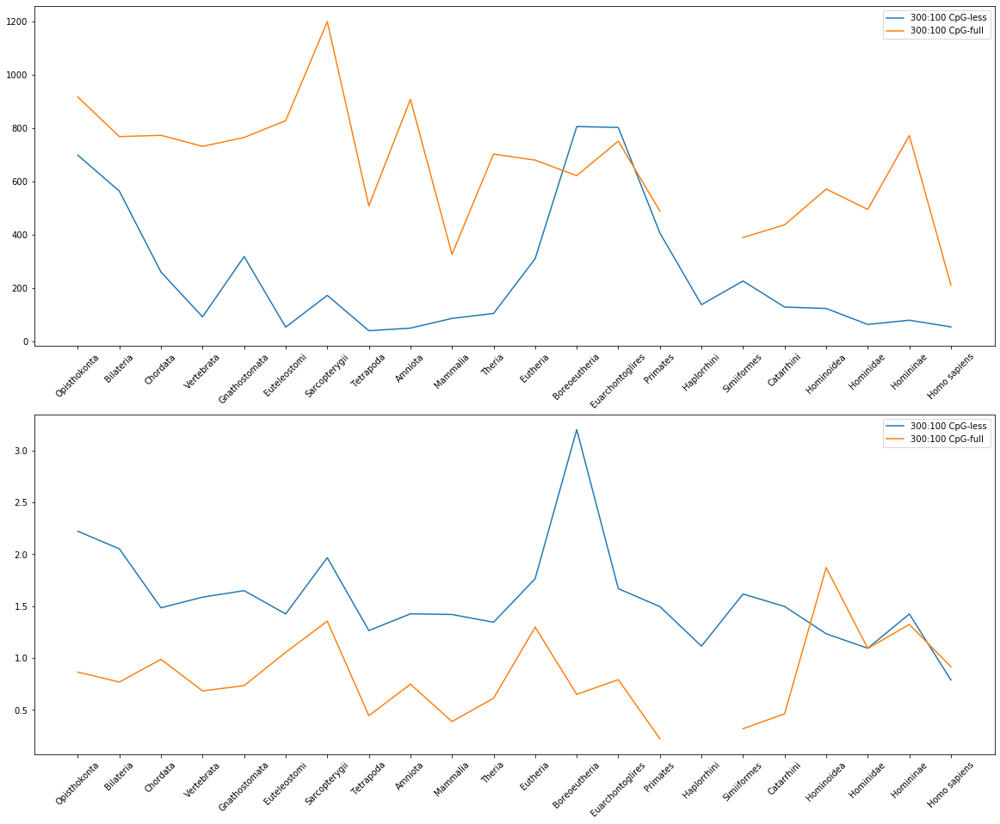

In [43]:
from pybedtools import *
import importlib
import overlap_calc
import re
importlib.reload(overlap_calc)
factNum=sum((1 for prom in DictReader(open('/data/db/import/human_factor_full_QC.txt', 'r'), delimiter='\t') if not re.fullmatch("CTCF|RAD21|REST|EP300|.*POLR.*", prom['Factor'])))
fact_diff_frames = {}
fig, (ax1,ax2) = pyplot.subplots(2,1,figsize=(20,16))
ax1.tick_params('x', labelrotation=45)
ax2.tick_params('x', labelrotation=45)
for pre_tss in [300]: #[500, 1000, 2000, 300]:
    gene_prom_area=overlap_calc.canon_ints(canons.values(),pre_tss=pre_tss, post_tss=100)
    factors = np.zeros((factNum, len(canons)), dtype='int8')
    genemap = dict([(gene_prom_area[i].name, i) for i in range(0, len(gene_prom_area))])
    fact=-1
    print(len(canons))
    DCids = []
    for prom in DictReader(open('/data/db/import/human_factor_full_QC.txt', 'r'), delimiter='\t'):
        if re.fullmatch("CTCF|RAD21|REST|EP300|.*POLR.*", prom['Factor']):
            #print('Skipping %s'%prom['Factor'])
            continue
        fact += 1
        DCids.append(int(prom['DCid']))
        factors[fact,[genemap[x.name] for x in BedTool(gene_prom_area).intersect(BedTool('/data/db/import/human_factor/'+prom['DCid']+'_sort_peaks.narrowPeak.bed'))]] += 1
    print('Median CPG full:less : %f:%f'%(np.median(factors[:,[genemap[x] for x in cpg_full]].sum(axis=0)),
                                      np.median(factors[:,[genemap[x] for x in cpg_less]].sum(axis=0))))
    print('Average CPG full:less : %f:%f'%(np.average(factors[:,[genemap[x] for x in cpg_full]].sum(axis=0)),
                                      np.average(factors[:,[genemap[x] for x in cpg_less]].sum(axis=0))))
    fact_diff = {}
    for b in branch_points.keys():
        l = [x for x in branch_points[b] if x[0] in cpg_less and x[1] in cpg_less]
        f = [x for x in branch_points[b] if x[0] in cpg_full and x[1] in cpg_full]
        fact_diff[b] = (
            np.average([abs(factors[:,genemap[p[0]]].sum()-factors[:,genemap[p[1]]].sum()) for p in l]),
            np.average([abs(factors[:,genemap[p[0]]].sum()-factors[:,genemap[p[1]]].sum()) for p in f]),
            np.average([abs(np.log(factors[:,genemap[p[0]]].sum()+1)-np.log(factors[:,genemap[p[1]]].sum()+1)) for p in l]),
            np.average([abs(np.log(factors[:,genemap[p[0]]].sum()+1)-np.log(factors[:,genemap[p[1]]].sum()+1)) for p in f]),
        )
    ax1.plot(branch_order, [fact_diff[b][0] for b in branch_order], label='%d:100 CpG-less'%(pre_tss))
    ax1.plot(branch_order, [fact_diff[b][1] for b in branch_order], label='%d:100 CpG-full'%(pre_tss))
    ax2.plot(branch_order, [fact_diff[b][2] for b in branch_order], label='%d:100 CpG-less'%(pre_tss))
    ax2.plot(branch_order, [fact_diff[b][3] for b in branch_order], label='%d:100 CpG-full'%(pre_tss))
    fact_diff_frames[pre_tss] = DataFrame.from_records([(p[0], p[1], p[2], (p[1] in cpg_full)+(p[2] in cpg_full), abs(factors[:,genemap[p[1]]].sum()-factors[:,genemap[p[2]]].sum()), abs(np.log(factors[:,genemap[p[1]]].sum()+1)-np.log(factors[:,genemap[p[2]]].sum()+1)), (factors[:,genemap[p[1]]]*factors[:,genemap[p[2]]]).sum(), (100.0*factors[:,genemap[p[1]]]*factors[:,genemap[p[2]]]).sum()/(factors[:,genemap[p[1]]]|factors[:,genemap[p[2]]]).sum(), factors[:, genemap[p[1]]].sum(), factors[:, genemap[p[2]]].sum()) for p in itertools.chain(*[[(k,) + w for w in v] for k, v in branch_points.items()])], columns=['Branch point', 'g1', 'g2', 'CpG-ness', 'change', 'fold', 'mutual', 'mut-pct', 'factors-g1', 'factors-g2'])

ax1.set_label('Expressed factors mean difference per branch-point')
ax2.set_label('log(Expressed factors) mean difference per branch-point')

ax1.legend()
ax2.legend()
pyplot.show()
fact_diff_frame=fact_diff_frames[300]
    #print('%s:%s'%(prom['Factor'], len()))

In [44]:
#fact_diff_frame = DataFrame.from_records([(p[0], p[1], p[2], (p[1] in cpg_full)+(p[2] in cpg_full), abs(factors[:,genemap[p[1]]].sum()-factors[:,genemap[p[2]]].sum()), abs(np.log(factors[:,genemap[p[1]]].sum()+1)-np.log(factors[:,genemap[p[2]]].sum()+1)), (factors[:,genemap[p[1]]]*factors[:,genemap[p[2]]]).sum(), (100.0*factors[:,genemap[p[1]]]*factors[:,genemap[p[2]]]).sum()/(factors[:,genemap[p[1]]]|factors[:,genemap[p[2]]]).sum(), factors[:, genemap[p[1]]].sum(), factors[:, genemap[p[2]]].sum()) for p in itertools.chain(*[[(k,) + w for w in v] for k, v in branch_points.items()])], columns=['Branch point', 'g1', 'g2', 'CpG-ness', 'change', 'fold', 'mutual', 'mut-pct', 'factors-g1', 'factors-g2'])
fact_diff_frame=fact_diff_frame.join(frame[frame['family_size']<=3].set_index(['g1', 'g2'])['dSbin'], on=['g1', 'g2'])
fact_diff_frame

,Branch point,g1,g2,CpG-ness,change,fold,mutual,mut-pct,factors-g1,factors-g2,dSbin
0,Vertebrata,gene:ENSG00000171860,gene:ENSG00000174600,0,572,1.464547,35,3.981797,743,171,NaN
1,Vertebrata,gene:ENSG00000174600,gene:ENSG00000171860,0,572,1.464547,35,3.981797,171,743,NaN
2,Vertebrata,gene:ENSG00000171049,gene:ENSG00000174600,0,158,2.508437,6,3.370787,13,171,NaN
3,Vertebrata,gene:ENSG00000174600,gene:ENSG00000171049,0,158,2.508437,6,3.370787,171,13,NaN
4,Vertebrata,gene:ENSG00000142511,gene:ENSG00000174600,0,168,3.761200,0,0.000000,3,171,NaN
...,...,...,...,...,...,...,...,...,...,...,...
266651,Haplorrhini,gene:ENSG00000243264,gene:ENSG00000251039,0,14,0.875469,1,3.225806,9,23,NaN
266652,Haplorrhini,gene:ENSG00000119599,gene:ENSG00000176566,1,117,1.140161,7,3.211009,54,171,NaN
266653,Haplorrhini,gene:ENSG00000176566,gene:ENSG00000119599,1,117,1.140161,7,3.211009,171,54,NaN
266654,Haplorrhini,gene:ENSG00000196735,gene:ENSG00000237541,0,291,2.401025,24,7.430341,319,28,NaN


In [48]:
fact_diff_frame = fact_diff_frame[fact_diff_frame['dSbin'].notna()]

In [49]:
import random
tfbm_scores = [(factors[:,genemap[x]]*factors[:,genemap[y]]).sum() for x,y in zip(random.sample(list(canons.keys()), 10000), random.sample(list(canons.keys()), 10000)) if factors[:,genemap[x]].sum() >= 2 or factors[:,genemap[y]].sum() >= 2]
tfbm_scores_pct = [(factors[:,genemap[x]]*factors[:,genemap[y]]).sum()/(factors[:,genemap[x]]|factors[:,genemap[y]]).sum() for x,y in zip(random.sample(list(canons.keys()), 10000), random.sample(list(canons.keys()), 10000)) if factors[:,genemap[x]].sum() >= 2 or factors[:,genemap[y]].sum() >= 2]

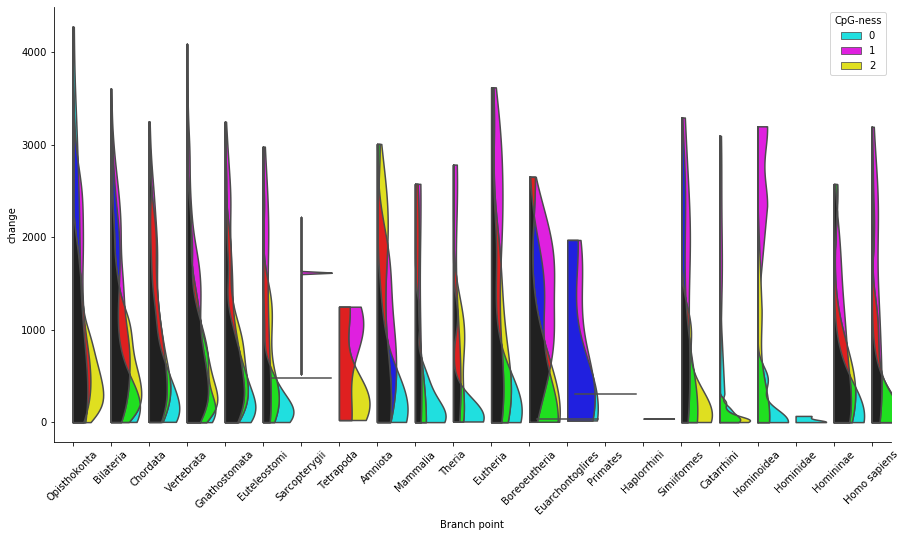

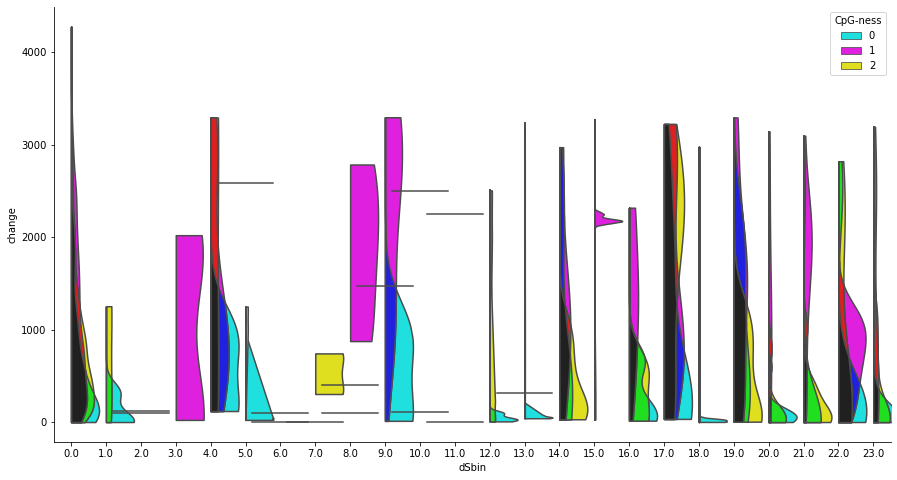

In [52]:
fig, ax = pyplot.subplots(figsize=(15,8))
pyplot.xticks(rotation=45)
onesidedviolinplot(ax=ax, x="Branch point", y="change", hue="CpG-ness", cut=0, data=fact_diff_frame, order=branch_order, inner=None, palette=['cyan', 'magenta', 'yellow'])
despine()
fig, ax = pyplot.subplots(figsize=(15,8))
onesidedviolinplot(ax=ax, x="dSbin", y="change", hue="CpG-ness", cut=0, data=fact_diff_frame, inner=None, palette=['cyan', 'magenta', 'yellow'])
despine()

In [ ]:
fig, ax = pyplot.subplots(figsize=(15,8))
pyplot.xticks(rotation=45)
onesidedviolinplot(ax=ax, x="Branch point", y="fold", hue="CpG-ness", cut=0, data=fact_diff_frame, order=branch_order, inner=None, palette=['cyan', 'magenta', 'yellow'])
despine()
fig, ax = pyplot.subplots(figsize=(15,8))
onesidedviolinplot(ax=ax, x="dSbin", y="fold", hue="CpG-ness", cut=0, data=fact_diff_frame, inner=None, palette=['cyan', 'magenta', 'yellow'])
despine()

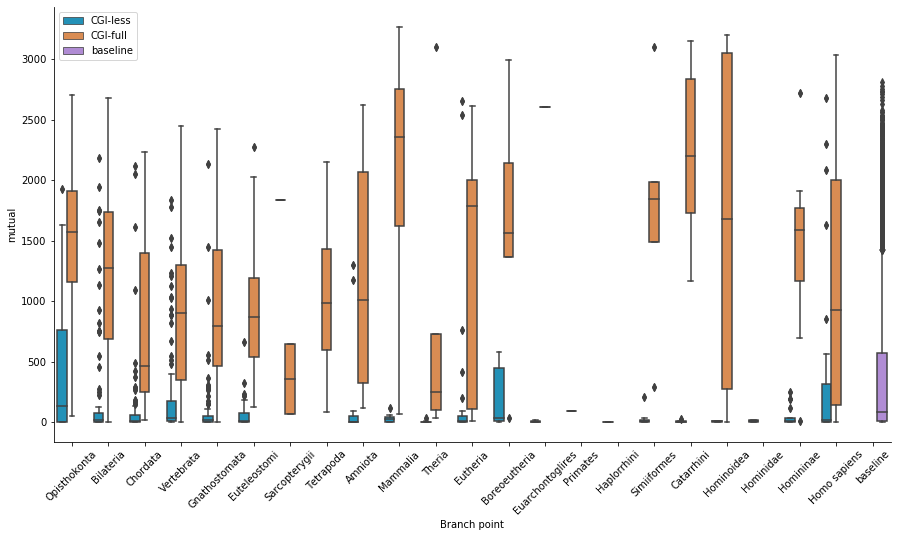

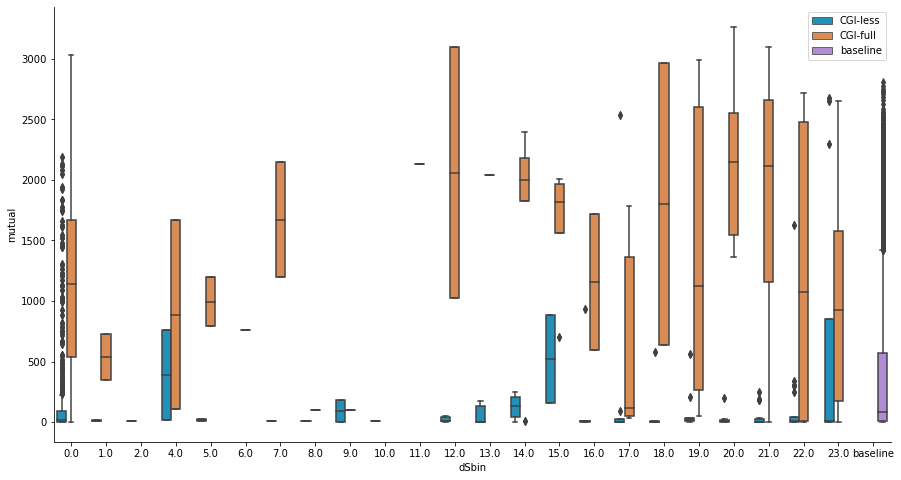

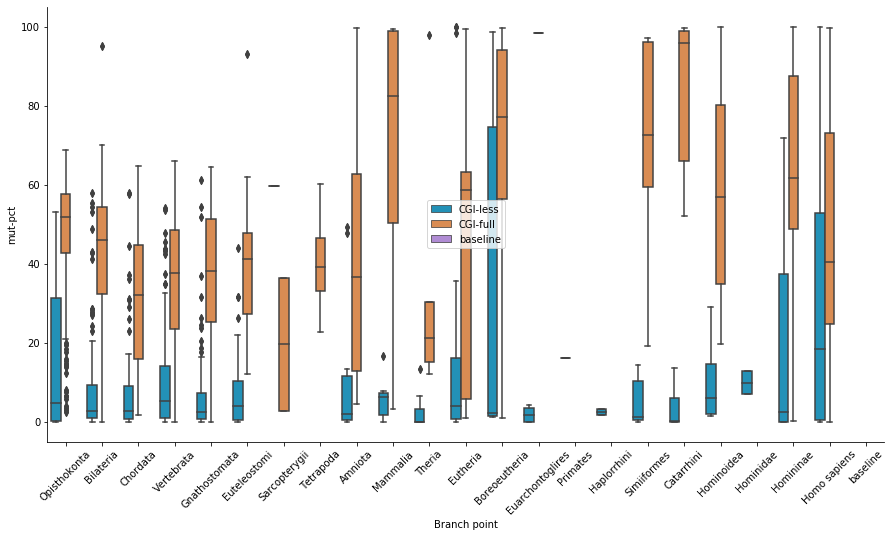

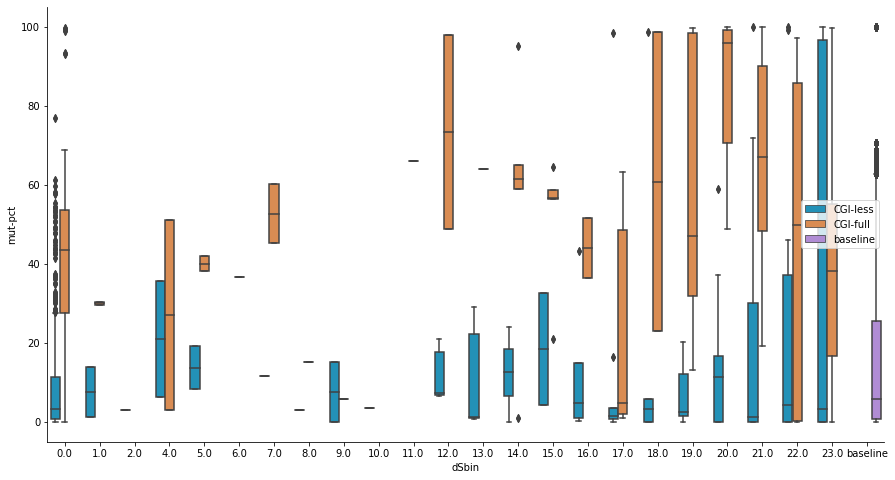

In [57]:
from seaborn import despine
fig, ax = pyplot.subplots(figsize=(15,8))
pyplot.xticks(rotation=45)
g=boxplot(ax=ax, x="Branch point", y="mutual", hue="CpG-ness", data=pd.concat([fact_diff_frame[(fact_diff_frame['CpG-ness'] != 1)&((fact_diff_frame['factors-g1'] >= 2) | (fact_diff_frame['factors-g2'] >= 2))], pd.DataFrame.from_dict({'mutual':tfbm_scores}).assign(**{'CpG-ness':3, 'Branch point':'baseline'})]), order=[*branch_order, 'baseline'], palette=['#0b9dcf', '#ef893d', '#b080e0'], dodge=True)
handles, _ = g.get_legend_handles_labels()
g.legend(handles, ['CGI-less', 'CGI-full', 'baseline'])
despine()
plt.savefig('human-tfbm-mutual-by-cgi-bp-with-baseline-3-fam.pdf', dpi=600)
fig, ax = pyplot.subplots(figsize=(15,8))
g=boxplot(ax=ax, x="dSbin", y="mutual", hue="CpG-ness", data=pd.concat([fact_diff_frame[(fact_diff_frame['CpG-ness'] != 1)&((fact_diff_frame['factors-g1'] >= 2) | (fact_diff_frame['factors-g2'] >= 2))], pd.DataFrame.from_dict({'mutual':tfbm_scores}).assign(**{'CpG-ness':3, 'dSbin': 'baseline'})]), order=[*sorted(fact_diff_frame[(fact_diff_frame['CpG-ness'] != 1)&((fact_diff_frame['factors-g1'] >= 2) | (fact_diff_frame['factors-g2'] >= 2))]['dSbin'].unique()), 'baseline'], palette=['#0b9dcf', '#ef893d', '#b080e0'], dodge=True)
handles, _ = g.get_legend_handles_labels()
g.legend(handles, ['CGI-less', 'CGI-full', 'baseline'])
despine()
plt.savefig('human-tfbm-mutual-by-cgi-ds-with-baseline-3-fam.pdf', dpi=600)
fig, ax = pyplot.subplots(figsize=(15,8))
pyplot.xticks(rotation=45)
g=boxplot(ax=ax, x="Branch point", y="mut-pct", hue="CpG-ness", data=pd.concat([fact_diff_frame[(fact_diff_frame['CpG-ness'] != 1)&((fact_diff_frame['factors-g1'] >= 2) | (fact_diff_frame['factors-g2'] >= 2))], pd.DataFrame.from_dict({'mutual':tfbm_scores}).assign(**{'CpG-ness':3, 'Branch point':'baseline'})]), order=[*branch_order, 'baseline'], palette=['#0b9dcf', '#ef893d', '#b080e0'], dodge=True)
handles, _ = g.get_legend_handles_labels()
g.legend(handles, ['CGI-less', 'CGI-full', 'baseline'])
despine()
plt.savefig('human-tfbm-mutpct-by-cgi-bp-with-baseline-3-fam.pdf', dpi=600)
fig, ax = pyplot.subplots(figsize=(15,8))
g=boxplot(ax=ax, x="dSbin", y="mut-pct", hue="CpG-ness", data=pd.concat([fact_diff_frame[(fact_diff_frame['CpG-ness'] != 1)&((fact_diff_frame['factors-g1'] >= 2) | (fact_diff_frame['factors-g2'] >= 2))], pd.DataFrame.from_dict({'mut-pct':[x*100 for x in tfbm_scores_pct*100]}).assign(**{'CpG-ness':3, 'dSbin': 'baseline'})]), order=[*sorted(fact_diff_frame[(fact_diff_frame['CpG-ness'] != 1)&((fact_diff_frame['factors-g1'] >= 2) | (fact_diff_frame['factors-g2'] >= 2))]['dSbin'].unique()), 'baseline'], palette=['#0b9dcf', '#ef893d', '#b080e0'], dodge=True)
handles, _ = g.get_legend_handles_labels()
g.legend(handles, ['CGI-less', 'CGI-full', 'baseline'])
despine()
plt.savefig('human-tfbm-mutpct-by-cgi-ds-with-baseline-3-fam.pdf', dpi=600)

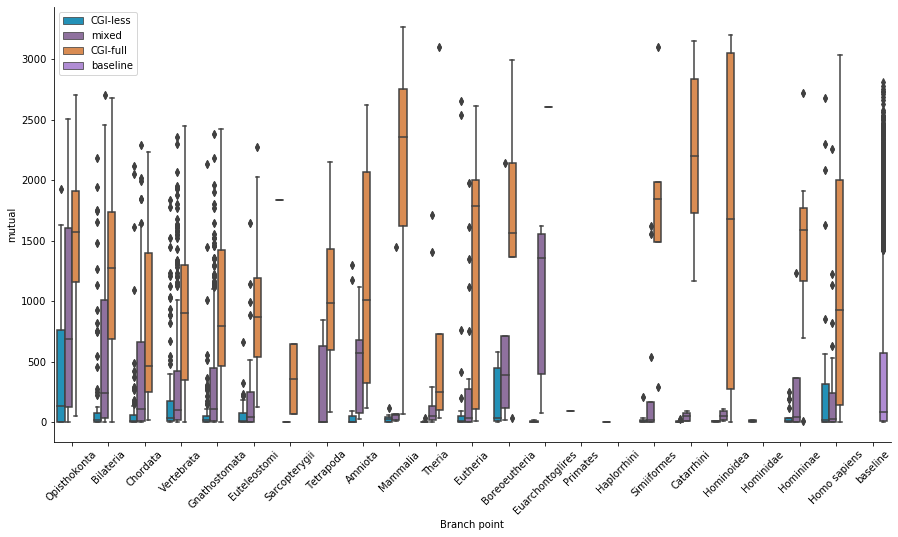

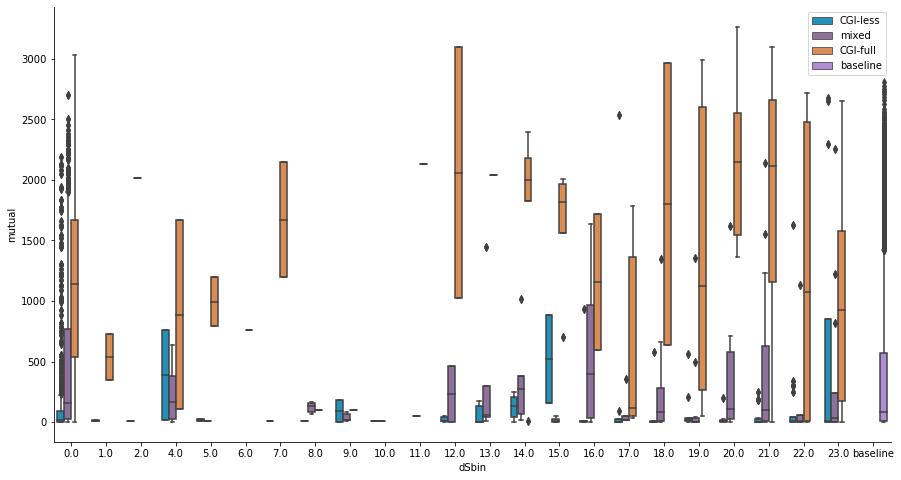

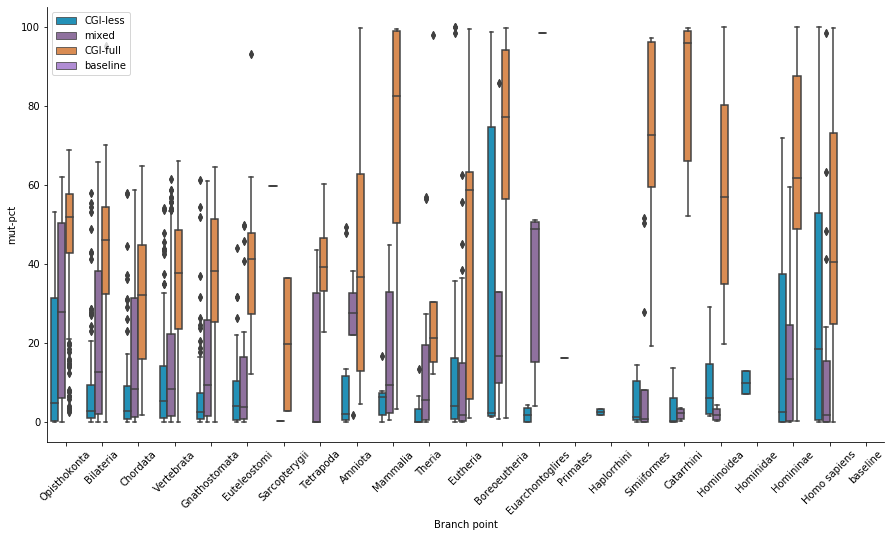

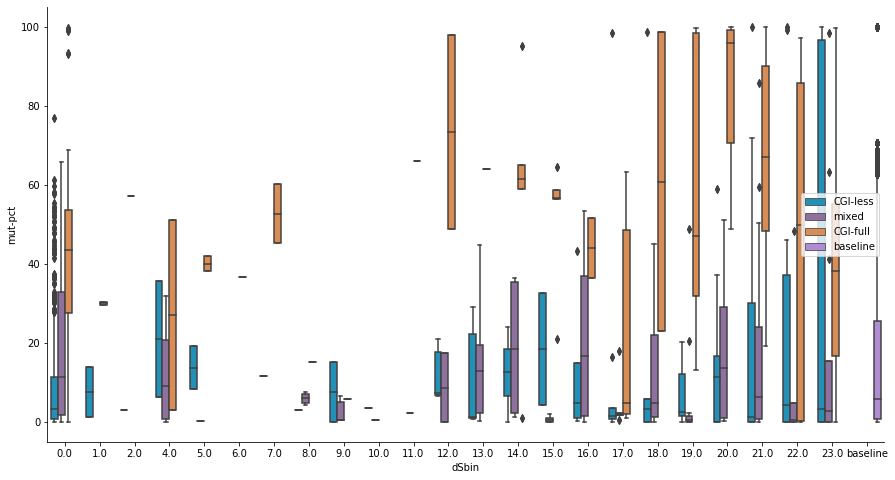

In [66]:
from seaborn import despine
fig, ax = pyplot.subplots(figsize=(15,8))
pyplot.xticks(rotation=45)
g=boxplot(ax=ax, x="Branch point", y="mutual", hue="CpG-ness", data=pd.concat([fact_diff_frame[((fact_diff_frame['factors-g1'] >= 2) | (fact_diff_frame['factors-g2'] >= 2))], pd.DataFrame.from_dict({'mutual':tfbm_scores}).assign(**{'CpG-ness':3, 'Branch point':'baseline'})]), order=[*branch_order, 'baseline'], palette=['#0b9dcf', '#926AA5', '#ef893d', '#b080e0'], dodge=True)
handles, _ = g.get_legend_handles_labels()
g.legend(handles, ['CGI-less', 'mixed', 'CGI-full', 'baseline'])
despine()
plt.savefig('human-tfbm-mutual-by-cgi-bp-with-baseline-3-fam-mixed.pdf', dpi=600)
fig, ax = pyplot.subplots(figsize=(15,8))
g=boxplot(ax=ax, x="dSbin", y="mutual", hue="CpG-ness", data=pd.concat([fact_diff_frame[((fact_diff_frame['factors-g1'] >= 2) | (fact_diff_frame['factors-g2'] >= 2))], pd.DataFrame.from_dict({'mutual':tfbm_scores}).assign(**{'CpG-ness':3, 'dSbin': 'baseline'})]), order=[*sorted(fact_diff_frame[(fact_diff_frame['CpG-ness'] != 1)&((fact_diff_frame['factors-g1'] >= 2) | (fact_diff_frame['factors-g2'] >= 2))]['dSbin'].unique()), 'baseline'], palette=['#0b9dcf', '#926AA5', '#ef893d', '#b080e0'], dodge=True)
handles, _ = g.get_legend_handles_labels()
g.legend(handles, ['CGI-less',  'mixed','CGI-full', 'baseline'])
despine()
plt.savefig('human-tfbm-mutual-by-cgi-ds-with-baseline-3-fam-mixed.pdf', dpi=600)
fig, ax = pyplot.subplots(figsize=(15,8))
pyplot.xticks(rotation=45)
g=boxplot(ax=ax, x="Branch point", y="mut-pct", hue="CpG-ness", data=pd.concat([fact_diff_frame[((fact_diff_frame['factors-g1'] >= 2) | (fact_diff_frame['factors-g2'] >= 2))], pd.DataFrame.from_dict({'mutual':tfbm_scores}).assign(**{'CpG-ness':3, 'Branch point':'baseline'})]), order=[*branch_order, 'baseline'], palette=['#0b9dcf', '#926AA5', '#ef893d', '#b080e0'], dodge=True)
handles, _ = g.get_legend_handles_labels()
g.legend(handles, ['CGI-less',  'mixed','CGI-full', 'baseline'])
despine()
plt.savefig('human-tfbm-mutpct-by-cgi-bp-with-baseline-3-fam-mixed.pdf', dpi=600)
fig, ax = pyplot.subplots(figsize=(15,8))
g=boxplot(ax=ax, x="dSbin", y="mut-pct", hue="CpG-ness", data=pd.concat([fact_diff_frame[((fact_diff_frame['factors-g1'] >= 2) | (fact_diff_frame['factors-g2'] >= 2))], pd.DataFrame.from_dict({'mut-pct':[x*100 for x in tfbm_scores_pct*100]}).assign(**{'CpG-ness':3, 'dSbin': 'baseline'})]), order=[*sorted(fact_diff_frame[(fact_diff_frame['CpG-ness'] != 1)&((fact_diff_frame['factors-g1'] >= 2) | (fact_diff_frame['factors-g2'] >= 2))]['dSbin'].unique()), 'baseline'], palette=['#0b9dcf', '#926AA5', '#ef893d', '#b080e0'], dodge=True)
handles, _ = g.get_legend_handles_labels()
g.legend(handles, ['CGI-less',  'mixed','CGI-full', 'baseline'])
despine()
plt.savefig('human-tfbm-mutpct-by-cgi-ds-with-baseline-3-fam-mixed.pdf', dpi=600)

In [70]:
from scipy.stats import mannwhitneyu
branchSkip = set()

for x in branch_order:
    if sum((fact_diff_frame['Branch point'] == x)&(fact_diff_frame['CpG-ness'] == 2)&(fact_diff_frame['mut-pct'].notna()))>0 and sum((fact_diff_frame['Branch point'] == x)&(fact_diff_frame['CpG-ness'] == 0)&(fact_diff_frame['mut-pct'].notna()))>0:
        print('Group sizes: %d, %d'%(sum((fact_diff_frame['Branch point'] == x)&(fact_diff_frame['CpG-ness'] == 2)&(fact_diff_frame['mut-pct'].notna())), sum((fact_diff_frame['Branch point'] == x)&(fact_diff_frame['CpG-ness'] == 0)&(fact_diff_frame['mut-pct'].notna()))))
        print("Mann-Whitney test of TFBM (abs) on Branch point %s CGI-full vs. CGI-less (human), Expression and FDR controlled: %s"%(x, mannwhitneyu(fact_diff_frame[(fact_diff_frame['Branch point'] == x)&(fact_diff_frame['CpG-ness'] == 2)]['mutual'].dropna(), fact_diff_frame[(fact_diff_frame['Branch point'] == x)&(fact_diff_frame['CpG-ness'] == 0)]['mutual'].dropna(), alternative='greater').pvalue*len(branch_order)))
        print("Mann-Whitney test of TFBM (pct) on Branch point %s CGI-full vs. CGI-less (human), Expression and FDR controlled: %s"%(x, mannwhitneyu(fact_diff_frame[(fact_diff_frame['Branch point'] == x)&(fact_diff_frame['CpG-ness'] == 2)]['mut-pct'].dropna(), fact_diff_frame[(fact_diff_frame['Branch point'] == x)&(fact_diff_frame['CpG-ness'] == 0)]['mut-pct'].dropna(), alternative='greater').pvalue*len(branch_order)))
    else:
        print('Skipping %s'%x)
        branchSkip.add(x)


Group sizes: 466, 70
Mann-Whitney test of TFBM (abs) on Branch point Opisthokonta CGI-full vs. CGI-less (human), Expression and FDR controlled: 5.917543774976642e-24
Mann-Whitney test of TFBM (pct) on Branch point Opisthokonta CGI-full vs. CGI-less (human), Expression and FDR controlled: 2.9118134648070633e-24
Group sizes: 718, 194
Mann-Whitney test of TFBM (abs) on Branch point Bilateria CGI-full vs. CGI-less (human), Expression and FDR controlled: 8.045889521906723e-70
Mann-Whitney test of TFBM (pct) on Branch point Bilateria CGI-full vs. CGI-less (human), Expression and FDR controlled: 6.466891477524918e-70
Group sizes: 156, 138
Mann-Whitney test of TFBM (abs) on Branch point Chordata CGI-full vs. CGI-less (human), Expression and FDR controlled: 3.2155767559002476e-30
Mann-Whitney test of TFBM (pct) on Branch point Chordata CGI-full vs. CGI-less (human), Expression and FDR controlled: 1.6154322466905865e-28
Group sizes: 440, 204
Mann-Whitney test of TFBM (abs) on Branch point Verteb

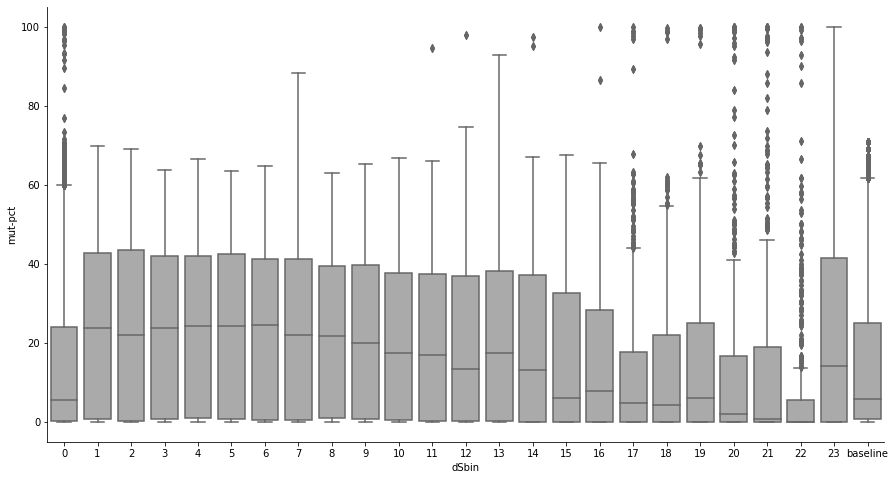

In [149]:
fig, ax = pyplot.subplots(figsize=(15,8))
g=boxplot(ax=ax, x="dSbin", y="mut-pct", data=pd.concat([fact_diff_frame[((fact_diff_frame['factors-g1'] >= 2) | (fact_diff_frame['factors-g2'] >= 2))], pd.DataFrame.from_dict({'mut-pct':[x*100 for x in tfbm_scores_pct*100]}).assign(**{'dSbin': 'baseline'})]), order=[*sorted(fact_diff_frame[((fact_diff_frame['factors-g1'] >= 2) | (fact_diff_frame['factors-g2'] >= 2))]['dSbin'].unique()), 'baseline'], palette=['#aaaaaa'], dodge=True)
despine()
plt.savefig('human-tfbm-mutpct-ds-with-baseline.pdf', dpi=600)

In [131]:
fact_diff_frame.columns

Index(['Branch point', 'g1', 'g2', 'CpG-ness', 'change', 'fold', 'mutual',
       'mut-pct', 'factors-g1', 'factors-g2'],
      dtype='object')

In [ ]:
from seaborn import boxplot
fig, ax = pyplot.subplots(figsize=(15,8))
pyplot.xticks(rotation=45)
boxplot(ax=ax, x="Branch point", y="mut-pct", hue="CpG-ness", data=fact_diff_frame, order=branch_order, palette=['#0b9dcf','#926aa5', '#ef893d'])
despine()
fig, ax = pyplot.subplots(figsize=(15,8))
boxplot(ax=ax, x="dSbin", y="mut-pct", hue="CpG-ness", data=fact_diff_frame, palette=['#0b9dcf','#926aa5', '#ef893d'])
despine()

In [ ]:
gene_prom_area=overlap_calc.canon_ints(canons.values(), pre_tss=1000, post_tss=100)
#BTAF1
print('less %d'%len([x for x in [x.name for x in BedTool(gene_prom_area).intersect(BedTool('/data/db/import/human_factor/1_sort_peaks.narrowPeak.bed'))] if x in cpg_less]))
print('full %d'%len([x for x in [x.name for x in BedTool(gene_prom_area).intersect(BedTool('/data/db/import/human_factor/1_sort_peaks.narrowPeak.bed'))] if x in cpg_full]))

In [ ]:

#[list([g.replace(' - ', '_') for g in tisRng])]
genentropy = read_csv('/home/evgeny/tau/gen_cpg/GTEx_Analysis_gene_median_tpm.txt', delimiter='\t', index_col='Name')
genentropy = genentropy.drop([i for i in genentropy.index if i.count('_') > 0])
genentropy.index = [g.split('.')[0] for g in genentropy.index]
genentropy=genentropy.apply(lambda x : Series([i/x.sum() for i in x]) if x.sum()>1e-10 else Series([0 for i in x]), axis=1)
genentropy=genentropy.apply(lambda x : sum((-i*log(i+1e-10)/log(2) for i in x)), axis=1)
#genentropy

In [92]:
from pandas import concat
from math import isnan, nan
can_fr=DataFrame.from_records([((k,)+v) for k,v in canons.items()], columns=['gene', 'feature', 'seq', 'first_intron', 'introns']).set_index('gene')
def coldec(postfix):
    return lambda c: c.replace('(','-').replace(')','-')+'-'+postfix
for tis in range(1,46):
    paraDiffCpy = paraDiffCpy.assign(**{('AED%d'%tis) : ((paraDiffCpy[tisRng].sum(axis=1)>=tis)&(paraDiffCpy[tisRng].min(axis=1)>=0))|((paraDiffCpy[tisRng].sum(axis=1)<=-tis)&(paraDiffCpy[tisRng].max(axis=1)<=0)) })
export=frame.join(paraDiffCpy.drop(columns=list(tisRng)+['AED', 'NF']).set_index(['g1', 'g2']).rename(columns=coldec('exprtest')), on=['g1', 'g2']).\
             join(paraMean.set_index(['g1', 'g2']).rename(columns=coldec('mean-log-diff')), on=['g1', 'g2']).\
             join(paraPval.set_index(['g1', 'g2']).rename(columns=coldec('ttest-pval')), on=['g1', 'g2']).\
             join(can_fr[['first_intron', 'introns']].rename(columns=coldec('g1')), on='g1').\
             join(can_fr[['first_intron', 'introns']].rename(columns=coldec('g2')), on='g2').\
             join(frexpr[['g1', 'g2', 'expr_corr']].assign(expr_corr_factor=lambda x: [v[0] if v is not None else None for v in x.expr_corr]).assign(expr_corr_pval=lambda x: [v[1] if v is not None else None for v in x.expr_corr]).drop(columns=['expr_corr']).set_index(['g1', 'g2']), on=['g1', 'g2']).\
             join(fact_diff_frame[['g1', 'g2', 'change','fold','mutual','mut-pct','factors-g1','factors-g2']].set_index(['g1', 'g2']), on=['g1', 'g2'])
for pre_tss in [500, 1000, 2000]:
    export=export.join(fact_diff_frames[pre_tss][['g1', 'g2', 'change','fold','mutual','mut-pct','factors-g1','factors-g2']].set_index(['g1', 'g2']).rename(columns=coldec('%d'%pre_tss)), on=['g1', 'g2'])
export=export.assign(g1=lambda x: [v[5:] for v in x.g1]).\
             join(genexpr.drop(columns=['cpgness', 'cpgfull']).rename(columns=coldec('g1-tpm')), on='g1').assign(g2=lambda x: [v[5:] for v in x.g2]).join(genexpr.drop(columns=['cpgness', 'cpgfull']).rename(columns=coldec('g2-tpm')), on='g2')
#export=export.drop(columns=[c for c in export.columns if c.endswith('-exprtest') ])
for prom in [ "compara_overlaps_300", "compara_overlaps_500", "compara_overlaps_1000", "compara_overlaps_2000", "ucsc_overlaps_300", "ucsc_overlaps_500", "ucsc_overlaps_1000", "ucsc_overlaps_2000", "hs_elife_overlaps"]:
    ovl = pickle.load(open('%s.pkl'%(prom,), 'rb'))
    export = export.assign(**{prom : lambda x: [(1 if ovl['gene:'+x[0]] > 0.5 else 0) + (1 if ovl['gene:'+x[1]] > 0.5 else 0)  if 'gene:'+x[0] in ovl and 'gene:'+x[1] in ovl else None for x in zip(x.g1, x.g2)]})

barchclass = [(l['Parent ID'], l['Child ID'], l['Classification']) if l['Parent ID']<l['Child ID'] else (l['Child ID'], l['Parent ID'], l['Classification'])
                  for l in DictReader(open('/home/evgeny/tau/gen_cpg/12862_2015_426_MOESM1_ESM.csv', 'r')) if l['Species with duplication']=='human'] 
barchmap = {}
for b in barchclass:
    if (b[0], b[1]) not in barchmap:
        barchmap[(b[0], b[1])] = b[2]
    elif barchmap[(b[0], b[1])] != b[2]:
        barchmap[(b[0], b[1])] = 'CONFLICT'
    
barchclass = DataFrame.from_records(((b[0][0], b[0][1], b[1]) for b in barchmap.items() if b[1] != 'CONFLICT'), columns=['g1', 'g2', 'Classification'])

export = export.join(genentropy.rename('Entropy-g1'), on='g1').join(genentropy.rename('Entropy-g2'), on='g2')
export = export.join(barchclass.set_index(['g1', 'g2'])[['Classification']], on=['g1', 'g2'])
export=export.assign(NEO2=lambda x : (x['expr_corr_factor']<0.11) & (x['Entropy-g1']<3.854) & (x['Entropy-g2']<3.854))

diffcols = [c for c in export.columns if c.endswith('-mean-log-diff')]
tistran = {
    'Adipose - Subcutaneous' :  'Adipose_Subcutaneous', 'Adipose - Visceral -Omentum-' :  'Adipose_Visceral_(Omentum)',
 'Adrenal Gland' :  'Adrenal_Gland', 'Artery - Aorta' :  'Artery_Aorta', 'Artery - Coronary' :  'Artery_Coronary', 'Artery - Tibial' :  'Artery_Tibial',
 'Bladder' :  'Bladder', 'Brain - Amygdala' :  'Brain_Amygdala', 'Brain - Anterior cingulate cortex -BA24-' :  'Brain_Anterior_cingulate_cortex_(BA24)',
 'Brain - Caudate -basal ganglia-' :  'Brain_Caudate_(basal_ganglia)', 'Brain - Cerebellar Hemisphere' :  'Brain_Cerebellar_Hemisphere',
 'Brain - Cerebellum' :  'Brain_Cerebellum', 'Brain - Cortex' :  'Brain_Cortex', 'Brain - Frontal Cortex -BA9-' :  'Brain_Frontal_Cortex_(BA9)',
 'Brain - Hippocampus' :  'Brain_Hippocampus', 'Brain - Hypothalamus' :  'Brain_Hypothalamus', 'Brain - Nucleus accumbens -basal ganglia-' :  'Brain_Nucleus_accumbens_(basal_ganglia)',
 'Brain - Putamen -basal ganglia-' :  'Brain_Putamen_(basal_ganglia)', 'Brain - Spinal cord -cervical c-1-' :  'Brain_Spinal_cord_(cervical_c-1)',
 'Brain - Substantia nigra' :  'Brain_Substantia_nigra', 'Breast - Mammary Tissue' :  'Breast_Mammary_Tissue',
 'Cervix - Ectocervix' :  'Cervix_Ectocervix', 'Cervix - Endocervix' :  'Cervix_Endocervix', 'Colon - Sigmoid' :  'Colon_Sigmoid',
 'Colon - Transverse' :  'Colon_Transverse', 'Esophagus - Gastroesophageal Junction' :  'Esophagus_Gastroesophageal_Junction',
 'Esophagus - Mucosa' :  'Esophagus_Mucosa', 'Esophagus - Muscularis' :  'Esophagus_Muscularis', 'Fallopian Tube' :  'Fallopian_Tube',
 'Heart - Atrial Appendage' :  'Heart_Atrial_Appendage', 'Heart - Left Ventricle' :  'Heart_Left_Ventricle', 'Kidney - Cortex' :  'Kidney_Cortex',
 'Kidney - Medulla' :  'Kidney_Medulla', 'Liver' :  'Liver', 'Lung' :  'Lung', 'Minor Salivary Gland' :  'Minor_Salivary_Gland',
 'Muscle - Skeletal' :  'Muscle_Skeletal', 'Nerve - Tibial' :  'Nerve_Tibial', 'Ovary' :  'Ovary', 'Pancreas' :  'Pancreas', 'Pituitary' :  'Pituitary',
 'Prostate' :  'Prostate', 'Skin - Not Sun Exposed -Suprapubic-' :  'Skin_Not_Sun_Exposed_', 'Skin - Sun Exposed -Lower leg-' :  'Skin_Sun_Exposed',
 'Small Intestine - Terminal Ileum' :  'Small_Intestine_Terminal_Ileum', 'Spleen' :  'Spleen', 'Stomach' :  'Stomach', 'Testis' :  'Testis',
 'Thyroid' :  'Thyroid', 'Uterus' :  'Uterus', 'Vagina' :  'Vagina', 'Whole Blood' : 'Whole_Blood' }
g1tpmcol = coldec('g1-tpm')
g2tpmcol = coldec('g2-tpm')
export = export.assign(mx=export[diffcols].max(axis=1), mn=-export[diffcols].min(axis=1), mxidx=export[diffcols].idxmax(axis=1), mnidx=export[diffcols].idxmin(axis=1),
                      mng1=[r[g1tpmcol(tistran[x[:-14]])] if type(x)==str else nan for x,r in zip(export[diffcols].idxmin(axis=1), export.iloc)], mxg1=[r[g1tpmcol(tistran[x[:-14]])] if type(x)==str else nan for x,r in zip(export[diffcols].idxmax(axis=1), export.iloc)],
                      mng2=[r[g2tpmcol(tistran[x[:-14]])] if type(x)==str else nan for x,r in zip(export[diffcols].idxmin(axis=1), export.iloc)], mxg2=[r[g2tpmcol(tistran[x[:-14]])] if type(x)==str else nan for x,r in zip(export[diffcols].idxmax(axis=1), export.iloc)])
export = export.join(pickle.load(open('/data/db/import/save/human-export-sim-local.pkl', 'rb'))[['g1','g2','PromPresScore300','PromPresTssMinus300','PromPresShift300']].set_index(['g1', 'g2']), on=['g1', 'g2'])
export = export.assign(g1_cpgness=('gene:'+export['g1']).isin(cpg_full)).assign(g2_cpgness=('gene:'+export['g2']).isin(cpg_full))
ohno=set((orow['Ohnolog1'], orow['Ohnolog2']) for orow in read_csv('/home/evgeny/tau/gen_cpg/ohno-pnas.csv', skiprows=1).iloc)
export=export.assign(ohno=export[['g1', 'g2']].apply(lambda x: (x[0], x[1]), axis=1).isin(ohno)|export[['g1', 'g2']].apply(lambda x: (x[1], x[0]), axis=1).isin(ohno))

export[export['g1']<export['g2']].to_csv('human-paralogs.csv')


/home/gencpg/.local/lib/python3.6/site-packages/pandas/core/computation/expressions.py:204: UserWarning: evaluating in Python space because the '+' operator is not supported by numexpr for the bool dtype, use '|' instead
  f"evaluating in Python space because the {repr(op_str)} "


In [94]:
pickle.dump(canons, open('/data/db/import/save/paralogs-canons.pkl', 'wb'))
pickle.dump(export, open('/data/db/import/save/paralogs-export.pkl', 'wb'))
pickle.dump(frame, open('/data/db/import/save/paralogs-frame.pkl', 'wb'))
pickle.dump(paraDiffCpy, open('/data/db/import/save/paralogs-paraDiffCpy.pkl', 'wb'))
pickle.dump(paraMean, open('/data/db/import/save/paralogs-paraMean.pkl', 'wb'))
pickle.dump(paraPval, open('/data/db/import/save/paralogs-paraPval.pkl', 'wb'))
pickle.dump(frexpr, open('/data/db/import/save/paralogs-frexpr.pkl', 'wb'))
pickle.dump(fact_diff_frame, open('/data/db/import/save/paralogs-fact_diff_frame.pkl', 'wb'))
pickle.dump(fact_diff_frames[500], open('/data/db/import/save/paralogs-fact_diff_frames_500.pkl', 'wb'))
pickle.dump(fact_diff_frames[1000], open('/data/db/import/save/paralogs-fact_diff_frames_1000.pkl', 'wb'))
pickle.dump(fact_diff_frames[2000], open('/data/db/import/save/paralogs-fact_diff_frames_2000.pkl', 'wb'))
pickle.dump(genexpr, open('/data/db/import/save/paralogs-genexpr.pkl', 'wb'))
pickle.dump(genentropy, open('/data/db/import/save/paralogs-genentropy.pkl', 'wb'))



In [17]:
export_index = { (export.iloc[i]['g1'], export.iloc[i]['g2']) : i for i in range(len(export)) }
export=export.assign(RevSim = [export.iloc[export_index[(r['g2'], r['g1'])]]['Similarity'] for r in export.iloc])

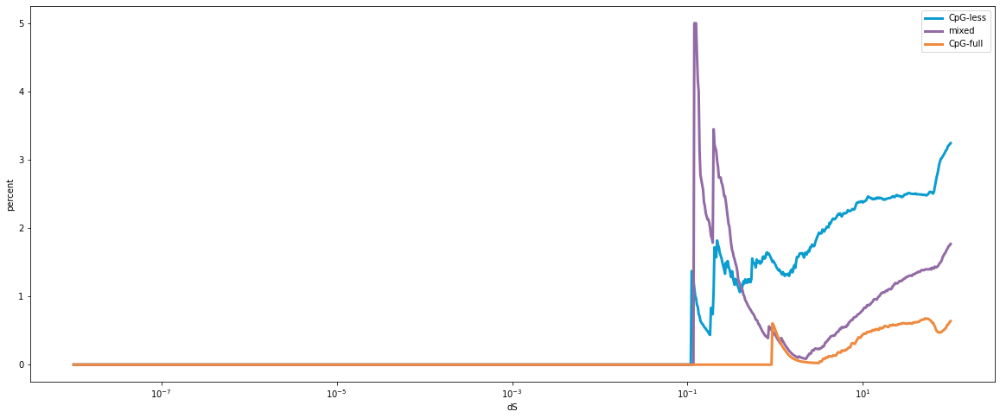

In [142]:
from matplotlib.pyplot import plot
X=np.logspace(-8, 2, 1000)
fig, ax = pyplot.subplots(figsize=(20, 8))
ax.set_xscale('log')
pyplot.xlabel('dS')
pyplot.ylabel('percent')
plot(X, [100*export[(export['dS']<x)&(export['Similarity']<80)&(export['RevSim']<80)&(export["CpG-ness"]==0)]['NEO2'].sum()/((export['dS']<x)&(export['Similarity']<80)&(export['RevSim']<80)&(export["CpG-ness"]==0)).sum() for x in X], color='#0B9DCF', linewidth='3')
plot(X, [100*export[(export['dS']<x)&(export['Similarity']<80)&(export['RevSim']<80)&(export["CpG-ness"]==1)]['NEO2'].sum()/((export['dS']<x)&(export['Similarity']<80)&(export['RevSim']<80)&(export["CpG-ness"]==1)).sum() for x in X], color='#926AA5', linewidth='3')
plot(X, [100*export[(export['dS']<x)&(export['Similarity']<80)&(export['RevSim']<80)&(export["CpG-ness"]==2)]['NEO2'].sum()/((export['dS']<x)&(export['Similarity']<80)&(export['RevSim']<80)&(export["CpG-ness"]==2)).sum() for x in X], color='#EF893D', linewidth='3')
#plot(X, [100*export[export['dS']<x]['NEO'].sum()/(export['dS']<x).sum() for x in X])
ax.legend(['CpG-less', 'mixed', 'CpG-full'])
plt.savefig('human-neo2-ds-cumulative-from-group.pdf', dpi=600)


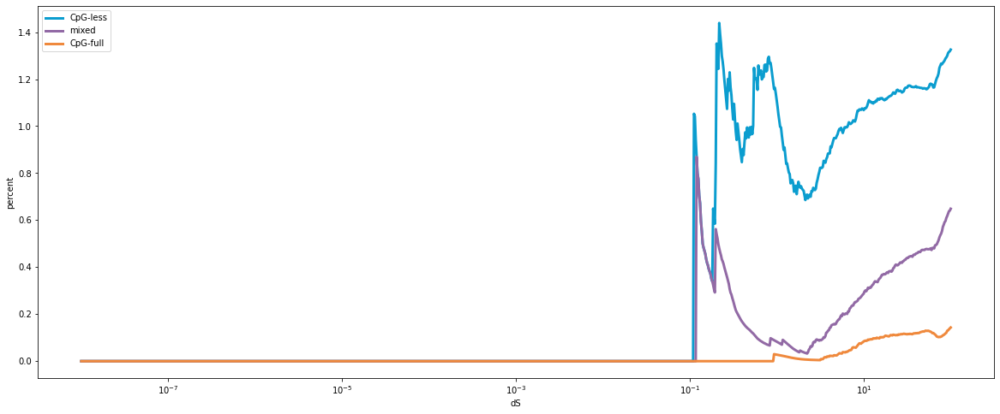

In [143]:
X=np.logspace(-8, 2, 1000)
fig, ax = pyplot.subplots(figsize=(20, 8))
ax.set_xscale('log')
pyplot.xlabel('dS')
pyplot.ylabel('percent')
plot(X, [100*export[(export['dS']<x)&(export['Similarity']<80)&(export['RevSim']<80)&(export["CpG-ness"]==0)]['NEO2'].sum()/((export['dS']<x)&(export['Similarity']<80)&(export['RevSim']<80)).sum() for x in X], color='#0B9DCF', linewidth='3')
plot(X, [100*export[(export['dS']<x)&(export['Similarity']<80)&(export['RevSim']<80)&(export["CpG-ness"]==1)]['NEO2'].sum()/((export['dS']<x)&(export['Similarity']<80)&(export['RevSim']<80)).sum() for x in X], color='#926AA5', linewidth='3')
plot(X, [100*export[(export['dS']<x)&(export['Similarity']<80)&(export['RevSim']<80)&(export["CpG-ness"]==2)]['NEO2'].sum()/((export['dS']<x)&(export['Similarity']<80)&(export['RevSim']<80)).sum() for x in X], color='#EF893D', linewidth='3')
#plot(X, [100*export[export['dS']<x]['NEO'].sum()/(export['dS']<x).sum() for x in X])
ax.legend(['CpG-less', 'mixed', 'CpG-full'])
plt.savefig('human-neo2-ds-cumulative-from-all.pdf', dpi=600)

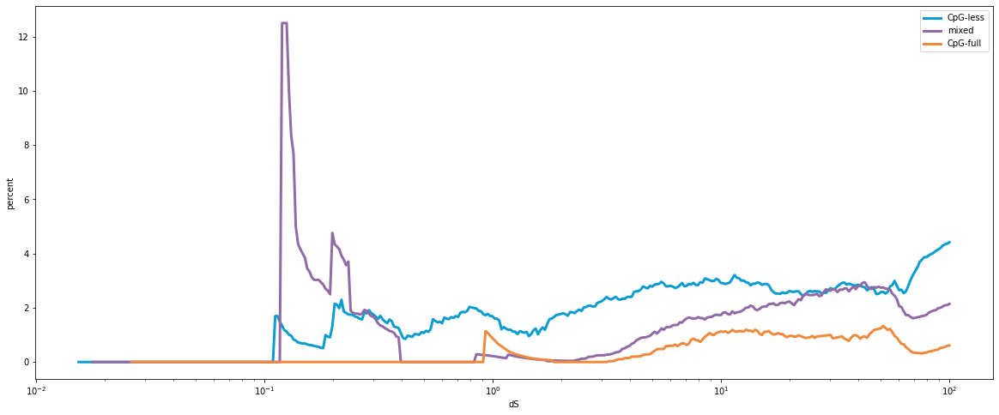

In [144]:
X=np.logspace(-8, 2, 1000)
fig, ax = pyplot.subplots(figsize=(20, 8))
ax.set_xscale('log')
pyplot.xlabel('dS')
pyplot.ylabel('percent')
def expDsBin(x, cpgness):
    return (export['dS']>=x/2)&(export['dS']<x)&(export['Similarity']<80)&(export['RevSim']<80)&(export["CpG-ness"]==cpgness)
pyplot.plot([x for x in X if expDsBin(x, 0).sum()>0], [100*export[expDsBin(x,0)]['NEO2'].sum()/expDsBin(x,0).sum() for x in X if expDsBin(x, 0).sum()>0], color='#0B9DCF', linewidth='3')
pyplot.plot([x for x in X if expDsBin(x, 1).sum()>0], [100*export[expDsBin(x,1)]['NEO2'].sum()/expDsBin(x,1).sum() for x in X if expDsBin(x, 1).sum()>0], color='#926AA5', linewidth='3')
pyplot.plot([x for x in X if expDsBin(x, 2).sum()>0], [100*export[expDsBin(x,2)]['NEO2'].sum()/expDsBin(x,2).sum() for x in X if expDsBin(x, 2).sum()>0], color='#EF893D', linewidth='3')
#plot(X, [100*export[export['dS']<x]['NEO'].sum()/(export['dS']<x).sum() for x in X])
ax.legend(['CpG-less', 'mixed', 'CpG-full'])
plt.savefig('human-neo2-ds-window-from-group.pdf', dpi=600)

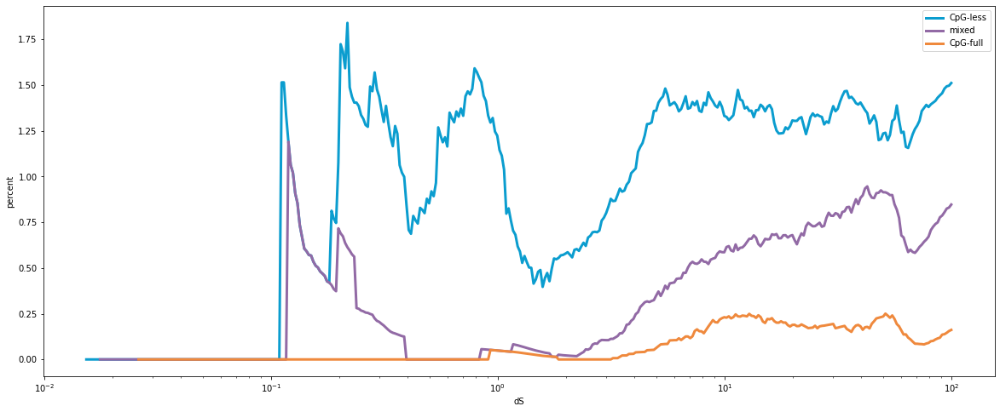

In [145]:
X=np.logspace(-8, 2, 1000)
fig, ax = pyplot.subplots(figsize=(20, 8))
ax.set_xscale('log')
pyplot.xlabel('dS')
pyplot.ylabel('percent')
def expDsBin(x, cpgness=None):
    if cpgness is None:
        return (export['dS']>=x/2)&(export['dS']<x)&(export['Similarity']<80)&(export['RevSim']<80)
    else:
        return (export['dS']>=x/2)&(export['dS']<x)&(export['Similarity']<80)&(export['RevSim']<80)&(export["CpG-ness"]==cpgness)
pyplot.plot([x for x in X if expDsBin(x, 0).sum()>0], [100*export[expDsBin(x,0)]['NEO2'].sum()/expDsBin(x).sum() for x in X if expDsBin(x, 0).sum()>0], color='#0B9DCF', linewidth='3')
pyplot.plot([x for x in X if expDsBin(x, 1).sum()>0], [100*export[expDsBin(x,1)]['NEO2'].sum()/expDsBin(x).sum() for x in X if expDsBin(x, 1).sum()>0], color='#926AA5', linewidth='3')
pyplot.plot([x for x in X if expDsBin(x, 2).sum()>0], [100*export[expDsBin(x,2)]['NEO2'].sum()/expDsBin(x).sum() for x in X if expDsBin(x, 2).sum()>0], color='#EF893D', linewidth='3')
#plot(X, [100*export[export['dS']<x]['NEO'].sum()/(export['dS']<x).sum() for x in X])
ax.legend(['CpG-less', 'mixed', 'CpG-full'])
plt.savefig('human-neo2-ds-window-from-all.pdf', dpi=600)

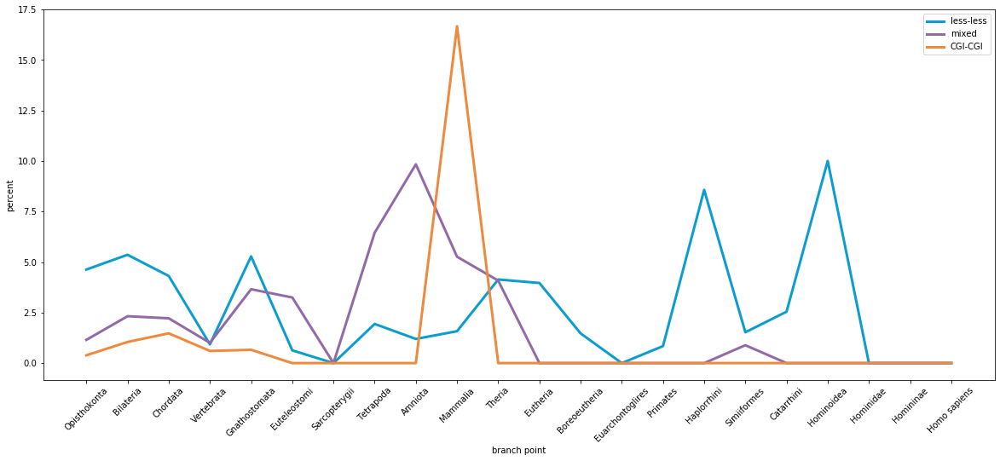

In [19]:
X=branch_order[::1]
fig, ax = pyplot.subplots(figsize=(20, 8))
pyplot.xlabel('branch point')
pyplot.ylabel('percent')
pyplot.xticks(rotation=45)
def expBpBin(b, cpgness):
    return (export['Branch point']==b)&(export['Similarity']<80)&(export['RevSim']<80)&(export["CpG-ness"]==cpgness)
plot([b for b in X if expBpBin(b,0).sum() > 0], [100*export[expBpBin(b,0)]['NEO2'].sum()/expBpBin(b,0).sum() for b in X if expBpBin(b,0).sum() > 0], color='#0B9DCF', linewidth='3')
plot([b for b in X if expBpBin(b,1).sum() > 0], [100*export[expBpBin(b,1)]['NEO2'].sum()/expBpBin(b,1).sum() for b in X if expBpBin(b,1).sum() > 0], color='#926AA5', linewidth='3')
plot([b for b in X if expBpBin(b,2).sum() > 0], [100*export[expBpBin(b,2)]['NEO2'].sum()/expBpBin(b,2).sum() for b in X if expBpBin(b,2).sum() > 0], color='#EF893D', linewidth='3')
#plot(X, [100*export[export['dS']<x]['NEO'].sum()/(export['dS']<x).sum() for x in X])
ax.legend(['less-less', 'mixed', 'CGI-CGI'])
plt.savefig('human-neo2-bp-bin-from-group.pdf', dpi=600)

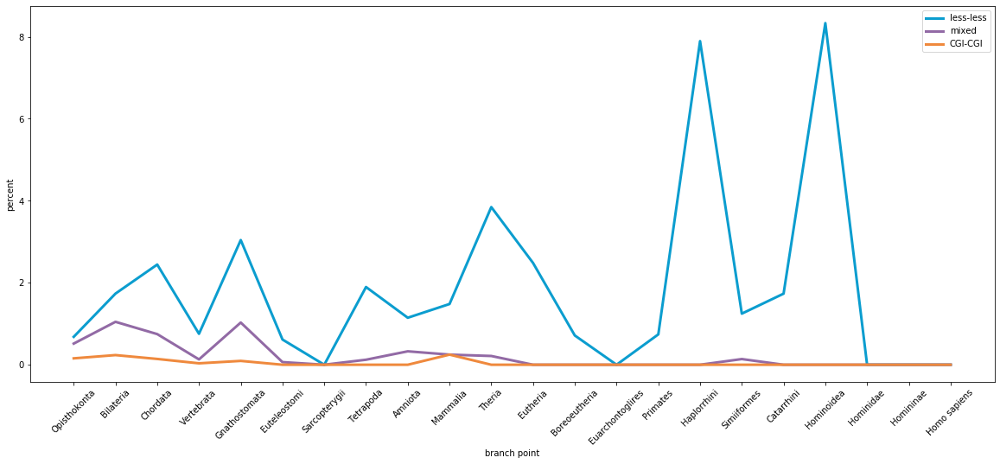

In [20]:
X=branch_order[::1]
fig, ax = pyplot.subplots(figsize=(20, 8))
pyplot.xlabel('branch point')
pyplot.ylabel('percent')
pyplot.xticks(rotation=45)
def expBpBin(b, cpgness=None):
    if cpgness is None:
        return (export['Branch point']==b)&(export['Similarity']<80)&(export['RevSim']<80)
    else:
        return (export['Branch point']==b)&(export['Similarity']<80)&(export['RevSim']<80)&(export["CpG-ness"]==cpgness)
plot([b for b in X if expBpBin(b).sum() > 0], [100*export[expBpBin(b,0)]['NEO2'].sum()/expBpBin(b).sum() for b in X if expBpBin(b).sum() > 0], color='#0B9DCF', linewidth='3')
plot([b for b in X if expBpBin(b).sum() > 0], [100*export[expBpBin(b,1)]['NEO2'].sum()/expBpBin(b).sum() for b in X if expBpBin(b).sum() > 0], color='#926AA5', linewidth='3')
plot([b for b in X if expBpBin(b).sum() > 0], [100*export[expBpBin(b,2)]['NEO2'].sum()/expBpBin(b).sum() for b in X if expBpBin(b).sum() > 0], color='#EF893D', linewidth='3')
#plot(X, [100*export[export['dS']<x]['NEO'].sum()/(export['dS']<x).sum() for x in X])
ax.legend(['less-less', 'mixed', 'CGI-CGI'])
plt.savefig('human-neo2-bp-bin-from-all.pdf', dpi=600)

Repeat without the smaller groups:

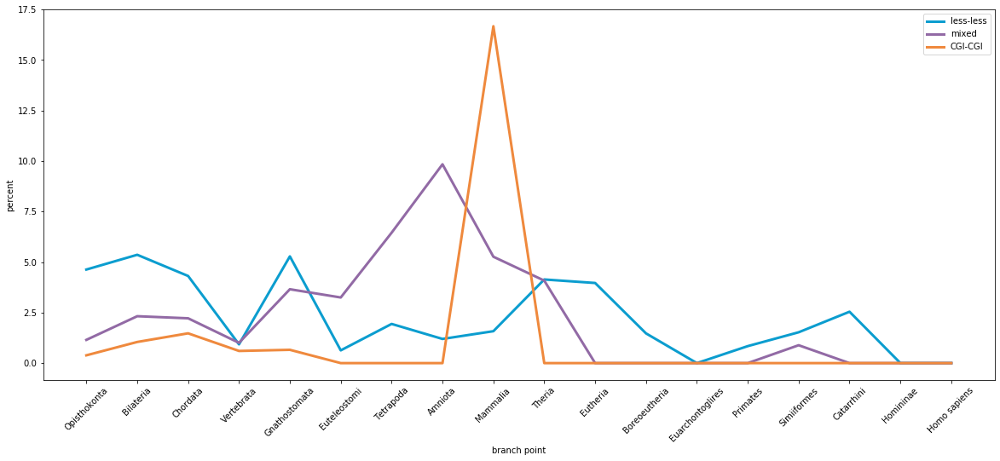

In [21]:
X=list(filter(lambda x: not x in ['Sarcopterygii','Haplorrhini', 'Hominoidea', 'Hominidae'], branch_order[::1]))
fig, ax = pyplot.subplots(figsize=(20, 8))
pyplot.xlabel('branch point')
pyplot.ylabel('percent')
pyplot.xticks(rotation=45)
def expBpBin(b, cpgness):
    return (export['Branch point']==b)&(export['Similarity']<80)&(export['RevSim']<80)&(export["CpG-ness"]==cpgness)
plot([b for b in X if expBpBin(b,0).sum() > 0], [100*export[expBpBin(b,0)]['NEO2'].sum()/expBpBin(b,0).sum() for b in X if expBpBin(b,0).sum() > 0], color='#0B9DCF', linewidth='3')
plot([b for b in X if expBpBin(b,1).sum() > 0], [100*export[expBpBin(b,1)]['NEO2'].sum()/expBpBin(b,1).sum() for b in X if expBpBin(b,1).sum() > 0], color='#926AA5', linewidth='3')
plot([b for b in X if expBpBin(b,2).sum() > 0], [100*export[expBpBin(b,2)]['NEO2'].sum()/expBpBin(b,2).sum() for b in X if expBpBin(b,2).sum() > 0], color='#EF893D', linewidth='3')
#plot(X, [100*export[export['dS']<x]['NEO'].sum()/(export['dS']<x).sum() for x in X])
ax.legend(['less-less', 'mixed', 'CGI-CGI'])
plt.savefig('human-neo2-bp-bin-from-group-no-small-groups.pdf', dpi=600)

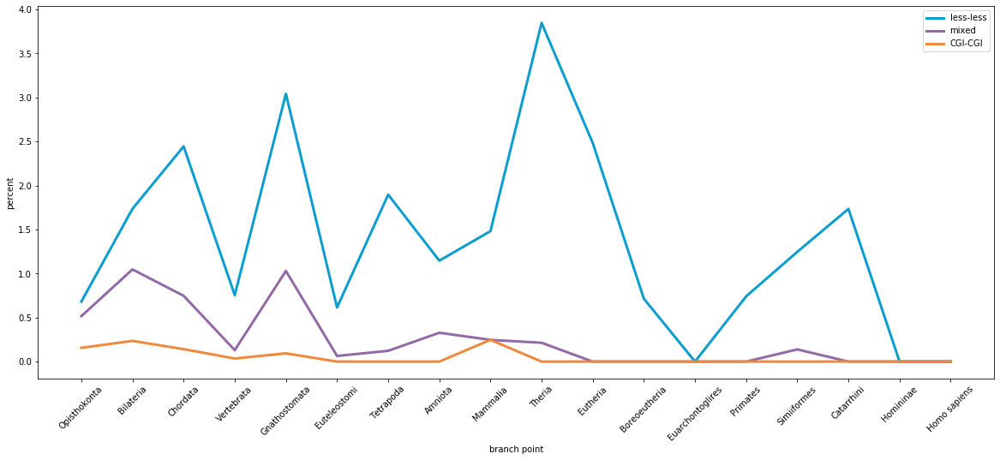

In [22]:
X=list(filter(lambda x: not x in ['Sarcopterygii','Haplorrhini', 'Hominoidea', 'Hominidae'], branch_order[::1]))
fig, ax = pyplot.subplots(figsize=(20, 8))
pyplot.xlabel('branch point')
pyplot.ylabel('percent')
pyplot.xticks(rotation=45)
def expBpBin(b, cpgness=None):
    if cpgness is None:
        return (export['Branch point']==b)&(export['Similarity']<80)&(export['RevSim']<80)
    else:
        return (export['Branch point']==b)&(export['Similarity']<80)&(export['RevSim']<80)&(export["CpG-ness"]==cpgness)
plot([b for b in X if expBpBin(b).sum() > 0], [100*export[expBpBin(b,0)]['NEO2'].sum()/expBpBin(b).sum() for b in X if expBpBin(b).sum() > 0], color='#0B9DCF', linewidth='3')
plot([b for b in X if expBpBin(b).sum() > 0], [100*export[expBpBin(b,1)]['NEO2'].sum()/expBpBin(b).sum() for b in X if expBpBin(b).sum() > 0], color='#926AA5', linewidth='3')
plot([b for b in X if expBpBin(b).sum() > 0], [100*export[expBpBin(b,2)]['NEO2'].sum()/expBpBin(b).sum() for b in X if expBpBin(b).sum() > 0], color='#EF893D', linewidth='3')
#plot(X, [100*export[export['dS']<x]['NEO'].sum()/(export['dS']<x).sum() for x in X])
ax.legend(['less-less', 'mixed', 'CGI-CGI'])
plt.savefig('human-neo2-bp-bin-from-all-no-small-groups.pdf', dpi=600)

And now cumulative by branch:

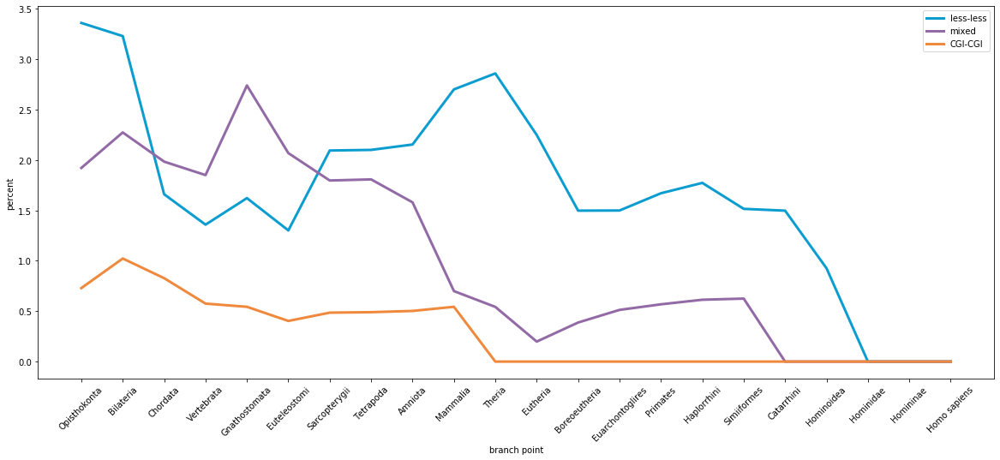

In [23]:
X=branch_order[::1]
fig, ax = pyplot.subplots(figsize=(20, 8))
pyplot.xlabel('branch point')
pyplot.ylabel('percent')
pyplot.xticks(rotation=45)
def expBpBinCum(b, cpgness):
    return (export['Branch point'].isin(X[X.index(b):]))&(export['Similarity']<80)&(export['RevSim']<80)&(export["CpG-ness"]==cpgness)
plot([b for b in X if expBpBinCum(b,0).sum() > 0], [100*export[expBpBinCum(b,0)]['NEO2'].sum()/expBpBinCum(b,0).sum() for b in X if expBpBinCum(b,0).sum() > 0], color='#0B9DCF', linewidth='3')
plot([b for b in X if expBpBinCum(b,1).sum() > 0], [100*export[expBpBinCum(b,1)]['NEO2'].sum()/expBpBinCum(b,1).sum() for b in X if expBpBinCum(b,1).sum() > 0], color='#926AA5', linewidth='3')
plot([b for b in X if expBpBinCum(b,2).sum() > 0], [100*export[expBpBinCum(b,2)]['NEO2'].sum()/expBpBinCum(b,2).sum() for b in X if expBpBinCum(b,2).sum() > 0], color='#EF893D', linewidth='3')
#plot(X, [100*export[export['dS']<x]['NEO'].sum()/(export['dS']<x).sum() for x in X])
ax.legend(['less-less', 'mixed', 'CGI-CGI'])
plt.savefig('human-neo2-bp-bin-from-group-cumulative-new-to-old.pdf', dpi=600)

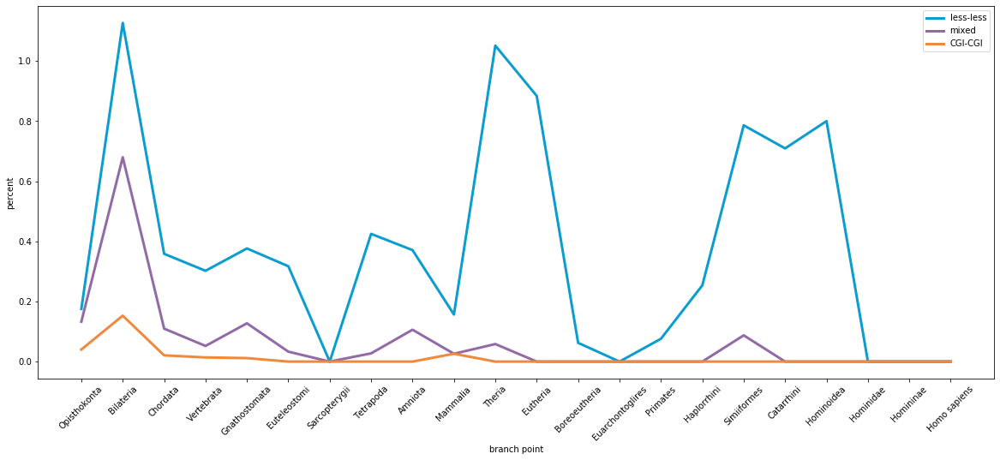

In [24]:
X=branch_order[::1]
fig, ax = pyplot.subplots(figsize=(20, 8))
pyplot.xlabel('branch point')
pyplot.ylabel('percent')
pyplot.xticks(rotation=45)
def expBpBinCum(b, cpgness=None):
    if cpgness is None:
        return (export['Branch point'].isin(X[X.index(b):]))&(export['Similarity']<80)&(export['RevSim']<80)
    else:
        return (export['Branch point'].isin(X[X.index(b):]))&(export['Similarity']<80)&(export['RevSim']<80)&(export["CpG-ness"]==cpgness)
plot([b for b in X if expBpBinCum(b).sum() > 0], [100*export[expBpBin(b,0)]['NEO2'].sum()/expBpBinCum(b).sum() for b in X if expBpBinCum(b).sum() > 0], color='#0B9DCF', linewidth='3')
plot([b for b in X if expBpBinCum(b).sum() > 0], [100*export[expBpBin(b,1)]['NEO2'].sum()/expBpBinCum(b).sum() for b in X if expBpBinCum(b).sum() > 0], color='#926AA5', linewidth='3')
plot([b for b in X if expBpBinCum(b).sum() > 0], [100*export[expBpBin(b,2)]['NEO2'].sum()/expBpBinCum(b).sum() for b in X if expBpBinCum(b).sum() > 0], color='#EF893D', linewidth='3')
#plot(X, [100*export[export['dS']<x]['NEO'].sum()/(export['dS']<x).sum() for x in X])
ax.legend(['less-less', 'mixed', 'CGI-CGI'])
plt.savefig('human-neo2-bp-bin-from-all-cumulative-new-to-old.pdf', dpi=600)

And now cumulative Opisthokonta first by branch:

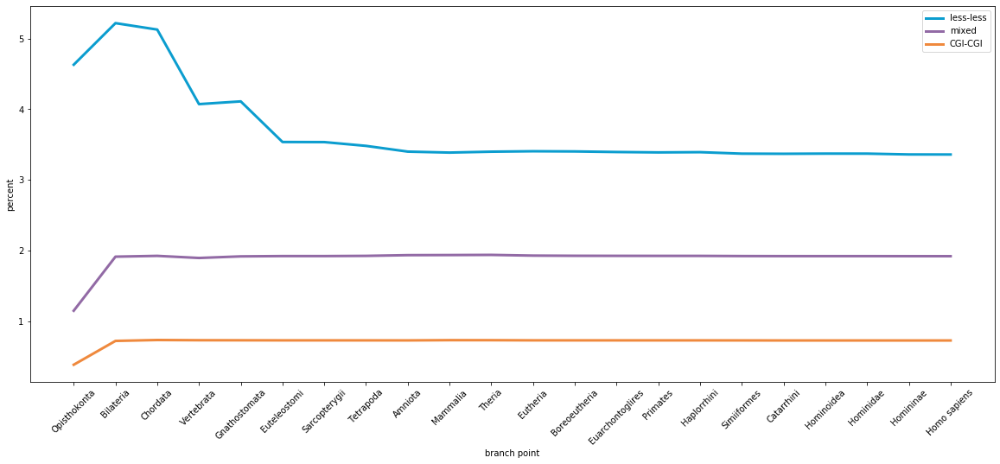

In [25]:
X=branch_order[::1]
fig, ax = pyplot.subplots(figsize=(20, 8))
pyplot.xlabel('branch point')
pyplot.ylabel('percent')
pyplot.xticks(rotation=45)
def expBpBinCum(b, cpgness):
    return (export['Branch point'].isin(X[:X.index(b)+1]))&(export['Similarity']<80)&(export['RevSim']<80)&(export["CpG-ness"]==cpgness)
plot([b for b in X if expBpBinCum(b,0).sum() > 0], [100*export[expBpBinCum(b,0)]['NEO2'].sum()/expBpBinCum(b,0).sum() for b in X if expBpBinCum(b,0).sum() > 0], color='#0B9DCF', linewidth='3')
plot([b for b in X if expBpBinCum(b,1).sum() > 0], [100*export[expBpBinCum(b,1)]['NEO2'].sum()/expBpBinCum(b,1).sum() for b in X if expBpBinCum(b,1).sum() > 0], color='#926AA5', linewidth='3')
plot([b for b in X if expBpBinCum(b,2).sum() > 0], [100*export[expBpBinCum(b,2)]['NEO2'].sum()/expBpBinCum(b,2).sum() for b in X if expBpBinCum(b,2).sum() > 0], color='#EF893D', linewidth='3')
#plot(X, [100*export[export['dS']<x]['NEO'].sum()/(export['dS']<x).sum() for x in X])
ax.legend(['less-less', 'mixed', 'CGI-CGI'])
plt.savefig('human-neo2-bp-bin-from-group-cumulative-old-to-new.pdf', dpi=600)

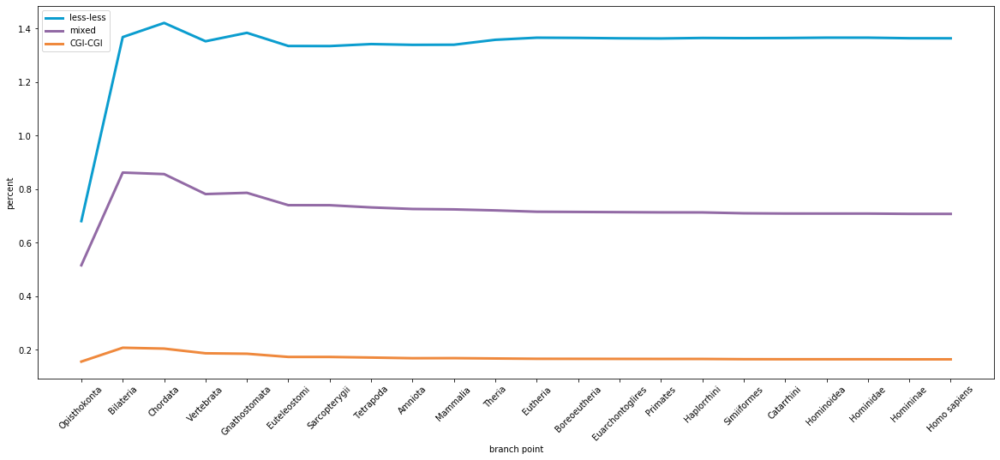

In [26]:
X=branch_order[::1]
fig, ax = pyplot.subplots(figsize=(20, 8))
pyplot.xlabel('branch point')
pyplot.ylabel('percent')
pyplot.xticks(rotation=45)
def expBpBinCum(b, cpgness=None):
    if cpgness is None:
        return (export['Branch point'].isin(X[:X.index(b)+1]))&(export['Similarity']<80)&(export['RevSim']<80)
    else:
        return (export['Branch point'].isin(X[:X.index(b)+1]))&(export['Similarity']<80)&(export['RevSim']<80)&(export["CpG-ness"]==cpgness)
plot([b for b in X if expBpBinCum(b).sum() > 0], [100*export[expBpBinCum(b,0)]['NEO2'].sum()/expBpBinCum(b).sum() for b in X if expBpBinCum(b).sum() > 0], color='#0B9DCF', linewidth='3')
plot([b for b in X if expBpBinCum(b).sum() > 0], [100*export[expBpBinCum(b,1)]['NEO2'].sum()/expBpBinCum(b).sum() for b in X if expBpBinCum(b).sum() > 0], color='#926AA5', linewidth='3')
plot([b for b in X if expBpBinCum(b).sum() > 0], [100*export[expBpBinCum(b,2)]['NEO2'].sum()/expBpBinCum(b).sum() for b in X if expBpBinCum(b).sum() > 0], color='#EF893D', linewidth='3')
#plot(X, [100*export[export['dS']<x]['NEO'].sum()/(export['dS']<x).sum() for x in X])
ax.legend(['less-less', 'mixed', 'CGI-CGI'])
plt.savefig('human-neo2-bp-bin-from-all-cumulative-old-to-new.pdf', dpi=600)

In [8]:
from homologs import ortholog_count_by_gene
exp_genes = can_fr.assign(transcript_length=lambda x: [len(v) for v in x.seq]).assign(gene_length=lambda x: [v.end-v.start for v in x.feature]).assign(chrom=lambda x: [v.chrom for v in x.feature]).assign(strand=lambda x: [v.strand for v in x.feature]).\
            assign(tss=lambda x: [v.start if v.strand=='+' else v.end for v in x.feature]).\
            drop(columns=['seq'])
for prom in [ "compara_overlaps_300", "compara_overlaps_500", "compara_overlaps_1000", "compara_overlaps_2000", "ucsc_overlaps_300", "ucsc_overlaps_500", "ucsc_overlaps_1000", "ucsc_overlaps_2000", "hs_elife_overlaps"]:
    ovl = pickle.load(open('%s.pkl'%(prom,), 'rb'))
    exp_genes = exp_genes.assign(**{prom : lambda x: [ovl[k] if k in ovl else None for k in x.index]})
exp_genes=exp_genes.join(ortholog_count_by_gene(canons.keys())).assign(index=lambda x: [v[5:] for v in x.index]).set_index('index').join(genexpr)
exp_genes=exp_genes.join(genentropy.rename('Entropy'))
fam_pvalues = {'gene:'+v.split()[0]:float(v.split()[1]) for v in open('human-genes-p-value.txt').readlines()}
exp_genes=exp_genes.assign(gain_and_loss_pval=lambda x: [fam_pvalues['gene:'+p]  if 'gene:'+p in fam_pvalues else None for p in x.index])
exp_genes.drop(columns=['feature']).to_csv('human-genes.csv')


In [154]:
#import homologs
#importlib.reload(homologs)
from homologs import write_paralog_sets
write_paralog_sets(export, 'human-paralog-classes.txt')

<Figure size 432x288 with 0 Axes>

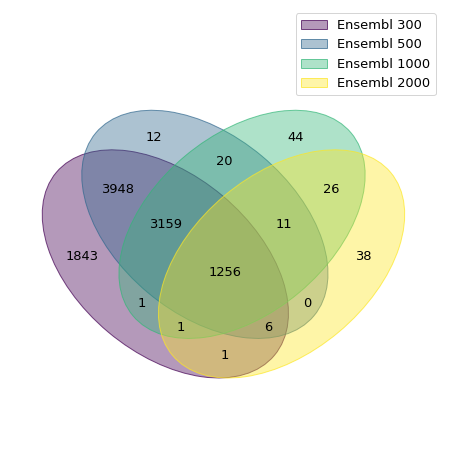

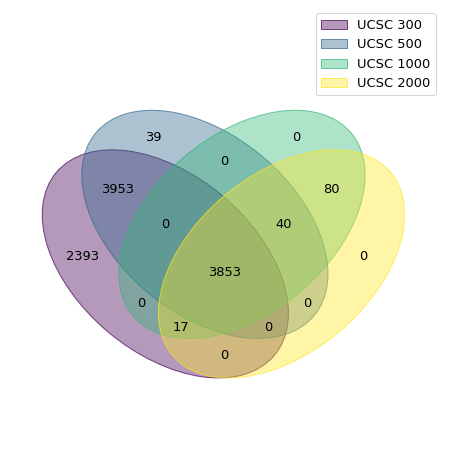

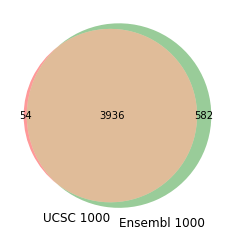

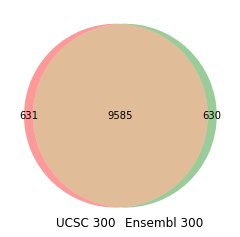

In [17]:

from venn import *
from matplotlib_venn import *
fig = plt.figure()
venn({ "Ensembl 300" : set(exp_genes[exp_genes["compara_overlaps_300"]>=0.5].index),
       "Ensembl 500" : set(exp_genes[exp_genes["compara_overlaps_500"]>=0.5].index),
       "Ensembl 1000" : set(exp_genes[exp_genes["compara_overlaps_1000"]>=0.5].index),
       "Ensembl 2000" : set(exp_genes[exp_genes["compara_overlaps_2000"]>=0.5].index) })
plt.savefig('compara-diff-prom-len-venn.pdf', dpi=600)

venn({ "UCSC 300" : set(exp_genes[exp_genes["ucsc_overlaps_300"]>=0.5].index),
       "UCSC 500" : set(exp_genes[exp_genes["ucsc_overlaps_500"]>=0.5].index),
       "UCSC 1000" : set(exp_genes[exp_genes["ucsc_overlaps_1000"]>=0.5].index),
       "UCSC 2000" : set(exp_genes[exp_genes["ucsc_overlaps_1000"]>=0.5].index) })

show()
fig = plt.figure()
venn2([set(exp_genes[exp_genes["ucsc_overlaps_1000"]>=0.5].index),
       set(exp_genes[exp_genes["compara_overlaps_1000"]>=0.5].index)],
     ("UCSC 1000", "Ensembl 1000"))
fig.savefig('ucsc-compara-1000.pdf', dpi=600)
show()
fig = plt.figure()
venn2([set(exp_genes[exp_genes["ucsc_overlaps_300"]>=0.5].index),
       set(exp_genes[exp_genes["compara_overlaps_300"]>=0.5].index)],
       ("UCSC 300", "Ensembl 300"))
plt.savefig('ucsc-compara-human-300.pdf', dpi=600)
show()


from seaborn import scatterplot, regplot
fig, ax = pyplot.subplots(figsize=(15,8))
regplot(ax=ax,data=export[(export['g1']<export['g2'])&(export["CpG-ness"]==2)], x='mut-pct', y='expr_corr_factor',color="#ef893d", label='CpG-full', scatter_kws={'s':4})
regplot(ax=ax,data=export[(export['g1']<export['g2'])&(export["CpG-ness"]==1)], x='mut-pct', y='expr_corr_factor',color="#926aa5", label='mixed', scatter_kws={'s':4})
regplot(ax=ax,data=export[(export['g1']<export['g2'])&(export["CpG-ness"]==0)], x='mut-pct', y='expr_corr_factor',color="#0b9dcf", label='CpG-less', scatter_kws={'s':4}, line_kws={'color':'#000070'})
#scatterplot(ax=ax,data=export[export['g1']<export['g2']], x='mut-pct', y='expr_corr_factor', hue="CpG-ness", palette=["blue", "green", "red"])

<AxesSubplot:xlabel='mutual', ylabel='expr_corr_factor'>

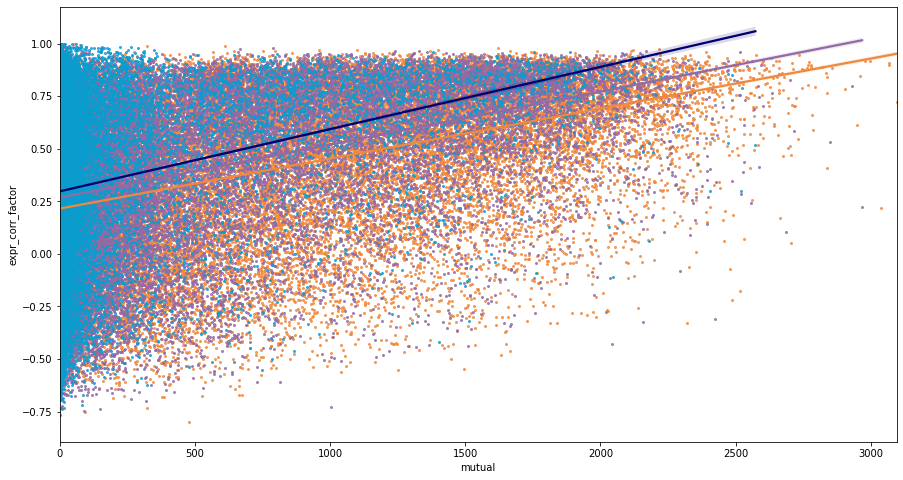

In [126]:
from seaborn import scatterplot, regplot
fig, ax = pyplot.subplots(figsize=(15,8))
regplot(ax=ax,data=export[(export['g1']<export['g2'])&(export["CpG-ness"]==2)], x='mutual', y='expr_corr_factor',color="#ef893d", label='CpG-full', scatter_kws={'s':4})
regplot(ax=ax,data=export[(export['g1']<export['g2'])&(export["CpG-ness"]==1)], x='mutual', y='expr_corr_factor',color="#926aa5", label='mixed', scatter_kws={'s':4})
regplot(ax=ax,data=export[(export['g1']<export['g2'])&(export["CpG-ness"]==0)], x='mutual', y='expr_corr_factor',color="#0b9dcf", label='CpG-less', scatter_kws={'s':4}, line_kws={'color':'#000070'})
#scatterplot(ax=ax,data=export[export['g1']<export['g2']], x='mut-pct', y='expr_corr_factor', hue="CpG-ness", palette=["blue", "green", "red"])

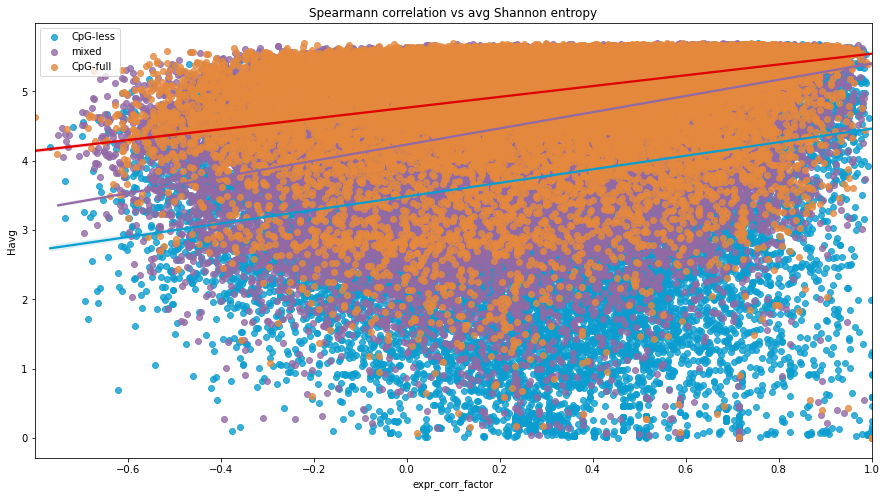

In [127]:
from seaborn import scatterplot, regplot
fig, ax = pyplot.subplots(figsize=(15,8))

#scatterplot(ax=ax,data=export[export['g1']<export['g2']].assign(Havg=lambda x: (x['Entropy-g1']+x['Entropy-g2'])/2), y='Havg', x='expr_corr_factor', hue="CpG-ness", palette=["blue", "green", "red"])
regplot(ax=ax,data=export[(export['g1']<export['g2'])&(export["CpG-ness"]==0)].assign(Havg=lambda x: (x['Entropy-g1']+x['Entropy-g2'])/2), y='Havg', x='expr_corr_factor',color="#0b9dcf", label='CpG-less')
regplot(ax=ax,data=export[(export['g1']<export['g2'])&(export["CpG-ness"]==1)].assign(Havg=lambda x: (x['Entropy-g1']+x['Entropy-g2'])/2), y='Havg', x='expr_corr_factor',color="#926aa5", label='mixed')
regplot(ax=ax,data=export[(export['g1']<export['g2'])&(export["CpG-ness"]==2)].assign(Havg=lambda x: (x['Entropy-g1']+x['Entropy-g2'])/2), y='Havg', x='expr_corr_factor',color="#e5893d", label='CpG-full', line_kws={'color':'#e00000'})
title('Spearmann correlation vs avg Shannon entropy')
ax.legend(loc=2)


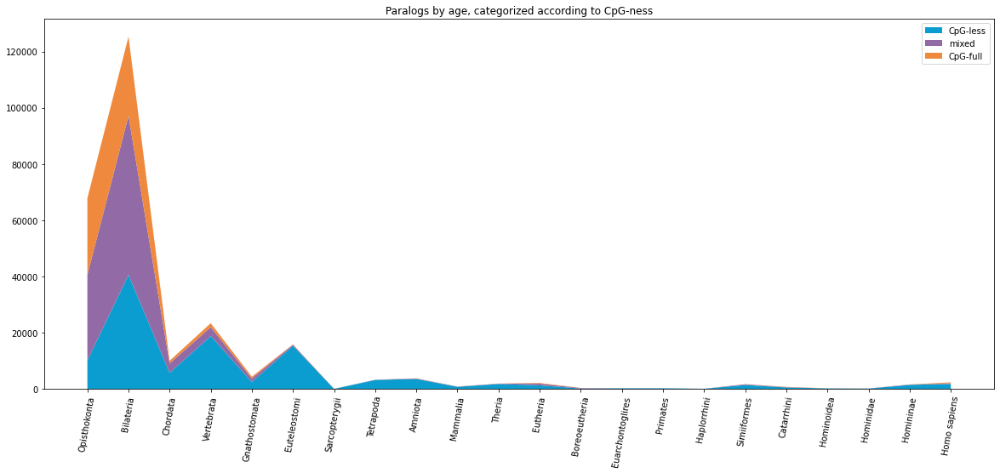

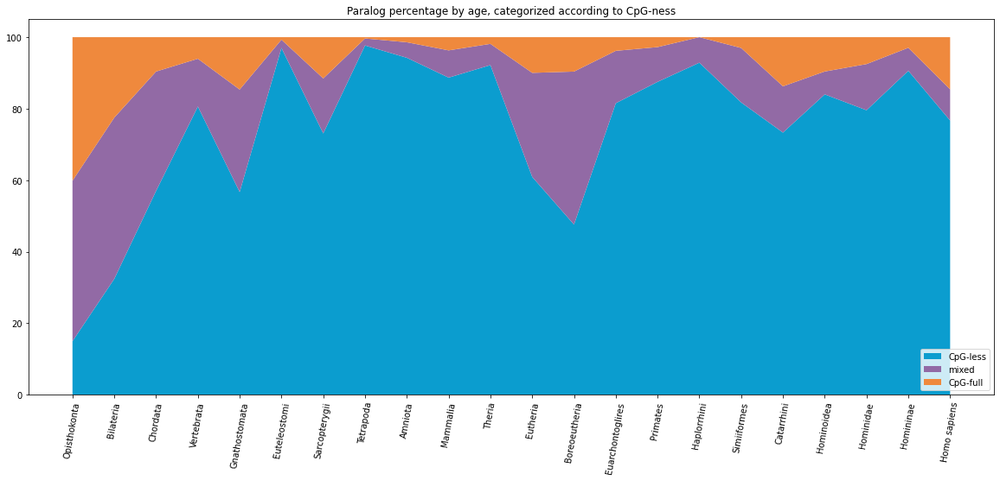

In [154]:
from seaborn import countplot
fig, ax = pyplot.subplots(figsize=(20, 8))
pyplot.xticks(rotation=80)
pyplot.stackplot(branch_order, [((export["CpG-ness"]==0)&(export["Branch point"]==b)).sum() for b in branch_order],
                  [((export["CpG-ness"]==1)&(export["Branch point"]==b)).sum() for b in branch_order],
                  [((export["CpG-ness"]==2)&(export["Branch point"]==b)).sum() for b in branch_order],
                  labels=['CpG-less', 'mixed', 'CpG-full'], colors=['#0b9dcf','#926aa5', '#ef893d'])
pyplot.legend()
pyplot.title('Paralogs by age, categorized according to CpG-ness')
pyplot.savefig('human-shpitzim-age-300bp-abs.pdf', dpi=600)
pyplot.show()
fig, ax = pyplot.subplots(figsize=(20, 8))
pyplot.xticks(rotation=80)
pyplot.stackplot(branch_order, [((export["CpG-ness"]==0)&(export["Branch point"]==b)).sum()/(export["Branch point"]==b).sum()*100 for b in branch_order],
                  [((export["CpG-ness"]==1)&(export["Branch point"]==b)).sum()/(export["Branch point"]==b).sum()*100 for b in branch_order],
                  [((export["CpG-ness"]==2)&(export["Branch point"]==b)).sum()/(export["Branch point"]==b).sum()*100 for b in branch_order],
                  labels=['CpG-less', 'mixed', 'CpG-full'], colors=['#0b9dcf','#926aa5', '#ef893d'])
pyplot.legend(loc=4)
pyplot.title('Paralog percentage by age, categorized according to CpG-ness')
pyplot.savefig('human-shpitzim-age-300bp-pct.pdf', dpi=600)
pyplot.show()

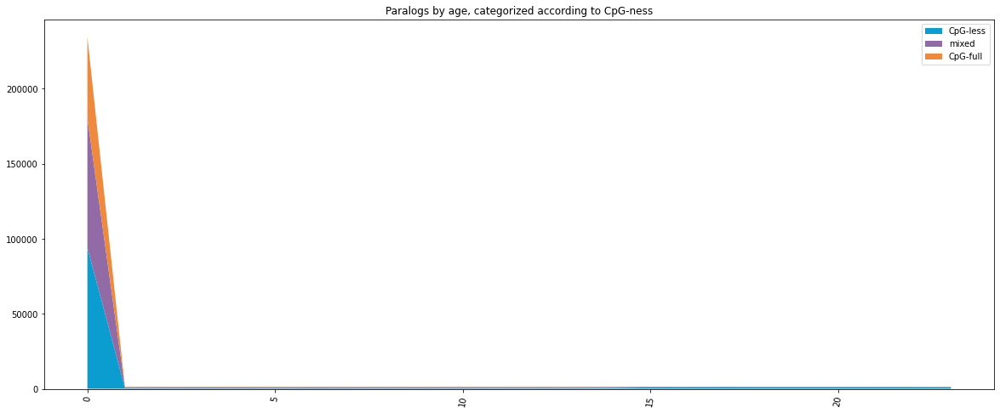

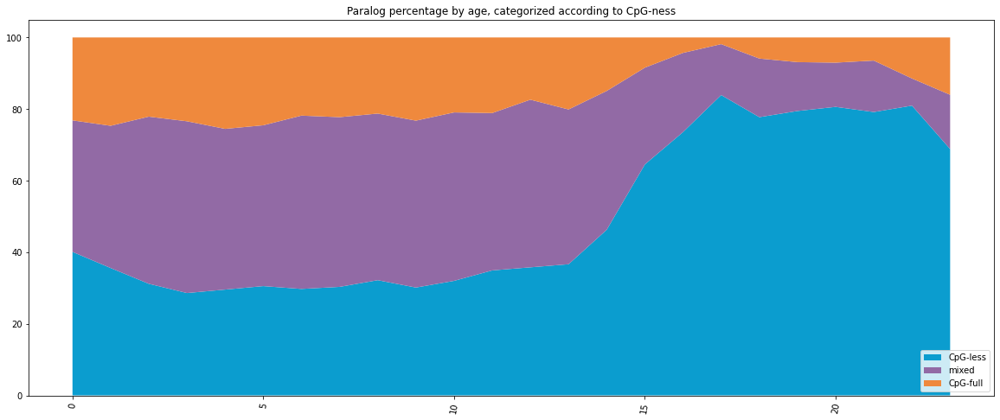

In [155]:
from seaborn import countplot
fig, ax = pyplot.subplots(figsize=(20, 8))
dsrange = range(min(export['dSbin']), max(export['dSbin'])+1)
pyplot.xticks(rotation=80)
pyplot.stackplot(dsrange, [((export["CpG-ness"]==0)&(export["dSbin"]==b)).sum() for b in dsrange],
                  [((export["CpG-ness"]==1)&(export["dSbin"]==b)).sum() for b in dsrange],
                  [((export["CpG-ness"]==2)&(export["dSbin"]==b)).sum() for b in dsrange],
                  labels=['CpG-less', 'mixed', 'CpG-full'], colors=['#0b9dcf','#926aa5', '#ef893d'])
pyplot.legend()
pyplot.title('Paralogs by age, categorized according to CpG-ness')
pyplot.savefig('human-shpitzim-ds-300bp-abs.pdf', dpi=600)
pyplot.show()
fig, ax = pyplot.subplots(figsize=(20, 8))
pyplot.xticks(rotation=80)
pyplot.stackplot(dsrange, [((export["CpG-ness"]==0)&(export["dSbin"]==b)).sum()/(export["dSbin"]==b).sum()*100 for b in dsrange],
                  [((export["CpG-ness"]==1)&(export["dSbin"]==b)).sum()/(export["dSbin"]==b).sum()*100 for b in dsrange],
                  [((export["CpG-ness"]==2)&(export["dSbin"]==b)).sum()/(export["dSbin"]==b).sum()*100 for b in dsrange],
                  labels=['CpG-less', 'mixed', 'CpG-full'], colors=['#0b9dcf','#926aa5', '#ef893d'])
pyplot.legend(loc=4)
pyplot.title('Paralog percentage by age, categorized according to CpG-ness')
pyplot.savefig('human-shpitzim-ds-300bp-pct.pdf', dpi=600)
pyplot.show()

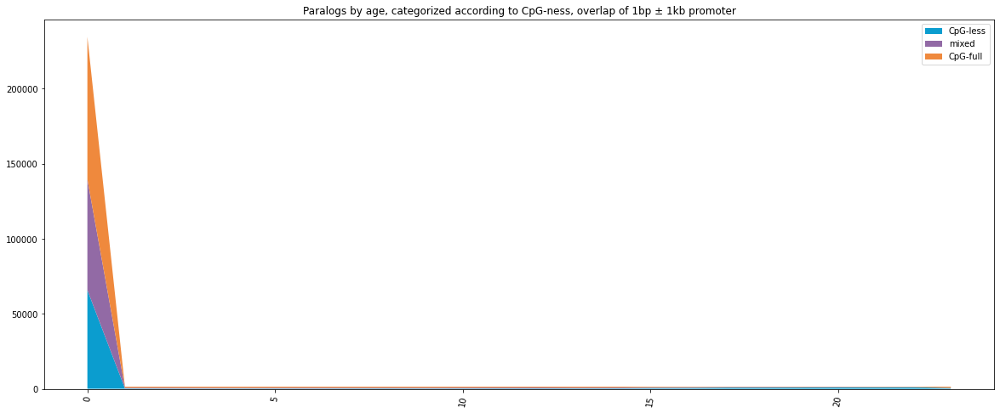

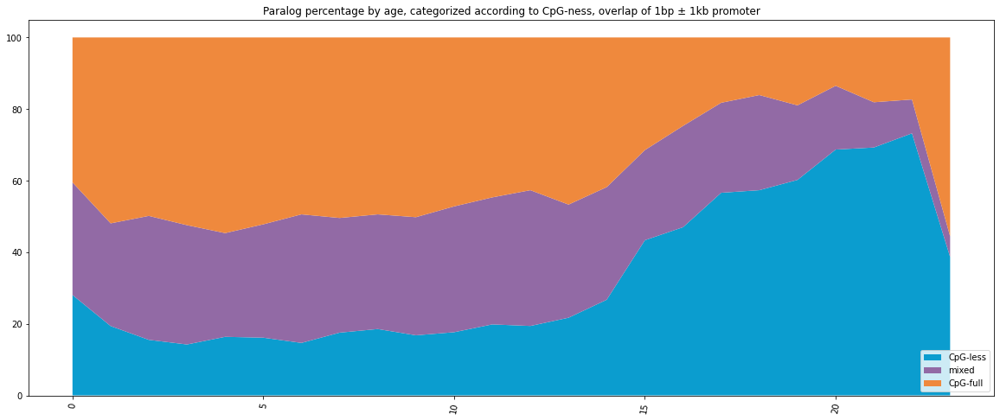

In [156]:
from seaborn import countplot
fig, ax = pyplot.subplots(figsize=(20, 8))
dsrange = range(min(export['dSbin']), max(export['dSbin'])+1)
pyplot.xticks(rotation=80)
pyplot.stackplot(dsrange, [((export["hs_elife_overlaps"]==0)&(export["dSbin"]==b)).sum() for b in dsrange],
                  [((export["hs_elife_overlaps"]==1)&(export["dSbin"]==b)).sum() for b in dsrange],
                  [((export["hs_elife_overlaps"]==2)&(export["dSbin"]==b)).sum() for b in dsrange],
                  labels=['CpG-less', 'mixed', 'CpG-full'], colors=['#0b9dcf','#926aa5', '#ef893d'])
pyplot.legend()
pyplot.title('Paralogs by age, categorized according to CpG-ness, overlap of 1bp ± 1kb promoter')
pyplot.savefig('human-shpitzim-ds-elife-abs.pdf', dpi=600)
pyplot.show()
fig, ax = pyplot.subplots(figsize=(20, 8))
pyplot.xticks(rotation=80)
pyplot.stackplot(dsrange, [((export["hs_elife_overlaps"]==0)&(export["dSbin"]==b)).sum()/(export["dSbin"]==b).sum()*100 for b in dsrange],
                  [((export["hs_elife_overlaps"]==1)&(export["dSbin"]==b)).sum()/(export["dSbin"]==b).sum()*100 for b in dsrange],
                  [((export["hs_elife_overlaps"]==2)&(export["dSbin"]==b)).sum()/(export["dSbin"]==b).sum()*100 for b in dsrange],
                  labels=['CpG-less', 'mixed', 'CpG-full'], colors=['#0b9dcf','#926aa5', '#ef893d'])
pyplot.legend(loc=4)
pyplot.title('Paralog percentage by age, categorized according to CpG-ness, overlap of 1bp ± 1kb promoter')
pyplot.savefig('human-shpitzim-ds-elife-pct.pdf', dpi=600)
pyplot.show()

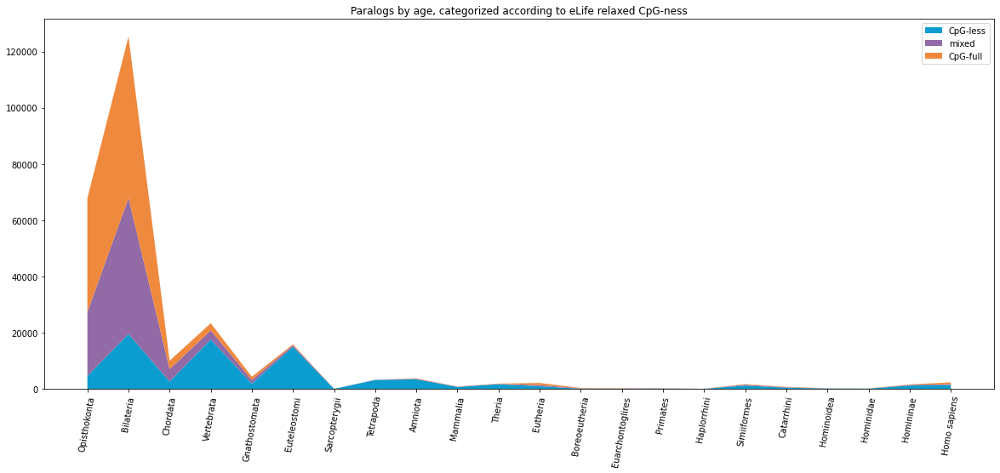

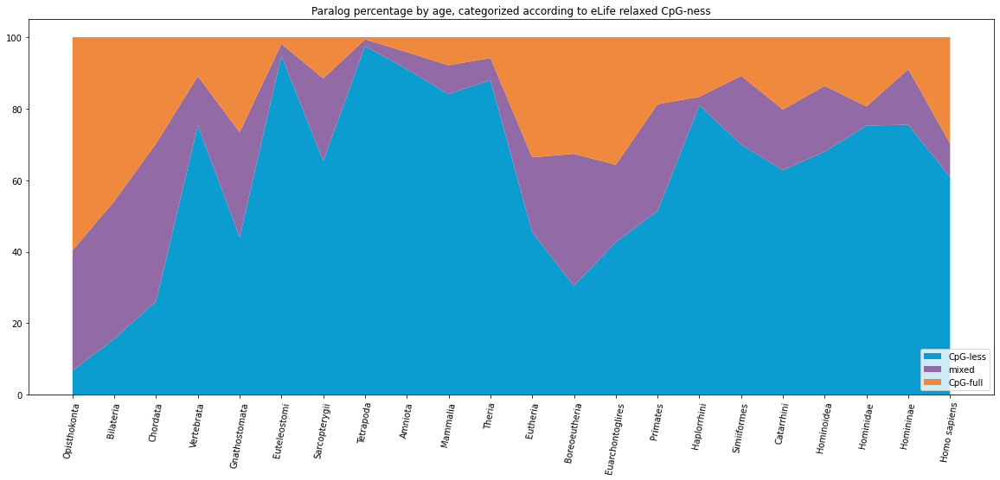

In [157]:
from seaborn import countplot
fig, ax = pyplot.subplots(figsize=(20, 8))
pyplot.xticks(rotation=80)
pyplot.stackplot(branch_order, [((export["hs_elife_overlaps"]==0)&(export["Branch point"]==b)).sum() for b in branch_order],
                  [((export["hs_elife_overlaps"]==1)&(export["Branch point"]==b)).sum() for b in branch_order],
                  [((export["hs_elife_overlaps"]==2)&(export["Branch point"]==b)).sum() for b in branch_order],
                  labels=['CpG-less', 'mixed', 'CpG-full'], colors=['#0b9dcf','#926aa5', '#ef893d'])
pyplot.legend()
pyplot.title('Paralogs by age, categorized according to eLife relaxed CpG-ness')
pyplot.savefig('human-shpitzim-age-elife-abs.pdf', dpi=600)
pyplot.show()
fig, ax = pyplot.subplots(figsize=(20, 8))
pyplot.xticks(rotation=80)
pyplot.stackplot(branch_order, [((export["hs_elife_overlaps"]==0)&(export["Branch point"]==b)).sum()/(export["Branch point"]==b).sum()*100 for b in branch_order],
                  [((export["hs_elife_overlaps"]==1)&(export["Branch point"]==b)).sum()/(export["Branch point"]==b).sum()*100 for b in branch_order],
                  [((export["hs_elife_overlaps"]==2)&(export["Branch point"]==b)).sum()/(export["Branch point"]==b).sum()*100 for b in branch_order],
                  labels=['CpG-less', 'mixed', 'CpG-full'], colors=['#0b9dcf','#926aa5', '#ef893d'])
pyplot.legend(loc=4)
pyplot.title('Paralog percentage by age, categorized according to eLife relaxed CpG-ness')
pyplot.savefig('human-shpitzim-age-elife-pct.pdf', dpi=600)
pyplot.show()

In [171]:
import random
r=random.Random(972)
tests=100000
pop=list(export[export['g1']<export['g2']]['Branch point'])
cpgfulls=((export['CpG-ness']==2)&(export['g1']<export['g2'])).sum()
ourseq=[((export["CpG-ness"]==2)&(export['g1']<export['g2'])&(export["Branch point"]==b)).sum() for b in branch_order]
outliers=0
for t in range(0,tests):
    perm=r.sample(pop, cpgfulls)
    permseq=[sum([p==b for p in perm]) for b in branch_order]
    if min((x[0]-x[1] for x in zip(itertools.accumulate(ourseq), itertools.accumulate(permseq)))) < 0:
        outliers += 1
    


In [172]:
#((export['CpG-ness']==2)&(export['g1']<export['g2'])).sum()
#[x[0]-x[1] for x in zip(itertools.accumulate(ourseq), itertools.accumulate(permseq))]
outliers

0

In [173]:
import random
r=random.Random(972)
tests=100000
pop=list(export[export['g1']<export['g2']]['dSbin'])
cpgfulls=((export['CpG-ness']==2)&(export['g1']<export['g2'])).sum()
ourseq=[((export["CpG-ness"]==2)&(export['g1']<export['g2'])&(export["dSbin"]==b)).sum() for b in dsrange]
outliers=0
for t in range(0,tests):
    perm=r.sample(pop, cpgfulls)
    permseq=[sum([p==b for p in perm]) for b in dsrange]
    if min((x[0]-x[1] for x in zip(itertools.accumulate(ourseq), itertools.accumulate(permseq)))) < 0:
        outliers += 1
    


In [174]:
outliers

1

In [175]:
import random
r=random.Random(972)
tests=100000
pop=list(export[export['g1']<export['g2']]['Branch point'])
cpgfulls=((export['hs_elife_overlaps']==2)&(export['g1']<export['g2'])).sum()
ourseq=[((export["hs_elife_overlaps"]==2)&(export['g1']<export['g2'])&(export["Branch point"]==b)).sum() for b in branch_order]
outliers=0
for t in range(0,tests):
    perm=r.sample(pop, cpgfulls)
    permseq=[sum([p==b for p in perm]) for b in branch_order]
    if min((x[0]-x[1] for x in zip(itertools.accumulate(ourseq), itertools.accumulate(permseq)))) < 0:
        outliers += 1
    
outliers

0

In [191]:
import random
r=random.Random(972)
tests=100000
pop=list(export[(export['g1']<export['g2'])&(export['dSbin'] != 23)]['dSbin'])
cpgfulls=((export['hs_elife_overlaps']==2)&(export['g1']<export['g2'])&(export['dSbin'] != 23)).sum()
ourseq=[((export["hs_elife_overlaps"]==2)&(export['g1']<export['g2'])&(export["dSbin"]==b)).sum() for b in range(0,23)]
outliers=0
for t in range(0,tests):
    perm=r.sample(pop, cpgfulls)
    permseq=[sum([p==b for p in perm]) for b in dsrange]
    if min((x[0]-x[1] for x in zip(itertools.accumulate(ourseq), itertools.accumulate(permseq)))) < 0:
        outliers += 1
    
outliers

0

In [ ]:
from scipy.stats import kstest, mannwhitneyu
ks_by_branch = []
mw_by_branch = []

for b in branch_points:
    if ((export['CpG-ness']==0)&(export['Branch point']==b)).sum() < 10 or ((export['CpG-ness']==2)&(export['Branch point']==b)).sum() < 10:
        continue
    ks_by_branch.append({ 'index': b })
    mw_by_branch.append({ 'index': b })
    for metric in ['Similarity', 'first_intron-g1', 'introns-g1', 'Length', 'Distance', 'dN', 'dS', 'change', 'fold', 'mutual', 'mut-pct', 'expr_corr_factor']:
        dstat, pval = kstest(export[(export['CpG-ness']==0)&(export['Branch point']==b)][metric],export[(export['CpG-ness']==2)&(export['Branch point']==b)][metric])
        ks_by_branch[-1][metric] = pval
        dstat, pval = mannwhitneyu(export[(export['CpG-ness']==0)&(export['Branch point']==b)][metric],export[(export['CpG-ness']==2)&(export['Branch point']==b)][metric], alternative='two-sided')
        mw_by_branch[-1][metric] = pval
        #print('%s:%s - %d, %f'%(metric, b, dstat, pval))
ks_by_branch = DataFrame.from_records(data=ks_by_branch, index='index')
mw_by_branch = DataFrame.from_records(data=mw_by_branch, index='index')

ks_by_ds = []
mw_by_ds = []
for dsBin in range(0,24):
    ks_by_ds.append({ 'index': dsBin })
    mw_by_ds.append({ 'index': dsBin })
    for metric in ['Similarity', 'first_intron-g1', 'introns-g1', 'Length', 'Distance', 'dN', 'dS', 'change', 'fold', 'mutual', 'mut-pct', 'expr_corr_factor']:
        dstat, pval = kstest(export[(export['CpG-ness']==0)&(export['dSbin']==dsBin)][metric],export[(export['CpG-ness']==2)&(export['dSbin']==dsBin)][metric])
        ks_by_ds[-1][metric] = pval
        dstat, pval = mannwhitneyu(export[(export['CpG-ness']==0)&(export['dSbin']==dsBin)][metric],export[(export['CpG-ness']==2)&(export['dSbin']==dsBin)][metric],alternative='two-sided')
        mw_by_ds[-1][metric] = pval
        #print('%s (dsBin=%d) - %d, %f'%(metric, dsBin, dstat, pval))
ks_by_ds = DataFrame.from_records(data=ks_by_ds, index='index')
mw_by_ds = DataFrame.from_records(data=mw_by_ds, index='index')

#ks_by_ds
    
        

In [ ]:
ks_by_branch.style.applymap(lambda x : "background : #e00000;" if x<=0.001 else  "background : #e04040;" if x<=0.01 else  "background : #e0a0a0;" if x<=0.05 else "")

In [ ]:
ks_by_ds.style.applymap(lambda x : "background : #e00000;" if x<=0.001 else  "background : #e04040;" if x<=0.01 else  "background : #e0a0a0;" if x<=0.05 else "")

In [104]:
expr_gtex = DataFrame.from_records([
    scipy.stats.spearmanr(list(export[['expr_corr_factor','mutual']].dropna()['mutual']), list(export[['expr_corr_factor','mutual']].dropna()['expr_corr_factor'])),
    scipy.stats.spearmanr(list(export[['expr_corr_factor','mut-pct']].dropna()['mut-pct']), list(export[['expr_corr_factor','mut-pct']].dropna()['expr_corr_factor'])),
    scipy.stats.spearmanr(list(export[['expr_corr_factor','fold']].dropna()['fold']), list(export[['expr_corr_factor','fold']].dropna()['expr_corr_factor'])),
    scipy.stats.spearmanr(list(export[['expr_corr_factor','change']].dropna()['change']), list(export[['expr_corr_factor','change']].dropna()['expr_corr_factor']))],
    index=['mutual', 'mut-pct', 'fold', 'change'])
expr_gtex

#list(export[(export['expr_corr_factor']!=nan)&(export['mutual']!=nan)]['mutual'])
#list(export['mutual'])
#list(export['expr_corr_factor'])
#list(export[(export['expr_corr_factor']!=nan)&(export['mutual']!=nan)]['expr_corr_factor'])


,0,1
mutual,0.323901,0.000000e+00
mut-pct,0.328735,0.000000e+00
fold,-0.232286,0.000000e+00
change,0.029252,1.358532e-39


In [105]:
mw_by_branch.style.applymap(lambda x : "background : #e00000;" if x<=0.001 else  "background : #e04040;" if x<=0.01 else  "background : #e0a0a0;" if x<=0.05 else "")

,Similarity,first_intron-g1,introns-g1,Length,Distance,dN,dS,change,fold,mutual,mut-pct,expr_corr_factor
index,,,,,,,,,,,,
Vertebrata,0.000000,0.000000,0.000000,0.000000,0.000053,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
Gnathostomata,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000228,0.000000,0.000000,0.000000,0.000000,0.003957
Euteleostomi,0.213488,0.000000,0.000000,0.000000,0.209133,0.000426,0.126513,0.000000,0.000000,0.000000,0.000000,0.000000
Chordata,0.000000,0.048426,0.000000,0.109497,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
Bilateria,0.000000,0.000000,0.000460,0.000000,0.000000,0.000000,0.310351,0.000000,0.000000,0.000000,0.000000,0.000000
Eutheria,0.705539,0.016918,0.103870,0.008240,0.113199,0.017684,0.000144,0.000000,0.000000,0.000000,0.000000,0.000000
Theria,0.433139,0.000000,0.000000,0.000000,0.000031,0.367149,0.814318,0.000000,0.000001,0.000000,0.000000,0.000000
Amniota,0.000000,0.920785,0.000000,0.833092,0.000000,0.000000,0.000000,0.000000,0.000003,0.000000,0.000000,0.000000
Homo sapiens,0.070363,0.000000,0.000000,0.000000,0.010552,0.090247,0.072122,0.000000,0.001132,0.000000,0.000024,0.000000


In [106]:
mw_by_ds.style.applymap(lambda x : "background : #e00000;" if x<=0.001 else  "background : #e04040;" if x<=0.01 else  "background : #e0a0a0;" if x<=0.05 else "")

,Similarity,first_intron-g1,introns-g1,Length,Distance,dN,dS,change,fold,mutual,mut-pct,expr_corr_factor
index,,,,,,,,,,,,
0,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
1,0.000001,0.433489,0.000031,0.000000,0.000000,0.471929,0.303041,0.000000,0.000000,0.000000,0.000000,0.000006
2,0.681048,0.040375,0.002617,0.000000,0.000000,0.084975,0.965758,0.019398,0.000000,0.000000,0.000000,0.019526
3,0.552533,0.068147,0.000032,0.000000,0.000000,0.334958,0.382801,0.000009,0.000000,0.000000,0.000000,0.625247
4,0.346443,0.361282,0.493601,0.000000,0.000000,0.082491,0.000047,0.000000,0.000000,0.000000,0.000000,0.769717
5,0.082521,0.015412,0.030037,0.000000,0.000000,0.018637,0.026579,0.000000,0.000000,0.000000,0.000000,0.563380
6,0.036042,0.196188,0.000000,0.000499,0.000000,0.531202,0.359642,0.000007,0.000000,0.000000,0.000000,0.009168
7,0.061590,0.209111,0.013163,0.000000,0.000000,0.580197,0.835359,0.000000,0.000000,0.000000,0.000000,0.089670
8,0.015404,0.617946,0.000000,0.000000,0.000000,0.675400,0.057162,0.000000,0.000000,0.000000,0.000000,0.017533


In [107]:
mw_by_ds

,Similarity,first_intron-g1,introns-g1,Length,Distance,dN,dS,change,fold,mutual,mut-pct,expr_corr_factor
index,,,,,,,,,,,,
0,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,0.000000,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00
1,9.132814e-07,4.334886e-01,3.078621e-05,1.439307e-17,8.251136e-15,4.719288e-01,0.303041,3.356039e-09,6.016828e-35,1.561578e-82,7.025976e-81,5.973902e-06
2,6.810476e-01,4.037510e-02,2.616520e-03,5.416564e-10,1.779852e-08,8.497450e-02,0.965758,1.939816e-02,3.599444e-33,5.662741e-72,2.902922e-70,1.952590e-02
3,5.525329e-01,6.814687e-02,3.164333e-05,4.204379e-07,3.827555e-08,3.349575e-01,0.382801,8.694806e-06,4.553009e-28,2.379931e-65,2.099088e-60,6.252473e-01
4,3.464429e-01,3.612823e-01,4.936005e-01,8.113247e-12,3.924874e-11,8.249109e-02,0.000047,2.434953e-07,4.682901e-33,9.471118e-74,1.185346e-68,7.697172e-01
5,8.252118e-02,1.541177e-02,3.003656e-02,8.433837e-22,9.131790e-13,1.863680e-02,0.026579,3.373685e-09,1.903082e-37,7.663025e-83,1.969788e-76,5.633802e-01
6,3.604179e-02,1.961879e-01,2.493652e-09,4.992209e-04,1.941532e-13,5.312024e-01,0.359642,7.422277e-06,1.310135e-36,6.140452e-76,1.431493e-72,9.167717e-03
7,6.158959e-02,2.091106e-01,1.316326e-02,2.945415e-10,9.357997e-17,5.801967e-01,0.835359,6.497158e-15,3.716946e-27,3.597357e-67,1.096552e-55,8.967022e-02
8,1.540405e-02,6.179465e-01,4.927435e-11,2.227915e-19,8.952011e-15,6.753998e-01,0.057162,1.754823e-16,1.599508e-19,9.982830e-66,6.538305e-53,1.753266e-02


In [ ]:
neo_para = export[export['NEO2']==True]
neo_para=neo_para.join(exp_genes[['Mus musculus']], on='g1').join(exp_genes[['Mus musculus']], on='g2', lsuffix='-g1', rsuffix='-g2')
neo_para[(neo_para['Mus musculus-g1']==1) & (neo_para['Mus musculus-g2']==0)].to_csv('asyms-hs.csv')

In [109]:
neo_para.sort_values(by=['Entropy-g1'])

,Branch point,CpG-ness,dN,dS,Similarity,Length,Distance,g1,g2,dSbin,...,ucsc_overlaps_500,ucsc_overlaps_1000,ucsc_overlaps_2000,hs_elife_overlaps,Entropy-g1,Entropy-g2,Classification,NEO2,Mus musculus-g1,Mus musculus-g2
239548,Euteleostomi,0,1.1749,5.3046,14.28570,789.5,300000000,ENSG00000258436,ENSG00000169385,0,...,0,0,0,0,-1.442695e-10,2.563791,NaN,True,1,0
246181,Euteleostomi,0,0.7830,44.7731,24.21880,13505.5,300000000,ENSG00000213822,ENSG00000124469,0,...,0,0,0,0,-1.442695e-10,1.786429,NaN,True,1,0
246195,Euteleostomi,0,0.7881,60.3121,21.09380,15584.5,300000000,ENSG00000213822,ENSG00000221826,0,...,0,0,0,0,-1.442695e-10,0.790502,NaN,True,1,0
246197,Euteleostomi,0,0.8618,7.3560,15.36460,15544.0,300000000,ENSG00000213822,ENSG00000204941,0,...,0,0,0,0,-1.442695e-10,0.434700,NaN,True,1,0
246203,Euteleostomi,0,0.8566,15.5534,20.05210,12421.5,300000000,ENSG00000213822,ENSG00000231924,0,...,0,0,0,0,-1.442695e-10,1.111958,NaN,True,1,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
144715,Bilateria,2,0.7895,67.2427,13.09730,515986.5,300000000,ENSG00000080224,ENSG00000122025,0,...,2,1,1,2,3.852202e+00,3.717808,NaN,True,1,1
145397,Bilateria,1,0.9539,66.2453,15.22120,536105.0,300000000,ENSG00000080224,ENSG00000047936,0,...,1,1,1,1,3.852202e+00,1.938324,NaN,True,1,1
41227,Opisthokonta,1,0.7209,24.5417,8.90756,59615.5,300000000,ENSG00000061455,ENSG00000215397,0,...,0,0,0,2,3.853591e+00,2.564993,NaN,True,1,1
41225,Opisthokonta,1,0.7613,13.2739,9.07563,55471.0,300000000,ENSG00000061455,ENSG00000261678,0,...,1,1,1,2,3.853591e+00,3.212499,NaN,True,1,1


In [110]:
def para_corr(x, y):
    from numpy import corrcoef
    from numpy import isfinite
    res = abs(corrcoef(x,y)[0,1])
    return 1.0-res if isfinite(res) else 1.0

from scipy.cluster.hierarchy import linkage

<AxesSubplot:ylabel='g1-g2'>

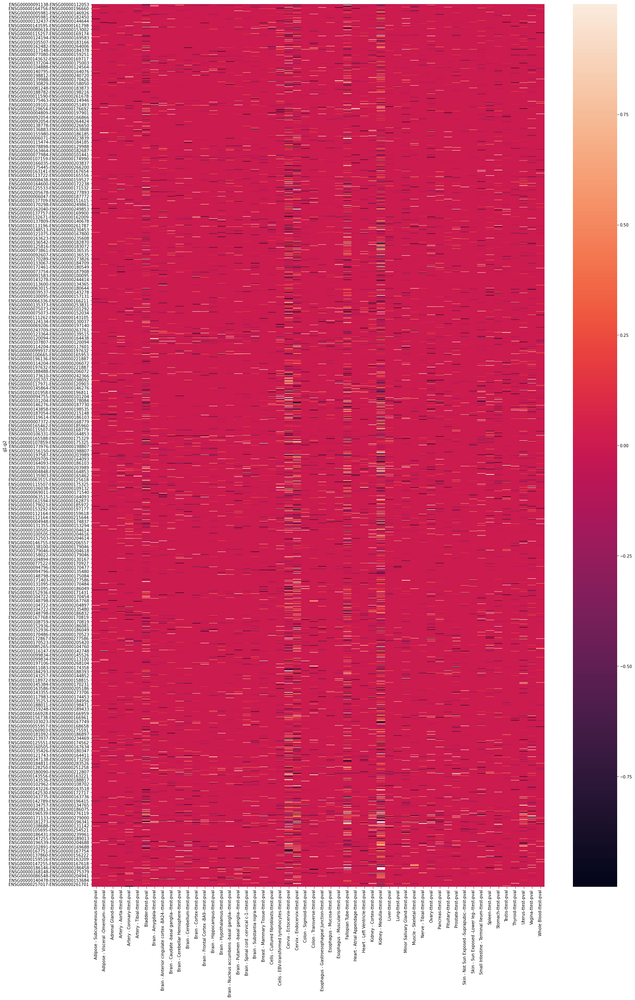

In [111]:
from seaborn import heatmap
fig, ax = pyplot.subplots(figsize=(25,40))
heatmap(ax=ax, data=neo_para[neo_para['g1']<neo_para['g2']].set_index(['g1','g2'])[[c for c in neo_para.columns if c.endswith('-ttest-pval')]])

In [209]:
%%capture out
from seaborn import clustermap
from scipy.cluster.hierarchy import cut_tree
filt_neo_para = neo_para[neo_para['g1']<neo_para['g2']].sort_values(by=['Entropy-g1'])
filt_neo_para_data=filt_neo_para.set_index(['g1','g2'])[[c for c in neo_para.columns if c.endswith('-mean-log-diff')]]
cluster=clustermap(figsize=(25,900), data=filt_neo_para_data, row_linkage=linkage(filt_neo_para_data, 'single', para_corr))
filt_neo_para.assign(clust=[i[0] for i in cut_tree(cluster.dendrogram_row.linkage,1000)]).iloc[cluster.dendrogram_row.reordered_ind].assign(similarity=[1.0-para_corr(x[0], x[1]) for x in zip(filt_neo_para_data.iloc[cluster.dendrogram_row.reordered_ind[0:-1]].iloc,filt_neo_para_data.iloc[cluster.dendrogram_row.reordered_ind[1:]].iloc)]+[0.0]).to_csv('large-human-paralog-clusters.csv')
open('para-human-large.png', 'wb').write(out.outputs[0].data['image/png'])
#cluster

In [210]:
open('para-human-large.png', 'wb').write(out.outputs[0].data['image/png'])


KeyError: 'image/png'

In [215]:
import dendrogram
import importlib
importlib.reload(dendrogram)
dendrogram.HeatmapDisplay(cluster)

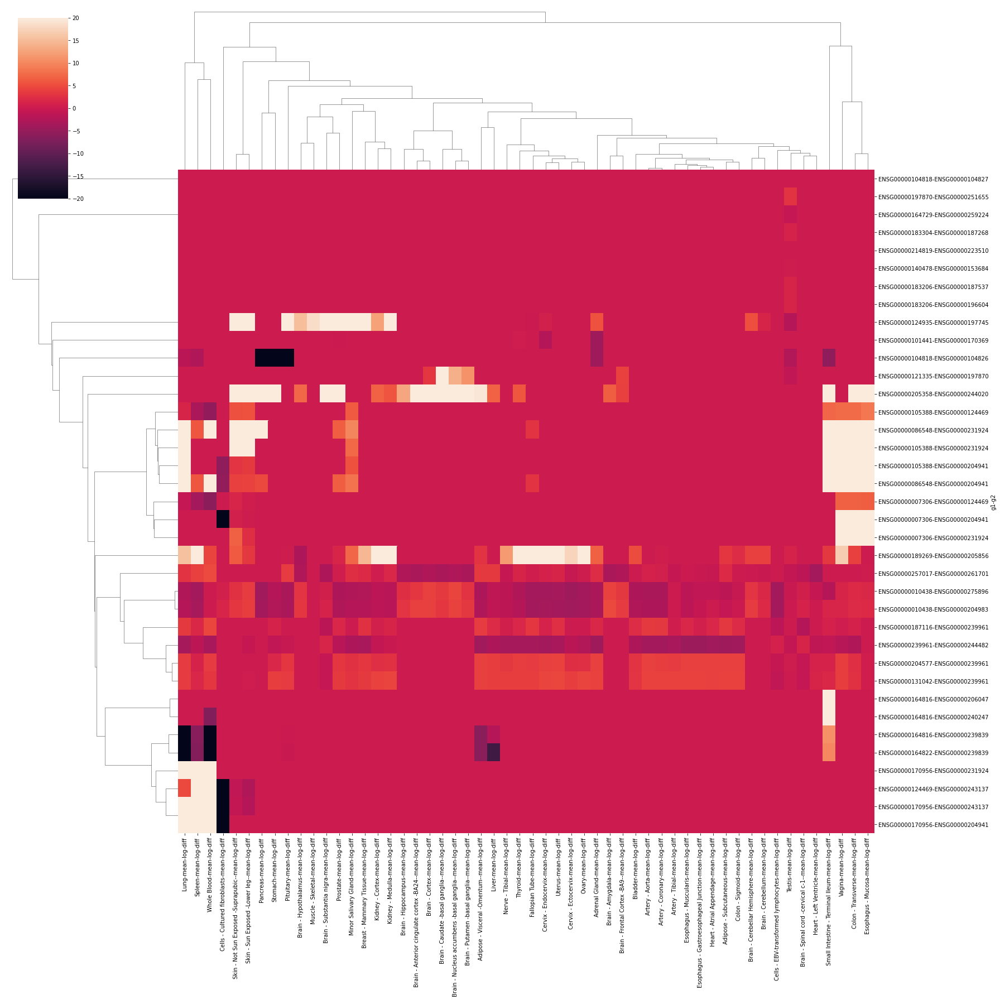

In [113]:
filt_neo_para = neo_para[(neo_para['g1']<neo_para['g2'])&(neo_para['Branch point'].isin(["Primates", "Haplorrhini", "Simiiformes", "Catarrhini","Hominoidea", "Hominidae", "Homininae", "Homo sapiens"]))].sort_values(by=['Entropy-g1'])
filt_neo_para_data=filt_neo_para.set_index(['g1','g2'])[[c for c in neo_para.columns if c.endswith('-mean-log-diff')]]

cluster=clustermap(figsize=(25,25), data=filt_neo_para_data, row_linkage=linkage(filt_neo_para_data, method='single', metric=para_corr))


In [114]:
from scipy.cluster.hierarchy import cut_tree, to_tree
dir(cluster.dendrogram_row)
dlinkage=cut_tree(cluster.dendrogram_row.linkage, n_clusters=2)
to_tree(cluster.dendrogram_row.linkage)
#print(dlinkage.T)

In [115]:
np.savetxt("dlink.txt", dlinkage, fmt='%d')

<AxesSubplot:ylabel='g1-g2'>

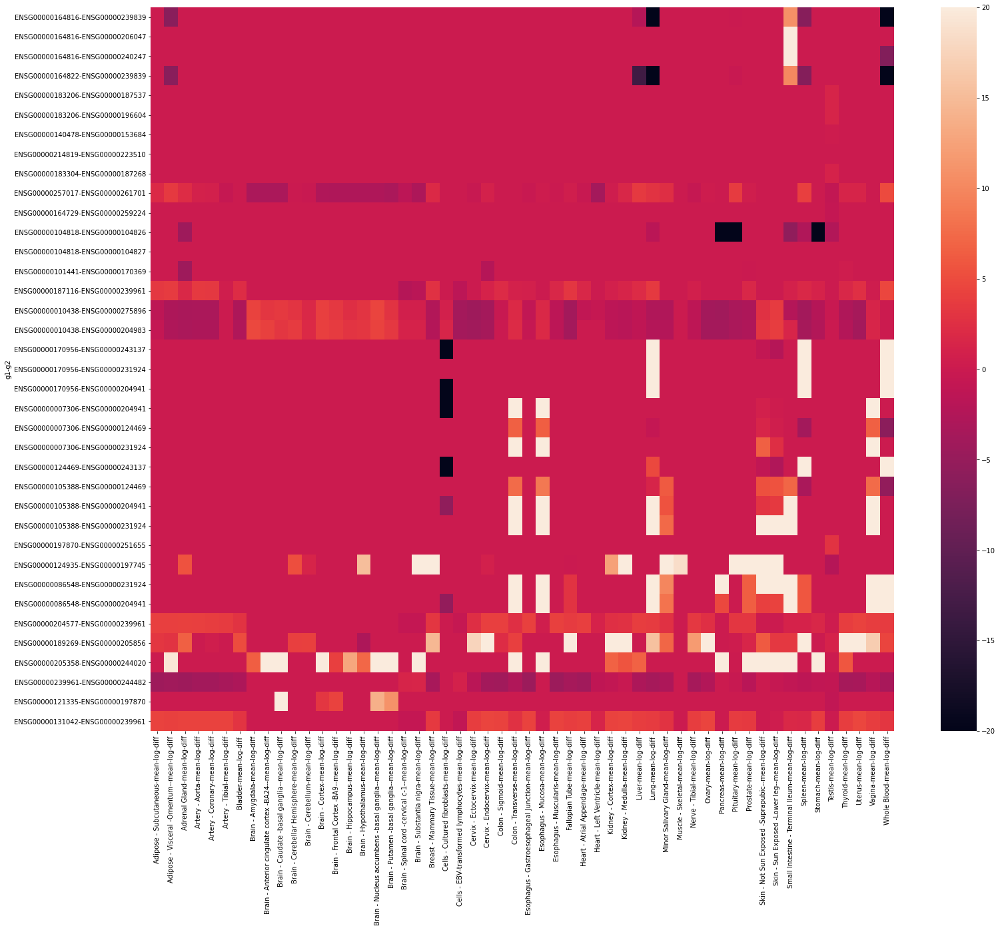

In [116]:
from seaborn import heatmap
fig, ax = pyplot.subplots(figsize=(25,20))
#"Primates", "Haplorrhini", "Simiiformes", "Catarrhini","Hominoidea", "Hominidae", "Homininae", "Homo sapiens"
heatmap(ax=ax, data=neo_para[(neo_para['g1']<neo_para['g2'])&(neo_para['Branch point'].isin(["Primates", "Haplorrhini", "Simiiformes", "Catarrhini","Hominoidea", "Hominidae", "Homininae", "Homo sapiens"]))].sort_values(by=['Entropy-g1']).set_index(['g1','g2'])[[c for c in neo_para.columns if c.endswith('-mean-log-diff')]])

/home/gencpg/.local/lib/python3.6/site-packages/numpy/lib/function_base.py:2559: RuntimeWarning: invalid value encountered in true_divide
  c /= stddev[:, None]
/home/gencpg/.local/lib/python3.6/site-packages/numpy/lib/function_base.py:2560: RuntimeWarning: invalid value encountered in true_divide
  c /= stddev[None, :]


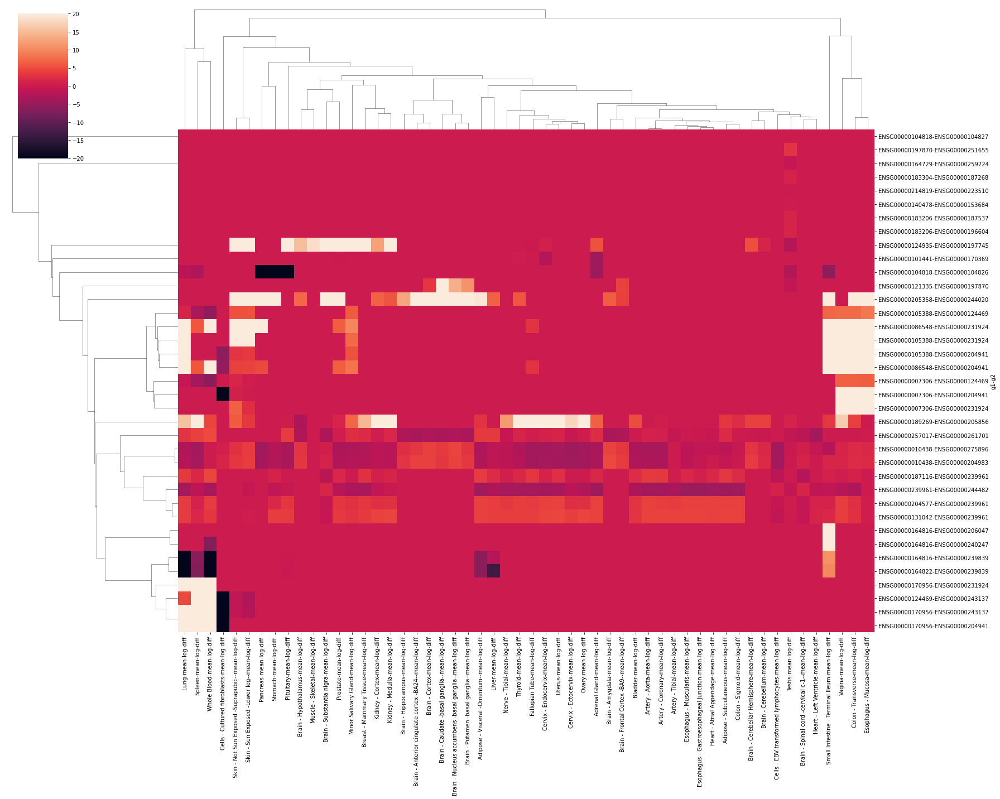

In [219]:
from seaborn import clustermap
#"Primates", "Haplorrhini", "Simiiformes", "Catarrhini","Hominoidea", "Hominidae", "Homininae", "Homo sapiens"
filt_neo_para = neo_para[(neo_para['g1']<neo_para['g2'])&(neo_para['Branch point'].isin(["Primates", "Haplorrhini", "Simiiformes", "Catarrhini","Hominoidea", "Hominidae", "Homininae", "Homo sapiens"]))].sort_values(by=['Entropy-g1'])
filt_neo_para_data = filt_neo_para.set_index(['g1','g2'])[[c for c in neo_para.columns if c.endswith('-mean-log-diff')]]
cluster=clustermap(figsize=(25,20), data=filt_neo_para_data, row_linkage=linkage(filt_neo_para_data, 'single', para_corr))
filt_neo_para.assign(clust=[i[0] for i in cut_tree(cluster.dendrogram_row.linkage,10)]).iloc[cluster.dendrogram_row.reordered_ind].assign(similarity=[1.0-para_corr(x[0], x[1]) for x in zip(filt_neo_para_data.iloc[cluster.dendrogram_row.reordered_ind[0:-1]].iloc,filt_neo_para_data.iloc[cluster.dendrogram_row.reordered_ind[1:]].iloc)]+[0.0]).to_csv('small-human-paralog-clusters.csv')
cluster

In [220]:
import dendrogram
import importlib
importlib.reload(dendrogram)
dendrogram.HeatmapDisplay(cluster)

In [221]:
neo_para[neo_para['g1']<neo_para['g2']].to_csv('neopara-hs.csv')

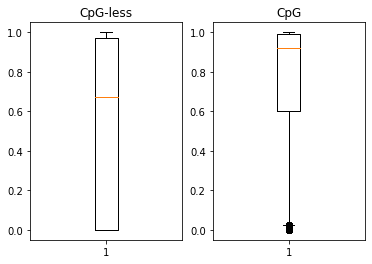

In [225]:
from matplotlib import pyplot as plt
fam_pvalues = {'gene:'+v.split()[0]:float(v.split()[1]) for v in open('human-genes-p-value.txt').readlines()}
plt.subplot(1,2,1, title='CpG-less')
plt.boxplot([fam_pvalues[g] for g in cpg_less if g in fam_pvalues])
plt.subplot(1,2,2, title='CpG')
plt.boxplot([fam_pvalues[g] for g in cpg_full if g in fam_pvalues])
plt.savefig('human-gene-gain-and-loss-pvalue.pdf', dpi=600)
 

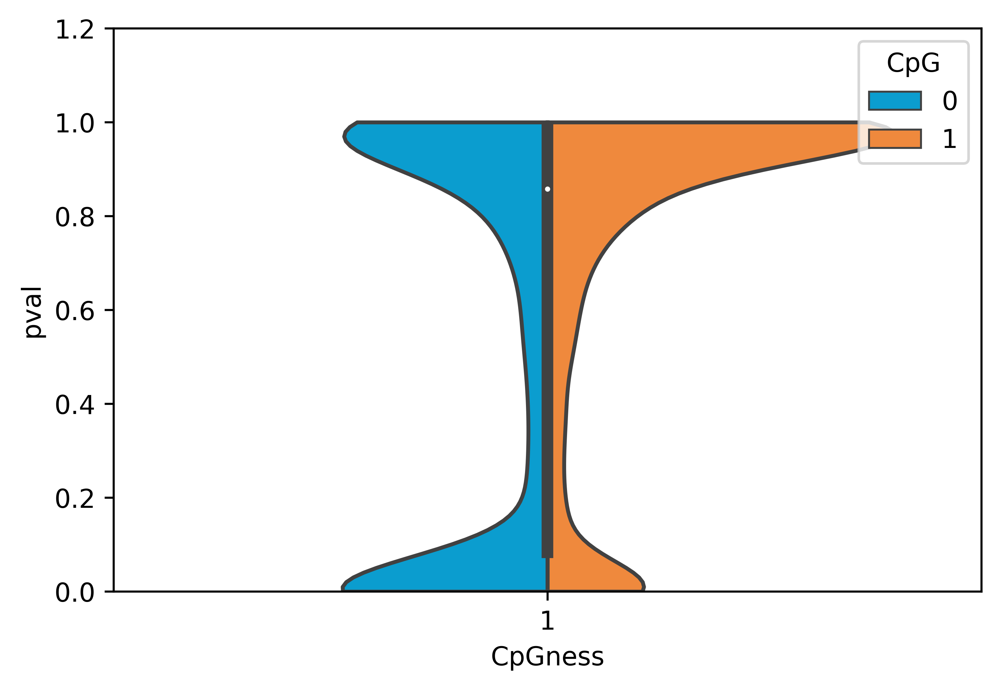

In [10]:
from matplotlib import pyplot as plt
from seaborn import violinplot
from pandas import DataFrame
import pandas as pd
fam_pvalues = {'gene:'+v.split()[0]:float(v.split()[1]) for v in open('human-genes-p-value.txt').readlines()}
fig, ax = plt.subplots(dpi=600)
plt.ylim(0,1.2)
violinplot(ax=ax, data=pd.concat((DataFrame({'pval':[fam_pvalues[g] for g in cpg_less if g in fam_pvalues]}).assign(CpG=0), DataFrame({'pval':[fam_pvalues[g] for g in cpg_full if g in fam_pvalues]}).assign(CpG=1))).assign(CpGness=1),
           x='CpGness', y='pval', hue='CpG', split=True, cut=0, saturation=1.0, palette=['#0B9DCF', '#EF893D'])
plt.savefig('human-gene-gain-and-loss-pvalue-violin.pdf')
 

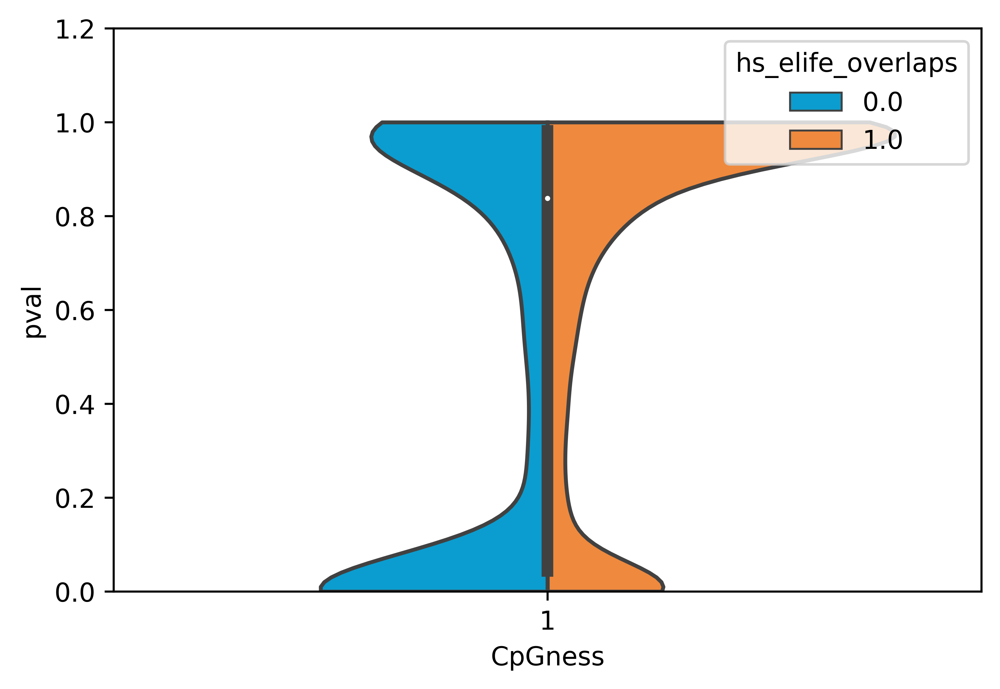

In [164]:
from matplotlib import pyplot as plt
from seaborn import violinplot
import pandas as pd
fam_pvalues = {v.split()[0]:float(v.split()[1]) for v in open('human-genes-p-value.txt').readlines()}
fig, ax = plt.subplots(dpi=600)
plt.ylim(0.0, 1.2)
violinplot(ax=ax, data=DataFrame.from_dict(fam_pvalues, orient='index', columns=['pval']).join(exp_genes['hs_elife_overlaps']).assign(CpGness=1),
           x='CpGness', y='pval', hue='hs_elife_overlaps', split=True, cut=0, saturation=1.0, palette = ['#0B9DCF', '#EF893D'])
plt.savefig('human-gene-gain-and-loss-pvalue-violin-elife.pdf')
 

In [16]:
from scipy.stats import mannwhitneyu
print('Mann-Whitney on -300+100: 50%% %s'%str(mannwhitneyu([fam_pvalues['gene:'+g] for g in exp_genes[exp_genes['ucsc_overlaps_300']<0.5].index if 'gene:'+g in fam_pvalues], [fam_pvalues['gene:'+g] for g in exp_genes[exp_genes['ucsc_overlaps_300']>=0.5].index if 'gene:'+g in fam_pvalues], alternative='less')))
print('Mann-Whitney on -1000+1000: 1bp %s'%str(mannwhitneyu([fam_pvalues['gene:'+g] for g in exp_genes[exp_genes['hs_elife_overlaps']<0.5].index if 'gene:'+g in fam_pvalues], [fam_pvalues['gene:'+g] for g in exp_genes[exp_genes['hs_elife_overlaps']>=0.5].index if 'gene:'+g in fam_pvalues], alternative='less')))

Mann-Whitney on -300+100: 50% MannwhitneyuResult(statistic=35648069.5, pvalue=8.773542402206634e-222)
Mann-Whitney on -1000+1000: 1bp MannwhitneyuResult(statistic=29897833.0, pvalue=7.330896199193812e-255)


In [33]:
import numpy as np
np.log(pickle.load(open('/data/db/import/save/paralogs-genexpr.pkl', 'rb')).drop(columns=['cpgness', 'cpgfull']).max(axis=1))

/home/gencpg/.local/lib/python3.8/site-packages/pandas/core/arraylike.py:397: RuntimeWarning: divide by zero encountered in log
  result = getattr(ufunc, method)(*inputs, **kwargs)


ENSG00000186092    -2.271872
ENSG00000187634     3.504614
ENSG00000188976     4.591736
ENSG00000187961     3.427434
ENSG00000187583     4.326484
                     ...    
ENSG00000212907    10.417942
ENSG00000198886    11.097648
ENSG00000198786     9.375244
ENSG00000198695     9.426516
ENSG00000198727    10.755221
Length: 19255, dtype: float64

In [42]:
from matplotlib import pyplot as plt
from seaborn import violinplot
from pandas import DataFrame
import pandas as pd
import numpy as np
from row_matchers import one_to_one_matches
fam_pvalues = {'gene:'+v.split()[0]:float(v.split()[1]) for v in open('human-genes-p-value.txt').readlines()}
dt_cpg_expr=DataFrame({'gene': [g.split(':')[1] for g in fam_pvalues], 'pval':[fam_pvalues[g] for g in fam_pvalues]})\
  .assign(CpGness=1).set_index('gene').join(exp_genes, how='inner').join(
    np.log(pickle.load(open('/data/db/import/save/paralogs-genexpr.pkl', 'rb')).drop(columns=['cpgness', 'cpgfull']).max(axis=1)).rename('exprlog'))[['cpgfull', 'exprlog', 'pval']].dropna()
dt_less_expr, dt_full_expr=one_to_one_matches(dt_cpg_expr[(abs(dt_cpg_expr['exprlog']) != np.inf)&dt_cpg_expr['exprlog'].notna()&dt_cpg_expr['cpgfull']==0], dt_cpg_expr[(abs(dt_cpg_expr['exprlog']) != np.inf)&dt_cpg_expr['exprlog'].notna()&dt_cpg_expr['cpgfull']==1], 'exprlog', 0.1)
dt_less_expr


/home/gencpg/.local/lib/python3.8/site-packages/pandas/core/arraylike.py:397: RuntimeWarning: divide by zero encountered in log
  result = getattr(ufunc, method)(*inputs, **kwargs)


,cpgfull,exprlog,pval
ENSG00000243130,False,-4.013342,0.000
ENSG00000182330,False,-3.649640,0.000
ENSG00000234829,False,-3.633785,0.000
ENSG00000229924,False,-3.628793,0.000
ENSG00000112115,False,-3.484346,0.980
...,...,...,...
ENSG00000111341,False,9.387281,0.847
ENSG00000189058,False,9.549167,1.000
ENSG00000142789,False,10.195627,0.000
ENSG00000175535,False,10.354340,0.591


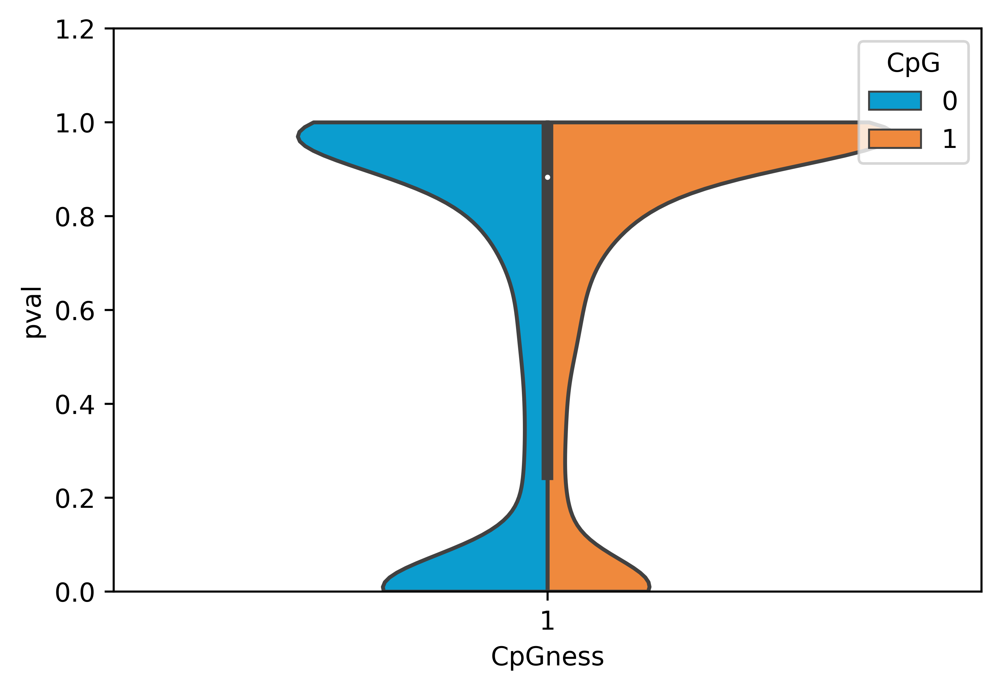

In [43]:
from matplotlib import pyplot as plt
from seaborn import violinplot
from pandas import DataFrame
import pandas as pd
fig, ax = plt.subplots(dpi=600)
plt.ylim(0,1.2)
violinplot(ax=ax, data=pd.concat((DataFrame({'pval':dt_less_expr['pval'].values}).assign(CpG=0), DataFrame({'pval':dt_full_expr['pval'].values}).assign(CpG=1))).assign(CpGness=1),
           x='CpGness', y='pval', hue='CpG', split=True, cut=0, saturation=1.0, palette=['#0B9DCF', '#EF893D'])
plt.savefig('human-gene-gain-and-loss-pvalue-violin-expr-ctrl.pdf')
 

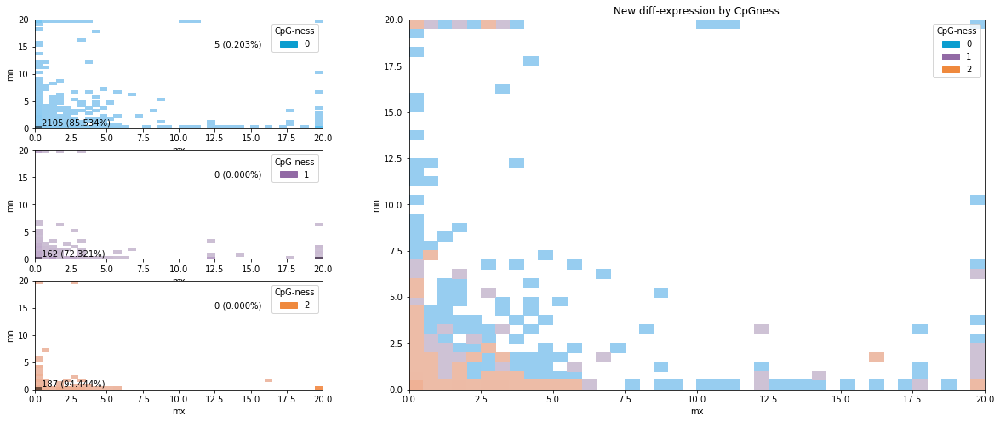

In [24]:
diffcols = [c for c in export.columns if c.endswith('-mean-log-diff')]
neo_para_recent = export[(export['g1']<export['g2'])&(export['Branch point'].isin(["Primates", "Haplorrhini", "Simiiformes", "Catarrhini","Hominoidea", "Hominidae", "Homininae", "Homo sapiens"]))]
neo_para_recent = neo_para_recent.set_index(['g1','g2'])
neo_para_recent = neo_para_recent.assign(mx=neo_para_recent[diffcols].max(axis=1), mn=-neo_para_recent[diffcols].min(axis=1))[['mx', 'mn', 'CpG-ness']]

fig, ax = pyplot.subplots(figsize=(20,8), nrows=3, ncols=2, gridspec_kw={'width_ratios':[1,2]})
histplot(ax=ax[0,0], data=neo_para_recent[(neo_para_recent['mx']>=0) & (neo_para_recent['mn']>=0) & (neo_para_recent['CpG-ness']==0)], x='mx', y='mn',hue='CpG-ness', bins=(40,40), palette=['#0B9DCF'])
ax[0,0].text(12.5, 15, '%d (%0.3f%%)'%(((neo_para_recent['mx']>=10) & (neo_para_recent['mn']>=10) & (neo_para_recent['CpG-ness']==0)).sum(),100*((neo_para_recent['mx']>=10) & (neo_para_recent['mn']>=10) & (neo_para_recent['CpG-ness']==0)).sum()/((neo_para_recent['mx']>=0) & (neo_para_recent['mn']>=0) & (neo_para_recent['CpG-ness']==0)).sum()))
ax[0,0].text(0.5, 0.5, '%d (%0.3f%%)'%(((neo_para_recent['mx']<=5) & (neo_para_recent['mn']<=5) & (neo_para_recent['CpG-ness']==0)).sum(),100*((neo_para_recent['mx']<=5) & (neo_para_recent['mn']<=5) & (neo_para_recent['CpG-ness']==0)).sum()/((neo_para_recent['mx']>=0) & (neo_para_recent['mn']>=0) & (neo_para_recent['CpG-ness']==0)).sum()))
histplot(ax=ax[1,0], data=neo_para_recent[(neo_para_recent['mx']>=0) & (neo_para_recent['mn']>=0) & (neo_para_recent['CpG-ness']==1)], x='mx', y='mn',hue='CpG-ness', bins=(40,40), palette=['#926AA5'])
ax[1,0].text(12.5, 15, '%d (%0.3f%%)'%(((neo_para_recent['mx']>=10) & (neo_para_recent['mn']>=10) & (neo_para_recent['CpG-ness']==1)).sum(),100*((neo_para_recent['mx']>=10) & (neo_para_recent['mn']>=10) & (neo_para_recent['CpG-ness']==1)).sum()/((neo_para_recent['mx']>=0) & (neo_para_recent['mn']>=0) & (neo_para_recent['CpG-ness']==1)).sum()))
ax[1,0].text(0.5, 0.5, '%d (%0.3f%%)'%(((neo_para_recent['mx']<=5) & (neo_para_recent['mn']<=5) & (neo_para_recent['CpG-ness']==1)).sum(),100*((neo_para_recent['mx']<=5) & (neo_para_recent['mn']<=5) & (neo_para_recent['CpG-ness']==1)).sum()/((neo_para_recent['mx']>=0) & (neo_para_recent['mn']>=0) & (neo_para_recent['CpG-ness']==1)).sum()))
histplot(ax=ax[2,0], data=neo_para_recent[(neo_para_recent['mx']>=0) & (neo_para_recent['mn']>=0) & (neo_para_recent['CpG-ness']==2)], x='mx', y='mn',hue='CpG-ness', bins=(40,40), palette=['#EF893D'])
ax[2,0].text(12.5, 15, '%d (%0.3f%%)'%(((neo_para_recent['mx']>=10) & (neo_para_recent['mn']>=10) & (neo_para_recent['CpG-ness']==2)).sum(),100*((neo_para_recent['mx']>=10) & (neo_para_recent['mn']>=10) & (neo_para_recent['CpG-ness']==2)).sum()/((neo_para_recent['mx']>=0) & (neo_para_recent['mn']>=0) & (neo_para_recent['CpG-ness']==2)).sum()))
ax[2,0].text(0.5, 0.5, '%d (%0.3f%%)'%(((neo_para_recent['mx']<=5) & (neo_para_recent['mn']<=5) & (neo_para_recent['CpG-ness']==2)).sum(),100*((neo_para_recent['mx']<=5) & (neo_para_recent['mn']<=5) & (neo_para_recent['CpG-ness']==2)).sum()/((neo_para_recent['mx']>=0) & (neo_para_recent['mn']>=0) & (neo_para_recent['CpG-ness']==2)).sum()))
gs = ax[0, 1].get_gridspec()
for a in ax[:, -1]:
  a.remove()
axbig = fig.add_subplot(gs[:, -1])

histplot(ax=axbig, data=neo_para_recent[(neo_para_recent['mx']>=0) & (neo_para_recent['mn']>=0)], x='mx', y='mn',hue='CpG-ness', bins=(40,40), palette=['#0B9DCF','#926AA5','#EF893D'])
title('New diff-expression by CpGness')
plt.savefig('human-diff-expression-new.pdf')

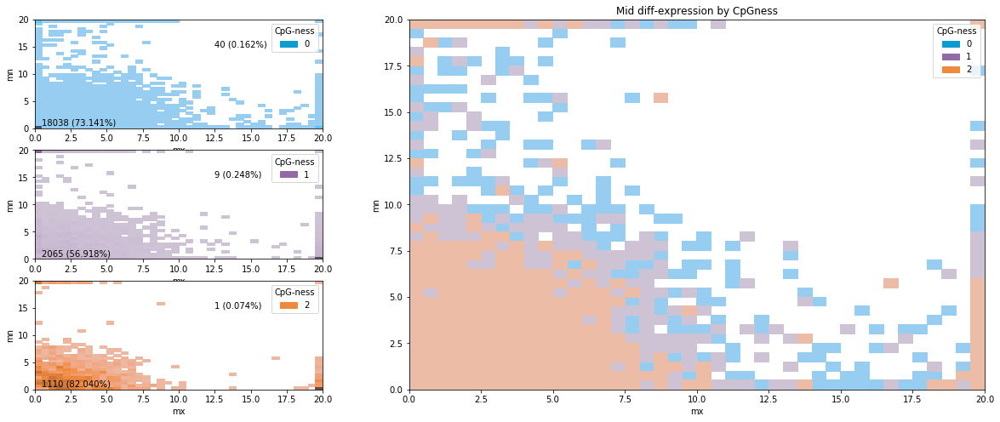

In [26]:
diffcols = [c for c in export.columns if c.endswith('-mean-log-diff')]
neo_para_mid = export[(export['g1']<export['g2'])&(~export['Branch point'].isin(["Opisthokonta", "Bilateria", "Primates", "Haplorrhini", "Simiiformes", "Catarrhini","Hominoidea", "Hominidae", "Homininae", "Homo sapiens"]))]
neo_para_mid = neo_para_mid.set_index(['g1','g2'])
neo_para_mid = neo_para_mid.assign(mx=neo_para_mid[diffcols].max(axis=1), mn=-neo_para_mid[diffcols].min(axis=1))[['mx', 'mn', 'CpG-ness']]

fig, ax = pyplot.subplots(figsize=(20,8), nrows=3, ncols=2, gridspec_kw={'width_ratios':[1,2]})
histplot(ax=ax[0,0], data=neo_para_mid[(neo_para_mid['mx']>=0) & (neo_para_mid['mn']>=0) & (neo_para_mid['CpG-ness']==0)], x='mx', y='mn',hue='CpG-ness', bins=(40,40), palette=['#0B9DCF'])
ax[0,0].text(12.5, 15, '%d (%0.3f%%)'%(((neo_para_mid['mx']>=10) & (neo_para_mid['mn']>=10) & (neo_para_mid['CpG-ness']==0)).sum(),100*((neo_para_mid['mx']>=10) & (neo_para_mid['mn']>=10) & (neo_para_mid['CpG-ness']==0)).sum()/((neo_para_mid['mx']>=0) & (neo_para_mid['mn']>=0) & (neo_para_mid['CpG-ness']==0)).sum()))
ax[0,0].text(0.5, 0.5, '%d (%0.3f%%)'%(((neo_para_mid['mx']<=5) & (neo_para_mid['mn']<=5) & (neo_para_mid['CpG-ness']==0)).sum(),100*((neo_para_mid['mx']<=5) & (neo_para_mid['mn']<=5) & (neo_para_mid['CpG-ness']==0)).sum()/((neo_para_mid['mx']>=0) & (neo_para_mid['mn']>=0) & (neo_para_mid['CpG-ness']==0)).sum()))
histplot(ax=ax[1,0], data=neo_para_mid[(neo_para_mid['mx']>=0) & (neo_para_mid['mn']>=0) & (neo_para_mid['CpG-ness']==1)], x='mx', y='mn',hue='CpG-ness', bins=(40,40), palette=['#926AA5'])
ax[1,0].text(12.5, 15, '%d (%0.3f%%)'%(((neo_para_mid['mx']>=10) & (neo_para_mid['mn']>=10) & (neo_para_mid['CpG-ness']==1)).sum(),100*((neo_para_mid['mx']>=10) & (neo_para_mid['mn']>=10) & (neo_para_mid['CpG-ness']==1)).sum()/((neo_para_mid['mx']>=0) & (neo_para_mid['mn']>=0) & (neo_para_mid['CpG-ness']==1)).sum()))
ax[1,0].text(0.5, 0.5, '%d (%0.3f%%)'%(((neo_para_mid['mx']<=5) & (neo_para_mid['mn']<=5) & (neo_para_mid['CpG-ness']==1)).sum(),100*((neo_para_mid['mx']<=5) & (neo_para_mid['mn']<=5) & (neo_para_mid['CpG-ness']==1)).sum()/((neo_para_mid['mx']>=0) & (neo_para_mid['mn']>=0) & (neo_para_mid['CpG-ness']==1)).sum()))
histplot(ax=ax[2,0], data=neo_para_mid[(neo_para_mid['mx']>=0) & (neo_para_mid['mn']>=0) & (neo_para_mid['CpG-ness']==2)], x='mx', y='mn',hue='CpG-ness', bins=(40,40), palette=['#EF893D'])
ax[2,0].text(12.5, 15, '%d (%0.3f%%)'%(((neo_para_mid['mx']>=10) & (neo_para_mid['mn']>=10) & (neo_para_mid['CpG-ness']==2)).sum(),100*((neo_para_mid['mx']>=10) & (neo_para_mid['mn']>=10) & (neo_para_mid['CpG-ness']==2)).sum()/((neo_para_mid['mx']>=0) & (neo_para_mid['mn']>=0) & (neo_para_mid['CpG-ness']==2)).sum()))
ax[2,0].text(0.5, 0.5, '%d (%0.3f%%)'%(((neo_para_mid['mx']<=5) & (neo_para_mid['mn']<=5) & (neo_para_mid['CpG-ness']==2)).sum(),100*((neo_para_mid['mx']<=5) & (neo_para_mid['mn']<=5) & (neo_para_mid['CpG-ness']==2)).sum()/((neo_para_mid['mx']>=0) & (neo_para_mid['mn']>=0) & (neo_para_mid['CpG-ness']==2)).sum()))
gs = ax[0, 1].get_gridspec()
for a in ax[:, -1]:
  a.remove()
axbig = fig.add_subplot(gs[:, -1])

histplot(ax=axbig, data=neo_para_mid[(neo_para_mid['mx']>=0) & (neo_para_mid['mn']>=0)], x='mx', y='mn',hue='CpG-ness', bins=(40,40), palette=['#0B9DCF','#926AA5','#EF893D'])

title('Mid diff-expression by CpGness')
plt.savefig('human-diff-expression-mid.pdf')

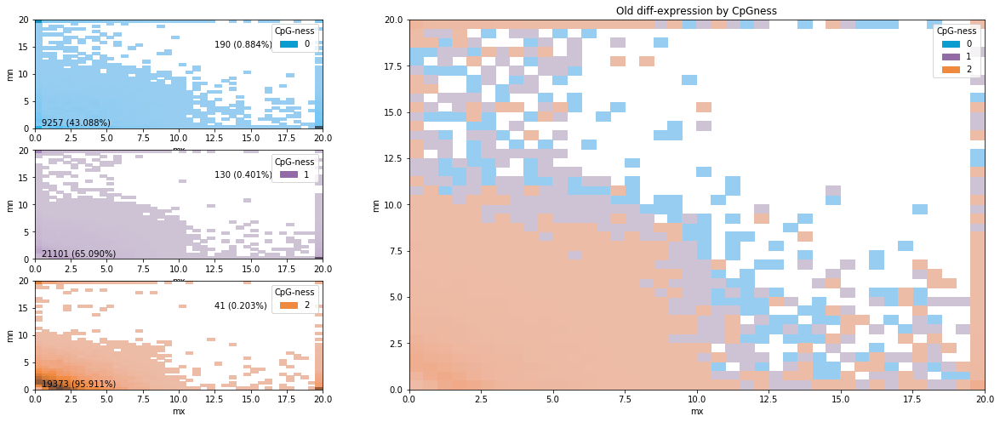

In [27]:
diffcols = [c for c in export.columns if c.endswith('-mean-log-diff')]
neo_para_old = export[(export['g1']<export['g2'])&(export['Branch point'].isin(["Opisthokonta", "Bilateria"]))]
neo_para_old = neo_para_old.set_index(['g1','g2'])
neo_para_old = neo_para_old.assign(mx=neo_para_old[diffcols].max(axis=1), mn=-neo_para_old[diffcols].min(axis=1))[['mx', 'mn', 'CpG-ness']]



fig, ax = pyplot.subplots(figsize=(20,8), nrows=3, ncols=2, gridspec_kw={'width_ratios':[1,2]})
histplot(ax=ax[0,0], data=neo_para_old[(neo_para_old['mx']>=0) & (neo_para_old['mn']>=0) & (neo_para_old['CpG-ness']==0)], x='mx', y='mn',hue='CpG-ness', bins=(40,40), palette=['#0B9DCF'])
ax[0,0].text(12.5, 15, '%d (%0.3f%%)'%(((neo_para_old['mx']>=10) & (neo_para_old['mn']>=10) & (neo_para_old['CpG-ness']==0)).sum(),100*((neo_para_old['mx']>=10) & (neo_para_old['mn']>=10) & (neo_para_old['CpG-ness']==0)).sum()/((neo_para_old['mx']>=0) & (neo_para_old['mn']>=0) & (neo_para_old['CpG-ness']==0)).sum()))
ax[0,0].text(0.5, 0.5, '%d (%0.3f%%)'%(((neo_para_old['mx']<=5) & (neo_para_old['mn']<=5) & (neo_para_old['CpG-ness']==0)).sum(),100*((neo_para_old['mx']<=5) & (neo_para_old['mn']<=5) & (neo_para_old['CpG-ness']==0)).sum()/((neo_para_old['mx']>=0) & (neo_para_old['mn']>=0) & (neo_para_old['CpG-ness']==0)).sum()))
histplot(ax=ax[1,0], data=neo_para_old[(neo_para_old['mx']>=0) & (neo_para_old['mn']>=0) & (neo_para_old['CpG-ness']==1)], x='mx', y='mn',hue='CpG-ness', bins=(40,40), palette=['#926AA5'])
ax[1,0].text(12.5, 15, '%d (%0.3f%%)'%(((neo_para_old['mx']>=10) & (neo_para_old['mn']>=10) & (neo_para_old['CpG-ness']==1)).sum(),100*((neo_para_old['mx']>=10) & (neo_para_old['mn']>=10) & (neo_para_old['CpG-ness']==1)).sum()/((neo_para_old['mx']>=0) & (neo_para_old['mn']>=0) & (neo_para_old['CpG-ness']==1)).sum()))
ax[1,0].text(0.5, 0.5, '%d (%0.3f%%)'%(((neo_para_old['mx']<=5) & (neo_para_old['mn']<=5) & (neo_para_old['CpG-ness']==1)).sum(),100*((neo_para_old['mx']<=5) & (neo_para_old['mn']<=5) & (neo_para_old['CpG-ness']==1)).sum()/((neo_para_old['mx']>=0) & (neo_para_old['mn']>=0) & (neo_para_old['CpG-ness']==1)).sum()))
histplot(ax=ax[2,0], data=neo_para_old[(neo_para_old['mx']>=0) & (neo_para_old['mn']>=0) & (neo_para_old['CpG-ness']==2)], x='mx', y='mn',hue='CpG-ness', bins=(40,40), palette=['#EF893D'])
ax[2,0].text(12.5, 15, '%d (%0.3f%%)'%(((neo_para_old['mx']>=10) & (neo_para_old['mn']>=10) & (neo_para_old['CpG-ness']==2)).sum(),100*((neo_para_old['mx']>=10) & (neo_para_old['mn']>=10) & (neo_para_old['CpG-ness']==2)).sum()/((neo_para_old['mx']>=0) & (neo_para_old['mn']>=0) & (neo_para_old['CpG-ness']==2)).sum()))
ax[2,0].text(0.5, 0.5, '%d (%0.3f%%)'%(((neo_para_old['mx']<=5) & (neo_para_old['mn']<=5) & (neo_para_old['CpG-ness']==2)).sum(),100*((neo_para_old['mx']<=5) & (neo_para_old['mn']<=5) & (neo_para_old['CpG-ness']==2)).sum()/((neo_para_old['mx']>=0) & (neo_para_old['mn']>=0) & (neo_para_old['CpG-ness']==2)).sum()))
gs = ax[0, 1].get_gridspec()
for a in ax[:, -1]:
  a.remove()
axbig = fig.add_subplot(gs[:, -1])

histplot(ax=axbig, data=neo_para_old[(neo_para_old['mx']>=0) & (neo_para_old['mn']>=0)], x='mx', y='mn',hue='CpG-ness', bins=(40,40), palette=['#0B9DCF','#926AA5','#EF893D'])
title('Old diff-expression by CpGness')
plt.savefig('human-diff-expression-old.pdf')

In [39]:
len(neo_para_old)

96552

In [58]:
from scipy.stats import mannwhitneyu
print('Recent: %s'%str(mannwhitneyu((abs(neo_para_recent.dropna()['mn'])+abs(neo_para_recent.dropna()['mx']))[neo_para_recent.dropna()['CpG-ness']==0],(abs(neo_para_recent.dropna()['mn'])+abs(neo_para_recent.dropna()['mx']))[neo_para_recent.dropna()['CpG-ness']==2], alternative='two-sided')))
print('Mid: %s'%str(mannwhitneyu((abs(neo_para_mid.dropna()['mn'])+abs(neo_para_mid.dropna()['mx']))[neo_para_mid.dropna()['CpG-ness']==0],(abs(neo_para_mid.dropna()['mn'])+abs(neo_para_mid.dropna()['mx']))[neo_para_mid.dropna()['CpG-ness']==2], alternative='two-sided')))
print('Old: %s'%str(mannwhitneyu((abs(neo_para_old.dropna()['mn'])+abs(neo_para_old.dropna()['mx']))[neo_para_old.dropna()['CpG-ness']==0],(abs(neo_para_old.dropna()['mn'])+abs(neo_para_old.dropna()['mx']))[neo_para_old.dropna()['CpG-ness']==2], alternative='two-sided')))

Recent: MannwhitneyuResult(statistic=276255.5, pvalue=0.11829903939662828)
Mid: MannwhitneyuResult(statistic=12637250.5, pvalue=3.0416173893056497e-205)
Old: MannwhitneyuResult(statistic=456248894.5, pvalue=0.0)


In [43]:
pickle.dump(tfbm_scores, open('/data/db/import/save/human-tfbm-scores.pkl', 'wb'))
pickle.dump(tfbm_scores_pct, open('/data/db/import/save/human-tfbm-scores-pct.pkl', 'wb'))